In [1]:
# Import standard libraries 
import warnings
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import datasets
import random 
import numpy.random as rand
from random import randrange
from scipy.stats import bernoulli, binom
import seaborn as sns
from scipy import stats 
from psmpy.functions import cohenD
from psmpy.plotting import *

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# Helper functions for plotting

def quick_plot_2(dataset,variable,variable2,variable3):
  plt.figure(figsize=(15,8))
  #Density plots for treatment and control
  sns.kdeplot(dataset=dataset[variable][(dataset[variable2]==0) & (nsw[variable3]==1)])
  sns.kdeplot(dataset=dataset[variable][(dataset[variable2]==1) & (nsw[variable3]==0)])
  sns.kdeplot(dataset=dataset[variable][(dataset[variable2]==0) & (nsw[variable3]==0)])
  return 

def quick_mean_sd(dataset):
  nsw_teatment_subsample = dataset[dataset['treat']==1]
  nsw_control_subsample = dataset[dataset['treat']==0]
  treatment_subsample_mean_sd = nsw_teatment_subsample.describe().loc[['mean','std']].T
  control_subsample_mean_sd = nsw_control_subsample.describe().loc[['mean','std']].T
  treat_control_comparison = pd.concat([treatment_subsample_mean_sd, control_subsample_mean_sd], axis=1)
  superlables = {'treated':['mean','sd'],'control':['mean','sd']}
  treat_control_comparison.columns = pd.MultiIndex.from_frame(pd.DataFrame(superlables).melt())
  return print(treat_control_comparison)
  
def quick_plot(dataset,var1,var2):
  plt.figure(figsize=(15,8))
  #Density plots for treatment and control
  g1 = sns.kdeplot(data=dataset[var1][dataset[var2]==1],color = 'firebrick',label= str(var2)+'_1')
  g1 = sns.kdeplot(data=dataset[var1][dataset[var2]==0],color = 'forestgreen',label= str(var2)+'_0')
  plt.legend(fontsize=15)
  return 


# 1 - Load data sets 

In [3]:
'''
Load all datasets.
nsw = Male sub sample of treated and control units as used by Lalonde (1986).
nswre74  = Further subsample extracted by Dehejia and Wahba (1999) which includes information on earnings in 1974 (re74)

cps1 = full Current Population Survey dataset
cps2 , cps3 and cps4 are further subsamples exctracted by lalonde to with distributions which better match the nsw treated group.

psid1 = full Panel Study of Income Dynamics dataset
psid2,psid3,psid4 are again subsamples extracted by Lalonde 

'''
# experimental data 

nsw = pd.read_stata("/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/nsw.dta")
nsw.drop('data_id', axis=1, inplace=True)
nswre74_control = pd.read_excel('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/nswre74_control.xls')
nswre74_treated = pd.read_excel('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/nswre74_treated.xlsx')
nswre74 = pd.concat([nswre74_control,nswre74_treated],axis=0,ignore_index=True) #Combine treatment into a single control as pandas dataframe

# non experimental data (cps)

cps = pd.read_stata("/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/cps_controls.dta")
cps.drop('data_id', axis=1, inplace=True)

#cps['treat'] == 0 # created treated column
#load non experimental data (psid)

psid = pd.read_stata("/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/psid_controls.dta")
psid.drop('data_id', axis=1, inplace=True)

# reset indexes

nsw = nsw.reset_index(drop=True)
nswre74 = nswre74.reset_index(drop=True)
cps = cps.reset_index(drop=True)
psid = psid.reset_index(drop=True)

# Exploratory Analysis

### Plotting functions

In [4]:
import scipy.stats as stat
import pylab 
from tueplots import axes, bundles , figsizes, fonts,fontsizes

#### Q-Q plot
def plot_data(df,feature,title):
    # neat plot 
    plt.rcParams.update({"figure.dpi": 150}) 
    plt.rcParams.update(bundles.neurips2022())
    plt.rcParams.update(fonts.neurips2022())
    plt.rcParams.update(axes.tick_direction( y="in"))
    plt.rcParams.update(axes.color(base="black"))
    plt.rcParams.update(figsizes.neurips2022(nrows=1, ncols=2))
    #historigram
    plt.figure(figsize=(4,3))
    plt.subplot(1,2,1)
    plt.grid(color='white', axis='y')
    plt.grid(color='white', axis='x')
    plt.tick_params(right='on')
    plt.tick_params(left='on')
    plt.tick_params(top='on')
    plt.title("Histogram")
    df[feature].hist(bins=20)
    #qq plot 
    plt.subplot(1,2,2)
    plt.grid(color='white', axis='y')
    plt.grid(color='white', axis='x')
    stat.probplot(df[feature],dist='norm',plot=pylab)
    plt.suptitle(title)
    plt.show()

In [5]:
import matplotlib.gridspec as gridspec

class SeabornFigToGrid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if isinstance(self.sg, sns.axisgrid.FacetGrid) or \
            isinstance(self.sg, sns.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        #https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())

In [6]:
nsw[nsw['treat']==1].describe()
nsw[nsw['treat']==0].describe()

,treat,age,education,black,hispanic,married,nodegree,re75,re78
count,425.0,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000
mean,0.0,24.447059,10.188235,0.800000,0.112941,0.157647,0.814118,3026.682861,5090.047852
std,0.0,6.590276,1.618686,0.400471,0.316894,0.364839,0.389470,5201.246582,5718.085938
min,0.0,17.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,19.000000,9.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
50%,0.0,23.000000,10.000000,1.000000,0.000000,0.000000,1.000000,823.254395,3746.700928
75%,0.0,28.000000,11.000000,1.000000,0.000000,0.000000,1.000000,3649.769043,8329.823242
max,0.0,55.000000,14.000000,1.000000,1.000000,1.000000,1.000000,36941.269531,39483.531250


In [7]:
nswre74[nswre74['treat']==1].describe()
nswre74[nswre74['treat']==0].describe()

,treat,age,education,black,hispanic,married,nodegree,re74,re75,re78
count,260.0,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000
mean,0.0,25.053846,10.088462,0.826923,0.107692,0.153846,0.834615,2107.026658,1266.909002,4554.801126
std,0.0,7.057745,1.614325,0.379043,0.310589,0.361497,0.372244,5687.905694,3102.982044,5483.835991
min,0.0,17.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,19.000000,9.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,0.0,24.000000,10.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,3138.795500
75%,0.0,28.000000,11.000000,1.000000,0.000000,0.000000,1.000000,139.424700,650.096475,7288.420000
max,0.0,55.000000,14.000000,1.000000,1.000000,1.000000,1.000000,39570.680000,23031.980000,39483.530000


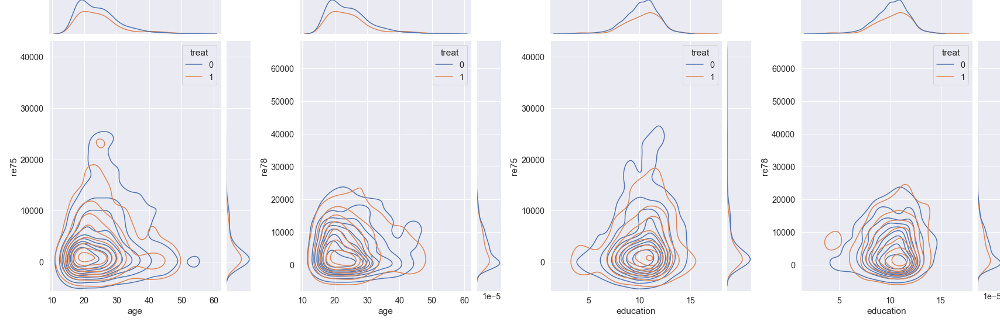

In [8]:
# Joint distributions
sns.set_style('darkgrid')

plot_kind = 'kde'
hue = 'treat'


g0 = sns.jointplot(data= nsw,x="age",y="re75", hue= hue, kind=plot_kind)
g1 = sns.jointplot(data= nsw,x="age",y="re78", hue= hue, kind=plot_kind)
g2 = sns.jointplot(data= nsw,x="education",y="re75", hue= hue, kind=plot_kind)
g3 = sns.jointplot(data= nsw,x="education",y="re78", hue= hue, kind=plot_kind)


fig = plt.figure(figsize=(24,8))
gs = gridspec.GridSpec(1,4)

mg0 = SeabornFigToGrid(g0, fig, gs[0])
mg1 = SeabornFigToGrid(g1, fig, gs[1])
mg2 = SeabornFigToGrid(g2, fig, gs[2])
mg3 = SeabornFigToGrid(g3, fig, gs[3])


gs.tight_layout(fig)


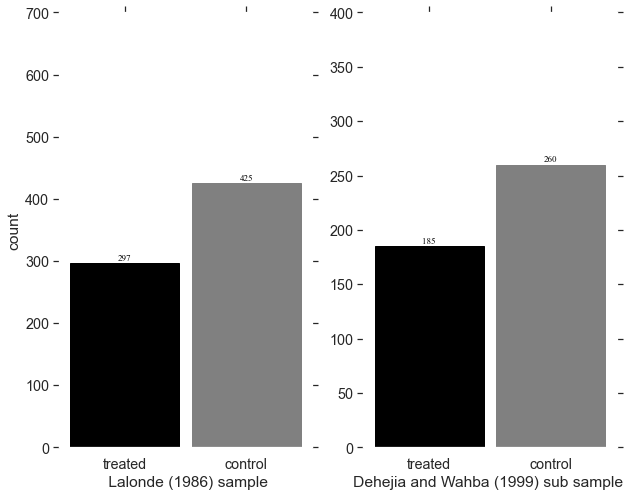

In [9]:
# Plot the balance of classes in the datasets 
from tueplots import axes, bundles , figsizes, fonts,fontsizes

# Lalonde sample 
nswTreated = nsw[nsw['treat']==1]
nswControl = nsw[nsw['treat']==0]
nsw_heights = [len(nswTreated),len(nswControl)]

# Dehejia & Wahba subsample 

nswRe74_Treated = nswre74[nswre74['treat']==1]
nswRe74_Control = nswre74[nswre74['treat']==0]
nswRe74_heights = [len(nswRe74_Treated),len(nswRe74_Control),]

# Update plot paramaters 
fig, ax = plt.subplots(nrows=1, ncols=2)


# Neat formatting for plots 
plt.rcParams.update({"figure.dpi": 150}) 
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(fonts.neurips2022())
plt.rcParams.update(axes.tick_direction( y="in"))
plt.rcParams.update(axes.color(base="black"))
plt.rcParams.update(figsizes.neurips2022(nrows=1, ncols=2))
plt.rcParams.update(fontsizes.neurips2022())

# ==== ==== ==== ==== ==== ==== ==== ==== ==== # 
# Lalonde sample  bar plot 

# Lalonde sample
ax[0].set_facecolor('white')
ax[0].grid(color='white', axis='y')
ax[0].grid(color='white', axis='x')
ax[0].set_ylim(0,700)

ax[0].spines['left']
ax[0].spines['bottom']
ax[0].spines['top']

ax[0].tick_params(right='on')
ax[0].tick_params(left='on')
ax[0].tick_params(top='on')

ax[0].set_xlabel(" Lalonde (1986) sample")
ax[0].set_ylabel("count")

bar = ax[0].bar(['treated','control'],nsw_heights,width = 0.9)
# colour chart 
bar[1].set_color('grey')
bar[0].set_color('black')

# Add counts to bar chart - lalonde sample 
for rect in ax[0].patches:
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    space = 1
    label = "{:.0f}".format(y_value)
    ax[0].annotate(label, (x_value, y_value), xytext=(0, space), textcoords="offset points", ha='center', va='bottom')

# ==== ==== ==== ==== ==== ==== ==== ==== ==== # 
# Dehejia & Wahba subsample  bar plot 

ax[1].set_facecolor('white')
ax[1].grid(color='white', axis='y')
ax[1].grid(color='white', axis='x')
ax[1].set_ylim(0,400)

ax[1].spines['left']
ax[1].spines['bottom']
ax[1].spines['top']

bar2 = ax[1].bar(['treated','control'],nswRe74_heights, width = 0.9)

# colour chart 
bar2[1].set_color('grey')
bar2[0].set_color('black')
ax[1].set_xlabel("Dehejia and Wahba (1999) sub sample ")

# tick mark paramaters 
ax[1].tick_params(right='on')
ax[1].tick_params(left='on')
ax[1].tick_params(top='on')


 # Add counts to bar chart - dehejia wahba sample 
for rect in ax[1].patches:
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    space = 1
    label = "{:.0f}".format(y_value)
    ax[1].annotate(label, (x_value, y_value), xytext=(0, space), textcoords="offset points", ha='center', va='bottom')   

# ==== ==== ==== ==== ==== ==== ==== ==== ==== # 
# Save and display 
plt.savefig('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/Jupyter notebooks/lalonde_notebook_plots/fig1_classImbalance_bar_chart.png', bbox_inches='tight')
plt.show()


<p> outliers </p>

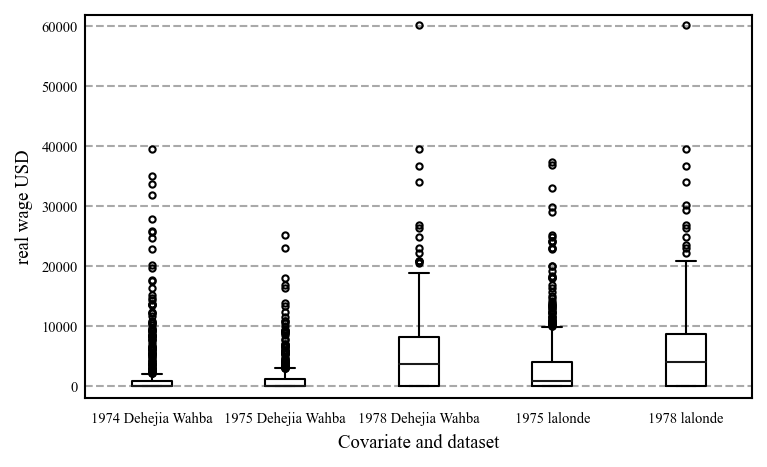

In [10]:
from tueplots import bundles 
fig, ax = plt.subplots(figsize=(5, 3))

# Neat formatting for plots 
plt.rcParams.update({"figure.dpi": 150}) 
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(fonts.neurips2022())
plt.rcParams.update(axes.tick_direction( y="in"))
plt.rcParams.update(axes.color(base="black"))
plt.rcParams.update(figsizes.neurips2022(nrows=1, ncols=4))
plt.rcParams.update(fontsizes.neurips2022())

ax.set_facecolor('white')
# Set boarder colour 
for spine in ax.spines:
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.grid(color='darkgrey', axis='y', linestyle='--', linewidth=1, alpha=1)
ax.grid(color='white', axis='x')

# Cusotmise median line 
medianprops = dict(linestyle='-', linewidth = 1, color='k')
boxprops = dict(linewidth = 1)
whiskerprops = dict(linewidth = 1)
capprops = dict(linewidth = 1)

flierprops = {'marker': 'o', 'markersize': 3,'linewidth':1}

wage74_dej = nswre74['re74']
wage75_dej = nswre74['re75']
wage78_dej = nswre74['re78']

wage75_lalonde = nsw['re75']
wage78_lalonde = nsw['re78']

ax.boxplot([wage74_dej,wage75_dej,wage78_dej,wage75_lalonde,wage78_lalonde],
            medianprops=medianprops,
            boxprops = boxprops,
            whiskerprops=whiskerprops,
            capprops = capprops ,
            flierprops = flierprops,
            widths=0.3) 

ax.set_xlim(0.5,5.5)
ax.set_ylim(-2000,62000)

plt.xticks([1,2,3,4,5],['1974 Dehejia Wahba', '1975 Dehejia Wahba','1978 Dehejia Wahba','1975 lalonde','1978 lalonde'])

ax.set_xlabel('Covariate and dataset')
ax.set_ylabel('real wage USD')


plt.savefig('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/Jupyter notebooks/lalonde_notebook_plots/appendix plots/appendix1_wage_boxplots.png', bbox_inches='tight')
plt.show()

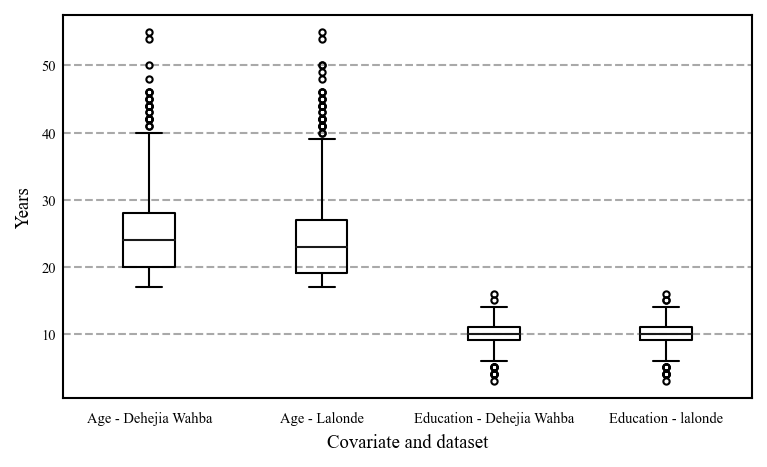

In [11]:
fig, ax = plt.subplots(figsize=(5, 3))
# Neat formatting for plots 
plt.rcParams.update({"figure.dpi": 150}) 
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(fonts.neurips2022())
plt.rcParams.update(axes.tick_direction( y="in"))
plt.rcParams.update(axes.color(base="black"))
plt.rcParams.update(figsizes.neurips2022(nrows=1, ncols=4))
plt.rcParams.update(fontsizes.neurips2022())

ax.set_facecolor('white')
# Set boarder colour 
for spine in ax.spines:
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.grid(color='darkgrey', axis='y', linestyle='--', linewidth=1, alpha=1)
ax.grid(color='white', axis='x')

# Cusotmise median line 
medianprops = dict(linestyle='-', linewidth = 1, color='k')
boxprops = dict(linewidth = 1)
whiskerprops = dict(linewidth = 1)
capprops = dict(linewidth = 1)

flierprops = {'marker': 'o', 'markersize': 3,'linewidth':1}

Age_lalonde = nsw['age']
Educ_lalonde = nsw['education']

Age_dej = nswre74['age']
Educ_dej = nswre74['education']



ax.boxplot([Age_dej,Age_lalonde,Educ_dej,Educ_lalonde],
            medianprops=medianprops,
            boxprops = boxprops,
            whiskerprops=whiskerprops,
            capprops = capprops ,
            flierprops = flierprops,
            widths=0.3) 

#ax.set_xlim(0.5,5.5)
#ax.set_ylim(-2000,62000)

plt.xticks([1,2,3,4],['Age - Dehejia Wahba', 'Age - Lalonde','Education - Dehejia Wahba','Education - lalonde'])


ax.set_xlabel('Covariate and dataset')
ax.set_ylabel('Years')

plt.savefig('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/Jupyter notebooks/lalonde_notebook_plots/appendix plots/appendix2_age_educ_boxplots.png', bbox_inches='tight')

plt.show()



<p> Outliers for CPS and PSID </p>

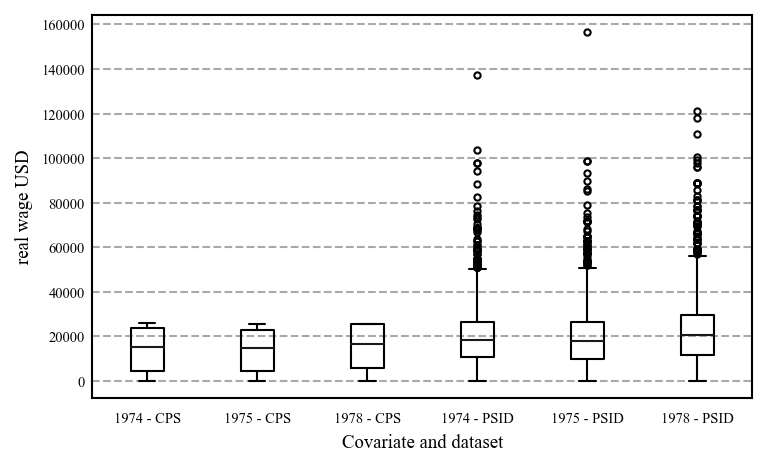

In [12]:
fig, ax = plt.subplots(figsize=(5, 3))

# Neat formatting for plots 
plt.rcParams.update({"figure.dpi": 150}) 
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(fonts.neurips2022())
plt.rcParams.update(axes.tick_direction( y="in"))
plt.rcParams.update(axes.color(base="black"))
plt.rcParams.update(figsizes.neurips2022(nrows=1, ncols=4))
plt.rcParams.update(fontsizes.neurips2022())

ax.set_facecolor('white')
# Set boarder colour 
for spine in ax.spines:
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.grid(color='darkgrey', axis='y', linestyle='--', linewidth=1, alpha=1)
ax.grid(color='white', axis='x')

# Cusotmise median line 
medianprops = dict(linestyle='-', linewidth = 1, color='k')
boxprops = dict(linewidth = 1)
whiskerprops = dict(linewidth = 1)
capprops = dict(linewidth = 1)

flierprops = {'marker': 'o', 'markersize': 3,'linewidth':1}

wage74_cps = cps['re74']
wage75_cps = cps['re75']
wage78_cps = cps['re78']

wage74_psid = psid['re74']
wage75_psid = psid['re75']
wage78_psid = psid['re78']

ax.boxplot([wage74_cps,wage75_cps,wage78_cps,wage74_psid,wage75_psid,wage78_psid],
            medianprops=medianprops,
            boxprops = boxprops,
            whiskerprops=whiskerprops,
            capprops = capprops ,
            flierprops = flierprops,
            widths=0.3) 

#ax.set_xlim(0.5,5.5)
#ax.set_ylim(-2000,62000)

plt.xticks([1,2,3,4,5,6],['1974 - CPS', '1975 - CPS','1978 - CPS','1974 - PSID','1975 - PSID','1978 - PSID'])

ax.set_xlabel('Covariate and dataset')
ax.set_ylabel('real wage USD')


plt.savefig('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/Jupyter notebooks/lalonde_notebook_plots/appendix plots/appendix3_wage_boxplots_cps_psid.png', bbox_inches='tight')
plt.show()

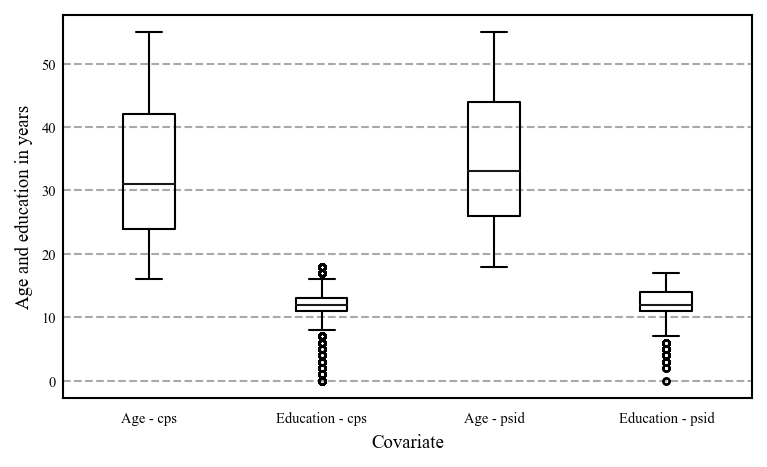

In [13]:
# Age and education 

fig, ax = plt.subplots(figsize=(5, 3))

# Neat formatting for plots 
plt.rcParams.update({"figure.dpi": 150}) 
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(fonts.neurips2022())
plt.rcParams.update(axes.tick_direction( y="in"))
plt.rcParams.update(axes.color(base="black"))
plt.rcParams.update(figsizes.neurips2022(nrows=1, ncols=4))
plt.rcParams.update(fontsizes.neurips2022())

ax.set_facecolor('white')
# Set boarder colour 
for spine in ax.spines:
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.grid(color='darkgrey', axis='y', linestyle='--', linewidth=1, alpha=1)
ax.grid(color='white', axis='x')

# Cusotmise median line 
medianprops = dict(linestyle='-', linewidth = 1, color='k')
boxprops = dict(linewidth = 1)
whiskerprops = dict(linewidth = 1)
capprops = dict(linewidth = 1)

flierprops = {'marker': 'o', 'markersize': 3,'linewidth':1}


Age_cps = cps['age']
Educ_cps = cps['education']

Age_psid = psid['age']
Educ_psid = psid['education']

ax.boxplot([Age_cps,Educ_cps,Age_psid,Educ_psid],
            medianprops=medianprops,
            boxprops = boxprops,
            whiskerprops=whiskerprops,
            capprops = capprops ,
            flierprops = flierprops,
            widths=0.3) 

#ax.set_xlim(0.5,5.5)
#ax.set_ylim(-2000,62000)

plt.xticks([1,2,3,4],['Age - cps', 'Education - cps','Age - psid','Education - psid'])

ax.set_xlabel('Covariate')

ax.set_ylabel('Age and education in years')

plt.savefig('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/Jupyter notebooks/lalonde_notebook_plots/appendix plots/appendix4_age_educ_cpspsid_boxplots.png', bbox_inches='tight')

plt.show()

### Remove outliers, transform variables and store dataset

In [14]:
# Drop outliers 
cols = ['re75','re78','age','education'] 
cols2 = ['re74','re75','re78','age','education'] 

lower_bound = 0.5
upper_bound = 0.95

Q1_1 = nsw[cols].quantile(lower_bound)
Q3_1 = nsw[cols].quantile(upper_bound)
IQR_1 = Q3_1 - Q1_1

Q1_2 = nswre74[cols2].quantile(lower_bound)
Q3_2 = nswre74[cols2].quantile(upper_bound)
IQR_2 = Q3_2 - Q1_2

Q1_3 = cps[cols2].quantile(lower_bound)
Q3_3 = cps[cols2].quantile(upper_bound)
IQR_3 = Q3_3 - Q1_3

Q1_4 = psid[cols2].quantile(lower_bound)
Q3_4 = psid[cols2].quantile(upper_bound)
IQR_4 = Q3_4 - Q1_4

nsw = nsw[~((nsw[cols] < (Q1_1 -  IQR_1)) |(nsw[cols] > (Q3_1 +  IQR_1))).any(axis=1)]

nswre74 = nswre74[~((nswre74[cols2] < (Q1_2 -  IQR_2)) |(nswre74[cols2] > (Q3_2 +  IQR_2))).any(axis=1)]

cps = cps[~((cps[cols] < (Q1_3 - IQR_3)) |(cps[cols2] > (Q3_3 +  IQR_3))).any(axis=1)]
psid = psid[~((psid[cols2] < (Q1_4 - IQR_4)) |(psid[cols2] > (Q3_4 + IQR_4))).any(axis=1)]

/var/folders/sp/c9zy568j6s94zqs20ynd8pz00000gn/T/ipykernel_86273/4241450747.py:28: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  cps = cps[~((cps[cols] < (Q1_3 - IQR_3)) |(cps[cols2] > (Q3_3 +  IQR_3))).any(axis=1)]


### Key points 
<p> 1. Taking logs of wage reveals that the distribution is bimodal </p>
<p> ---- There are a group of low wage earners (o mode) and higher wave earns (around 8 mode) </p>
<p> ---- Treatment decreases amount of low wage earns, increases amount of high wave earners</p>

In [15]:
# Define function for feature transformation 
def feature_tranform(dataset):
    # account for integer overflow - convert features will tranform to 64bit type integer

    dataset['re75'] = dataset['re75'].astype(int)
    dataset['re78'] = dataset['re78'].astype(int)
    dataset['age'] = dataset['age'].astype(int)
    dataset['education'] = dataset['education'].astype(int) 

    warnings.filterwarnings('ignore')

    if 're74' in dataset.columns: 
        dataset['re74'] = dataset['re74'].astype(int)  
        warnings.filterwarnings('ignore')
    else:
        pass

    # Keep a copy of education as numerical 
    dataset['education*'] = dataset['education']

    # Generate dummy variables 
    dataset['u75'] = (dataset['re75'] == 0).astype(int)
    # Generate interaction terms 
    dataset['educ_re75'] = dataset['education']*dataset['re75']
    dataset['hisp_u75'] = dataset['hispanic']*dataset['u75']
    dataset['black_u75'] = dataset['black']*dataset['u75']
    
    if 're74' in dataset.columns: 
        dataset['u74'] = (dataset['re74'] == 0).astype(int)
        dataset['educ_re74'] = dataset['education']*dataset['re74']
        dataset['hisp_u74'] = dataset['hispanic']*dataset['u74']
        dataset['black_u74'] = dataset['black']*dataset['u74']
    else:
        pass    

    # Change zeroes to in wage as logs struggle
    dataset['re78'][dataset['re78'] == 0] = 1
    dataset['re75'][dataset['re75'] == 0] = 1

    if 're74' in dataset.columns:
        dataset['re74'][dataset['re74'] == 0] = 1
    else:
        pass     
        
    # squared variables
    dataset['agesq'] = dataset['age']*dataset['age']
    dataset['re78sq'] = dataset['re78']*dataset['re78']
    dataset['re75sq'] = dataset['re75']*dataset['re75']
    dataset['educsq'] = dataset['education']*dataset['education']

    if 're74' in dataset.columns:
        dataset['re74sq'] = dataset['re74']*dataset['re74']
    else:
        pass      

    # boxcox transforms of varibles
    dataset['ageboxcox'],parameters=stat.boxcox(dataset['age']) 
    dataset['re78boxcox'],parameters=stat.boxcox(dataset['re78'])
    dataset['re75boxcox'],parameters=stat.boxcox(dataset['re75'])

    if 're74' in dataset.columns:
        dataset['re74boxcox'],parameters=stat.boxcox(dataset['re74'])
    else:
        pass     
    # natural log of wage
    dataset['lnre78'] = np.log(dataset['re78'])
    dataset['lnre75'] = np.log(dataset['re75'])

    if 're74' in dataset.columns:
        dataset['lnre74'] = np.log(dataset['re74'])
    else:
        pass 

        # Change zeroes to in wage as logs struggle
    dataset['re78'][dataset['re78'] == 1] = 0
    dataset['re75'][dataset['re75'] == 1] = 0

    if 're74' in dataset.columns:
        dataset['re74'][dataset['re74'] == 1] = 0
    else:
        pass    

    # encode education as binary indicator variable 
    dataset = pd.get_dummies(dataset, columns=["education"],drop_first=True)
    
    return dataset  

In [16]:
# Combine lalonde treated units with cps and psid groups
cps_no_re74 = cps.drop(['re74'],axis=1)   # drop wage in 1974 from cps comparison
psid_no_re74 = psid.drop(['re74'],axis=1) # drop wage in 1974 from psid comparison

# Create quasi-experimental datasets 
Quasi_NswCps_lalonde_ = pd.concat([nsw[nsw['treat']==1],cps_no_re74],ignore_index=True)
Quasi_NswPsid_lalonde_ = pd.concat([nsw[nsw['treat']==1],psid_no_re74],ignore_index=True)
Quasi_NswCps_dehWab_ = pd.concat([nswre74[nswre74['treat']==1],cps],ignore_index=True)
Quasi_NswPsid_dehWab_ = pd.concat([nswre74[nswre74['treat']==1],psid], ignore_index=True)

# Pass data sets through feature transformation function 
Quasi_NswCps_lalonde = feature_tranform(Quasi_NswCps_lalonde_)
Quasi_NswPsid_lalonde = feature_tranform(Quasi_NswPsid_lalonde_)
Quasi_NswCps_dehWab = feature_tranform(Quasi_NswCps_dehWab_)
Quasi_NswPsid_dehWab = feature_tranform(Quasi_NswPsid_dehWab_)

In [17]:
Quasi_NswCps_lalonde

,treat,age,black,hispanic,married,nodegree,re75,re78,education*,u75,...,education_9,education_10,education_11,education_12,education_13,education_14,education_15,education_16,education_17,education_18
0,1.0,37,1.0,0.0,1.0,1.0,0,9930,11,1,...,0,0,1,0,0,0,0,0,0,0
1,1.0,22,0.0,1.0,0.0,1.0,0,3595,9,1,...,1,0,0,0,0,0,0,0,0,0
2,1.0,30,1.0,0.0,0.0,0.0,0,24909,12,1,...,0,0,0,1,0,0,0,0,0,0
3,1.0,27,1.0,0.0,0.0,1.0,0,7506,11,1,...,0,0,1,0,0,0,0,0,0,0
4,1.0,33,1.0,0.0,0.0,1.0,0,289,8,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10148,0.0,27,0.0,0.0,1.0,0.0,25243,25564,13,0,...,0,0,0,0,1,0,0,0,0,0
10149,0.0,55,0.0,0.0,1.0,1.0,25243,21463,9,0,...,1,0,0,0,0,0,0,0,0,0
10150,0.0,48,0.0,0.0,1.0,1.0,25243,25564,10,0,...,0,1,0,0,0,0,0,0,0,0
10151,0.0,47,0.0,0.0,1.0,1.0,11384,13671,9,0,...,1,0,0,0,0,0,0,0,0,0


In [18]:
Quasi_NswPsid_lalonde

,treat,age,black,hispanic,married,nodegree,re75,re78,education*,u75,...,education_8,education_9,education_10,education_11,education_12,education_13,education_14,education_15,education_16,education_17
0,1.0,37,1.0,0.0,1.0,1.0,0,9930,11,1,...,0,0,0,1,0,0,0,0,0,0
1,1.0,22,0.0,1.0,0.0,1.0,0,3595,9,1,...,0,1,0,0,0,0,0,0,0,0
2,1.0,30,1.0,0.0,0.0,0.0,0,24909,12,1,...,0,0,0,0,1,0,0,0,0,0
3,1.0,27,1.0,0.0,0.0,1.0,0,7506,11,1,...,0,0,0,1,0,0,0,0,0,0
4,1.0,33,1.0,0.0,0.0,1.0,0,289,8,1,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2591,0.0,32,0.0,0.0,1.0,1.0,39387,36943,10,0,...,0,0,1,0,0,0,0,0,0,0
2592,0.0,47,0.0,0.0,1.0,1.0,33837,38568,8,0,...,1,0,0,0,0,0,0,0,0,0
2593,0.0,32,0.0,0.0,1.0,1.0,67137,59109,8,0,...,1,0,0,0,0,0,0,0,0,0
2594,0.0,47,0.0,0.0,1.0,1.0,47968,55710,10,0,...,0,0,1,0,0,0,0,0,0,0


In [19]:
Quasi_NswCps_dehWab

,treat,age,black,hispanic,married,nodegree,re74,re75,re78,education*,...,education_9,education_10,education_11,education_12,education_13,education_14,education_15,education_16,education_17,education_18
0,1.0,37,1.0,0.0,1.0,1.0,0,0,9930,11,...,0,0,1,0,0,0,0,0,0,0
1,1.0,22,0.0,1.0,0.0,1.0,0,0,3595,9,...,1,0,0,0,0,0,0,0,0,0
2,1.0,30,1.0,0.0,0.0,0.0,0,0,24909,12,...,0,0,0,1,0,0,0,0,0,0
3,1.0,27,1.0,0.0,0.0,1.0,0,0,7506,11,...,0,0,1,0,0,0,0,0,0,0
4,1.0,33,1.0,0.0,0.0,1.0,0,0,289,8,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10038,0.0,27,0.0,0.0,1.0,0.0,25507,25243,25564,13,...,0,0,0,0,1,0,0,0,0,0
10039,0.0,55,0.0,0.0,1.0,1.0,25862,25243,21463,9,...,1,0,0,0,0,0,0,0,0,0
10040,0.0,48,0.0,0.0,1.0,1.0,25862,25243,25564,10,...,0,1,0,0,0,0,0,0,0,0
10041,0.0,47,0.0,0.0,1.0,1.0,16914,11384,13671,9,...,1,0,0,0,0,0,0,0,0,0


In [20]:
Quasi_NswPsid_dehWab

,treat,age,black,hispanic,married,nodegree,re74,re75,re78,education*,...,education_8,education_9,education_10,education_11,education_12,education_13,education_14,education_15,education_16,education_17
0,1.0,37,1.0,0.0,1.0,1.0,0,0,9930,11,...,0,0,0,1,0,0,0,0,0,0
1,1.0,22,0.0,1.0,0.0,1.0,0,0,3595,9,...,0,1,0,0,0,0,0,0,0,0
2,1.0,30,1.0,0.0,0.0,0.0,0,0,24909,12,...,0,0,0,0,1,0,0,0,0,0
3,1.0,27,1.0,0.0,0.0,1.0,0,0,7506,11,...,0,0,0,1,0,0,0,0,0,0
4,1.0,33,1.0,0.0,0.0,1.0,0,0,289,8,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2481,0.0,32,0.0,0.0,1.0,1.0,43103,39387,36943,10,...,0,0,1,0,0,0,0,0,0,0
2482,0.0,47,0.0,0.0,1.0,1.0,44667,33837,38568,8,...,1,0,0,0,0,0,0,0,0,0
2483,0.0,32,0.0,0.0,1.0,1.0,47022,67137,59109,8,...,1,0,0,0,0,0,0,0,0,0
2484,0.0,47,0.0,0.0,1.0,1.0,48197,47968,55710,10,...,0,0,1,0,0,0,0,0,0,0


### Save datasets

In [21]:
Quasi_NswCps_lalonde.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_lalonde.csv',header = True,index = False)
Quasi_NswPsid_lalonde.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_lalonde.csv',header = True,index = False)
Quasi_NswCps_dehWab.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_dehWab.csv',header = True,index = False)
Quasi_NswPsid_dehWab.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_dehWab.csv',header = True,index = False)

# Class imbalance plots for QuasiExperimental datasets 

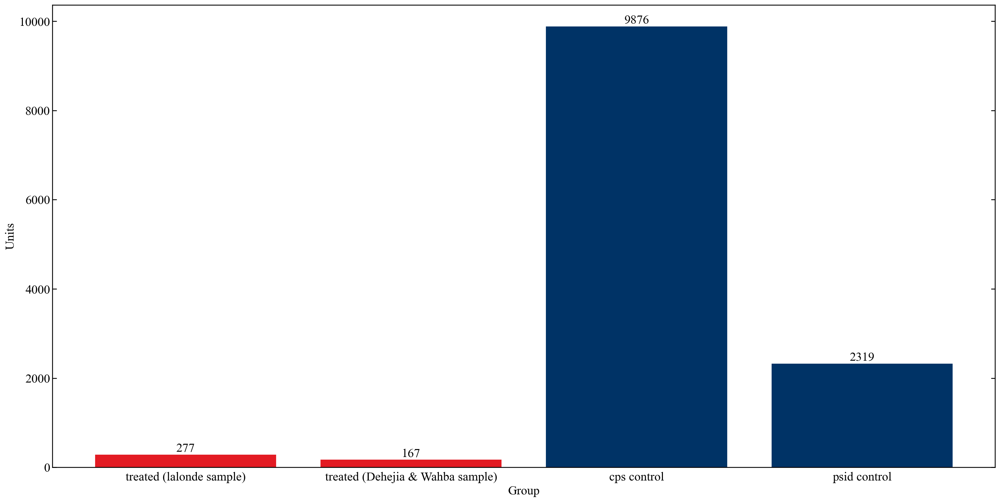

In [22]:
# Plot the balance of classes in the datasets 

# Lalonde sample 
lalondeTreated = Quasi_NswCps_lalonde[Quasi_NswCps_lalonde['treat']==1] # Treated lalonde 
dehWabTreated = Quasi_NswCps_dehWab[Quasi_NswCps_dehWab['treat']==1] # Treated dehWab


cpsControl = Quasi_NswCps_lalonde[Quasi_NswCps_lalonde['treat']==0] # Cps control
psidControl = Quasi_NswPsid_lalonde[Quasi_NswPsid_lalonde['treat']==0] # Psid control

nsw_heights = [len(lalondeTreated),len(dehWabTreated),len(cpsControl),len(psidControl)]

# Update plot paramaters 
fig, ax = plt.subplots(nrows=1, ncols=1,figsize = (20,10))


# Neat formatting for plots 
plt.rcParams.update({"figure.dpi": 300}) 
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(fonts.neurips2022())
plt.rcParams.update(axes.tick_direction( y="in"))
plt.rcParams.update(axes.color(base="black"))
plt.rcParams.update(figsizes.neurips2022(nrows=1, ncols=1))
#plt.rcParams.update(fontsizes.neurips2022())
plt.rcParams.update({'font.size': 18})
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.xlabel('xlabel', fontsize=18)
plt.ylabel('ylabel', fontsize=18)
# ==== ==== ==== ==== ==== ==== ==== ==== ==== # 
# Lalonde sample  bar plot 

# Lalonde sample
ax.set_facecolor('white')
ax.grid(color='white', axis='y')
ax.grid(color='white', axis='x')
#ax[0].set_ylim(0,700)

ax.spines['left']
ax.spines['bottom']
ax.spines['top']

ax.tick_params(right='on')
ax.tick_params(left='on')
#ax.tick_params(top='on')

ax.set_xlabel("Group")
ax.set_ylabel("Units")

bar = ax.bar(['treated (lalonde sample)','treated (Dehejia & Wahba sample)','cps control','psid control'],nsw_heights,width = 0.8)
# colour chart 
bar[0].set_color('#E31B23')
bar[1].set_color('#E31B23')
bar[2].set_color('#003366')
bar[3].set_color('#003366')

# Add counts to bar chart - lalonde sample 
for rect in ax.patches:
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    space = 1
    label = "{:.0f}".format(y_value)
    ax.annotate(label, (x_value, y_value), xytext=(0, space), textcoords="offset points", ha='center', va='bottom')

# Save and display 
plt.savefig('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/Jupyter notebooks/lalonde_notebook_plots/fig1_Quasi_data_classImbalance_bar_chart.png', bbox_inches='tight')
plt.show()

### Smote illustration

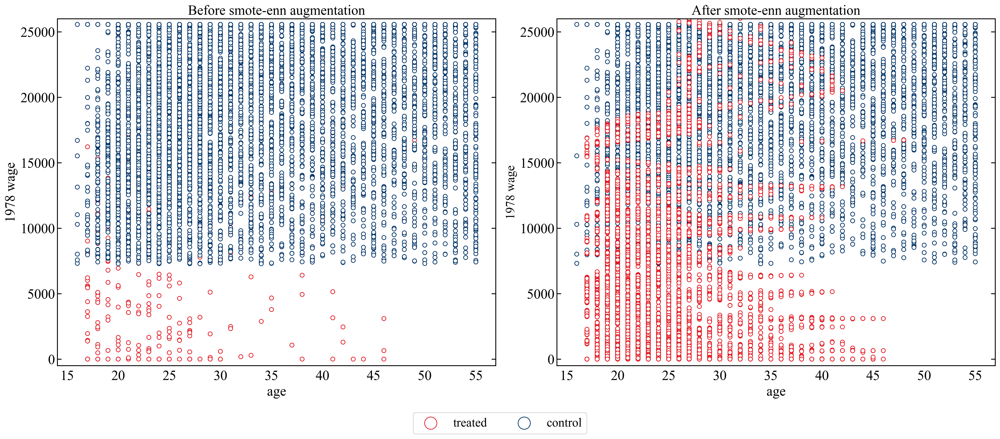

In [23]:
from matplotlib.lines import Line2D
from imblearn.combine import SMOTEENN
resample_demo =SMOTEENN(random_state=0)

#resample data
features, target = resample_demo.fit_resample(Quasi_NswCps_lalonde.drop('treat', axis=1), Quasi_NswCps_lalonde['treat'])	
Quasi_NswCps_lalonde_smote = pd.concat([features,target],axis=1)

color= ['#E31B23' if l == 1 else '#003366' for l in Quasi_NswCps_lalonde['treat']]
color2= ['#E31B23' if l == 1 else '#003366' for l in Quasi_NswCps_lalonde_smote['treat']]


# Update plot paramaters 
fig, ax = plt.subplots(nrows=1, ncols=2,figsize = (20,8))

# Neat formatting for plots 
plt.rcParams.update({"figure.dpi": 300}) 
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(fonts.neurips2022())
plt.rcParams.update(axes.tick_direction( y="in"))
plt.rcParams.update(axes.color(base="black"))
plt.rcParams.update(figsizes.neurips2022(nrows=1, ncols=1))
#plt.rcParams.update(fontsizes.neurips2022())
plt.rcParams.update({'font.size': 18})

ax[0].set_facecolor('white')
ax[0].grid(color='white', axis='y')
ax[0].grid(color='white', axis='x')
ax[0].spines['left']
ax[0].spines['bottom']
ax[0].spines['top']
ax[0].tick_params(right='on')
ax[0].tick_params(left='on')
ax[0].set_ylim(-500,26000)


ax[0].scatter(Quasi_NswCps_lalonde['age'], Quasi_NswCps_lalonde['re78'],color=color,facecolors='white',s=35)

#ax[0].set_yticks(fontsize=18)
#ax[0].set_xticks(fontsize=18)
ax[0].tick_params(axis="x", labelsize=20)
ax[0].tick_params(axis="y", labelsize=20)

ax[0].set_xlabel('age', fontsize=20)
ax[0].set_ylabel('1978 wage', fontsize=20)
ax[0].set_title("Before smote-enn augmentation",fontsize=20)



ax[1].set_facecolor('white')
ax[1].grid(color='white', axis='y')
ax[1].grid(color='white', axis='x')
ax[1].spines['left']
ax[1].spines['bottom']
ax[1].spines['top']
ax[1].set_ylim(-500,26000)

ax[1].tick_params(right='on')
ax[1].tick_params(left='on')
ax[1].scatter(Quasi_NswCps_lalonde_smote['age'], Quasi_NswCps_lalonde_smote['re78'],color=color2, facecolors='white',s=35)
ax[1].tick_params(axis="x", labelsize=20)
ax[1].tick_params(axis="y", labelsize=20)
ax[1].set_xlabel('age', fontsize=20)
ax[1].set_ylabel('1978 wage', fontsize=18)
ax[1].set_title("After smote-enn augmentation",fontsize=20)

labels = ['treated','control']
fig.legend(labels, loc='lower center', bbox_to_anchor=(0.5,-0.1), ncol=len(labels),markerscale=3, bbox_transform=fig.transFigure,prop={'size': 18})
plt.savefig('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/Jupyter notebooks/lalonde_notebook_plots/fig2_SMOTE-ENN_transform_chart.png', bbox_inches='tight')

plt.show()


# 2. Experimental benchmark

In [24]:
import statsmodels.api as statsmod
import statsmodels.formula.api  as smf
# covariate balance test

# OLS treatment effect estimate
# reg1: re78 = const + b_1*treatment
ateols1 = smf.ols('re78 ~ treat', data=nsw).fit()
ateols2 = smf.ols('re78 ~ treat + age + education + black + hispanic + nodegree + re75', data=nsw).fit()

# reg2: re78 = const + b_1*treatment

ateols3 = smf.ols('re78 ~ treat', data=nswre74).fit()
ateols4 = smf.ols('re78 ~ treat + age + education + black + hispanic + nodegree + re75 + re74', data=nswre74).fit()

print('______________ Lalonde __________________')
print(ateols1.summary2())
print(ateols2.summary2())
print('______________ DW __________________')
print(ateols3.summary2())
print(ateols4.summary2())


______________ Lalonde __________________
                  Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.004     
Dependent Variable: re78             AIC:                13441.7148
Date:               2022-08-18 08:56 BIC:                13450.7323
No. Observations:   671              Log-Likelihood:     -6718.9   
Df Model:           1                F-statistic:        3.951     
Df Residuals:       669              Prob (F-statistic): 0.0473    
R-squared:          0.006            Scale:              2.9253e+07
-------------------------------------------------------------------
                Coef.   Std.Err.    t    P>|t|    [0.025    0.975] 
-------------------------------------------------------------------
Intercept     4805.0759 272.4837 17.6344 0.0000 4270.0497 5340.1021
treat          842.9293 424.0938  1.9876 0.0473   10.2142 1675.6443
-------------------------------------------------------------------
Omnibus:               9

# 3. Propensity score estimation

In [25]:
import torch
from torch import nn
from torch.utils.data import  DataLoader,SubsetRandomSampler 
import torch.optim as optim # Optimization package
from sklearn.model_selection import KFold
from sklearn.utils import shuffle

In [26]:
# Import libraries for LR
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle 

In [27]:
# Load quasi-experimental dataset

nswCps_lalonde =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_lalonde.csv')
nswPsid_lalonde = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_lalonde.csv')
nswCps_dehWab =   pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_dehWab.csv')
nswPsid_dehWab =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_dehWab.csv')

nswCps_lalonde.columns = nswCps_lalonde.columns.str.strip() 
nswPsid_lalonde.columns = nswPsid_lalonde.columns.str.strip() 
nswCps_dehWab.columns = nswCps_dehWab.columns.str.strip() 
nswPsid_dehWab.columns = nswPsid_dehWab.columns.str.strip() 

# Store outcome variable prior to modelling
nswCps_lalonde_re78 = nswCps_lalonde.re78
nswPsid_lalonde_re78 = nswPsid_lalonde.re78
nswCps_dehWab_re78 = nswCps_dehWab.re78
nswPsid_dehWab_re78 = nswPsid_dehWab.re78

### model (1) Logistic Regression 

### Data

In [28]:
# Select covariates for use in Logit model 

# ======== Lalonde (1986) data ======== #

LALONDE_subset1 = ['treat','age','agesq','education*','educsq','black','hispanic','married','nodegree','re75','u75']


#nsw_lalonde = nswCps_lalonde[LALONDE_subset1]
nswCps_lalonde_subset = nswCps_lalonde[LALONDE_subset1]
nswPsid_lalonde_subset = nswPsid_lalonde[LALONDE_subset1]

nswCps_lalonde_target = nswCps_lalonde_subset['treat']
nswCps_lalonde_features = nswCps_lalonde_subset.drop('treat', axis=1)
nswPsid_lalonde_target = nswPsid_lalonde_subset['treat']
nswPsid_lalonde_features = nswPsid_lalonde_subset.drop('treat', axis=1)

# ======== Dehejia & Wahba (1986) sub sample ======== #

DW_subset2 = ['treat','age','agesq','education*','educsq','black','hispanic','married','nodegree','re74','re75','u75','u74','educ_re74']

#nsw_dehwab = nswre74_transformed_features[DW_subset2]
nswCps_dehWab_subset = nswCps_dehWab[DW_subset2]
nswPsid_dehWab_subset = nswPsid_dehWab[DW_subset2]

nswCps_dehWab_target = nswCps_dehWab_subset['treat']
nswCps_dehWab_features = nswCps_dehWab_subset.drop('treat', axis=1)
nswPsid_dehWab_target = nswPsid_dehWab_subset['treat']
nswPsid_dehWab_features = nswPsid_dehWab_subset.drop('treat', axis=1)

In [29]:
def return_trainTest_split(Dataset):
	# shuffle data
	Dataset = Dataset.sample(frac = 1,random_state=0)
	Features = Dataset.drop('treat', axis=1)
	Target = Dataset['treat']
	X_train, X_test, y_train, y_test = train_test_split(Features, Target, test_size=0.3, shuffle=True)
	print("TRAIN:", X_train.index, "TEST:", X_test.index)
	return X_train, X_test, y_train, y_test;


### Validation

In [112]:
"""
We use KFold cross validation to establish performance metrics for each of our models.
Note these hyper-parameter settig may be biased 

"""
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score
from sklearn import metrics


# KFold cross validation 
def kfold_evaluation(input_model,features,target,store):
	# prepare the cross-validation procedure
	skf = StratifiedKFold(n_splits=5, shuffle=True,random_state=1)
	
	#Function to get model scores	
	def get_score(model,X_train , X_test, y_train , y_test,fold,store):
		model.fit(X_train,y_train)
		prediction = model.predict(X_test)
		store.loc['Accuracy:', fold] = metrics.balanced_accuracy_score(y_test, prediction)
		store.loc['Precision:', fold] = metrics.precision_score(y_test, prediction)
		store.loc['Recall:', fold] = metrics.recall_score(y_test, prediction)
		store.loc['MSE:', fold] =  metrics.mean_squared_error(y_test, prediction)
		store.loc['MAE:', fold] =  metrics.mean_absolute_error(y_test, prediction)
		store.loc['R^2:', fold] =  metrics.r2_score(y_test, prediction)
		store.loc['auc:', fold] =  metrics.roc_auc_score(y_test, prediction)
		store.loc['roc_auc:', fold] =  metrics.roc_auc_score(y_test, prediction)
		store.loc['F1:', fold] =  metrics.f1_score(y_test, prediction)
		store.loc['Kappa:', fold] = metrics.cohen_kappa_score(y_test, prediction)
		

	#Kfold training loop
	for fold, (train_index , test_index) in enumerate(skf.split(features,target)):
		#print("TRAIN:", train_index, "TEST:", test_index)
		X_train , X_test, y_train , y_test = features.iloc[train_index,:],features.iloc[test_index,:],\
			                                 target[train_index] , target[test_index]
		get_score(input_model,X_train , X_test, y_train , y_test,fold,store)
		# return statement here with python dataframe of metrics 


In [113]:
from sklearn.linear_model import LogisticRegression
# dataframes to store resutls 
logit1_metrics = pd.DataFrame()
logit2_metrics = pd.DataFrame()
logit3_metrics = pd.DataFrame()
logit4_metrics = pd.DataFrame()
#models 
logit1 = LogisticRegression(penalty='none',solver='lbfgs', class_weight="balanced",max_iter=500,random_state=0)
logit2 = LogisticRegression(penalty='none',solver='lbfgs', class_weight="balanced",max_iter=500,random_state=0)
logit3 = LogisticRegression(penalty='none',solver='lbfgs', class_weight="balanced",max_iter=500,random_state=0)
logit4 = LogisticRegression(penalty='none',solver='lbfgs', class_weight="balanced",max_iter=500,random_state=0)


In [114]:
# Kfold training
# ======== Lalonde (1986) sample ======== #
kfold_evaluation(logit1,nswCps_lalonde_features,nswCps_lalonde_target,logit1_metrics) # cps
kfold_evaluation(logit2,nswPsid_lalonde_features,nswPsid_lalonde_target,logit2_metrics) # psid
# ======== Dehejia & Wahba (1999) sub sample ======== #
kfold_evaluation(logit3,nswCps_dehWab_features,nswCps_dehWab_target,logit3_metrics) # cps
kfold_evaluation(logit4,nswPsid_dehWab_features,nswPsid_dehWab_target,logit4_metrics) # psid

In [115]:
logit1_metrics.loc['RMSE']=np.sqrt(logit1_metrics.loc["MSE:"])
logit2_metrics.loc['RMSE']=np.sqrt(logit2_metrics.loc["MSE:"])
logit3_metrics.loc['RMSE']=np.sqrt(logit3_metrics.loc["MSE:"])
logit4_metrics.loc['RMSE']=np.sqrt(logit4_metrics.loc["MSE:"])

logit1_metrics['avg'] = np.mean(logit1_metrics,axis=1)
logit2_metrics['avg'] = np.mean(logit2_metrics,axis=1)
logit3_metrics['avg'] = np.mean(logit3_metrics,axis=1)
logit4_metrics['avg'] = np.mean(logit4_metrics,axis=1)

In [116]:
logit1_metrics

,0,1,2,3,4,avg
Accuracy:,0.948910,0.918006,0.953713,0.938320,0.939333,0.939656
Precision:,0.355705,0.388889,0.268657,0.337748,0.346939,0.339587
Recall:,0.946429,0.875000,0.981818,0.927273,0.927273,0.931558
MSE:,0.048744,0.041359,0.072871,0.051232,0.049261,0.052693
MAE:,0.048744,0.041359,0.072871,0.051232,0.049261,0.052693
R^2:,-0.817984,-0.542532,-1.765808,-0.943567,-0.868815,-0.987741
auc:,0.948910,0.918006,0.953713,0.938320,0.939333,0.939656
roc_auc:,0.948910,0.918006,0.953713,0.938320,0.939333,0.939656
F1:,0.517073,0.538462,0.421875,0.495146,0.504950,0.495501
Kappa:,0.496909,0.520142,0.396199,0.474264,0.484628,0.474428


In [117]:
logit2_metrics

,0,1,2,3,4,avg
Accuracy:,0.897937,0.899703,0.905917,0.912520,0.915145,0.906244
Precision:,0.526316,0.583333,0.456140,0.561798,0.531250,0.531767
Recall:,0.892857,0.875000,0.945455,0.909091,0.927273,0.909935
MSE:,0.098077,0.080925,0.125241,0.084778,0.094412,0.096687
MAE:,0.098077,0.080925,0.125241,0.084778,0.094412,0.096687
R^2:,-0.020628,0.159287,-0.321904,0.105172,0.003487,-0.014917
auc:,0.897937,0.899703,0.905917,0.912520,0.915145,0.906244
roc_auc:,0.897937,0.899703,0.905917,0.912520,0.915145,0.906244
F1:,0.662252,0.700000,0.615385,0.694444,0.675497,0.669515
Kappa:,0.609311,0.655378,0.551223,0.648385,0.624961,0.617852


In [118]:
logit3_metrics

,0,1,2,3,4,avg
Accuracy:,0.985823,0.973649,0.960335,0.988608,0.944672,0.970617
Precision:,0.377778,0.417722,0.455882,0.423077,0.434783,0.421848
Recall:,1.000000,0.970588,0.939394,1.000000,0.909091,0.963815
MSE:,0.027875,0.023395,0.019413,0.022410,0.020916,0.022802
MAE:,0.027875,0.023395,0.019413,0.022410,0.020916,0.022802
R^2:,-0.675413,-0.406150,-0.201555,-0.386421,-0.293993,-0.392707
auc:,0.985823,0.973649,0.960335,0.988608,0.944672,0.970617
roc_auc:,0.985823,0.973649,0.960335,0.988608,0.944672,0.970617
F1:,0.548387,0.584071,0.613861,0.594595,0.588235,0.585830
Kappa:,0.537013,0.573990,0.605127,0.585010,0.578872,0.576002


In [119]:
logit4_metrics

,0,1,2,3,4,avg
Accuracy:,0.963362,0.948577,0.913597,0.955754,0.911442,0.938546
Precision:,0.500000,0.492537,0.441176,0.542373,0.428571,0.480932
Recall:,1.000000,0.970588,0.909091,0.969697,0.909091,0.951693
MSE:,0.068273,0.070423,0.082495,0.056338,0.086519,0.072810
MAE:,0.068273,0.070423,0.082495,0.056338,0.086519,0.072810
R^2:,-0.073276,-0.105006,-0.330786,0.091170,-0.395703,-0.162720
auc:,0.963362,0.948577,0.913597,0.955754,0.911442,0.938546
roc_auc:,0.963362,0.948577,0.913597,0.955754,0.911442,0.938546
F1:,0.666667,0.653465,0.594059,0.695652,0.582524,0.638474
Kappa:,0.633284,0.618873,0.554202,0.667320,0.541109,0.602958


### Inference

In [120]:
# Fit Logistic Regression using sklearn

# ======== Lalonde (1986) sample ======== #

logit1.fit(nswCps_lalonde_features,nswCps_lalonde_target) # cps
logit2.fit(nswPsid_lalonde_features,nswPsid_lalonde_target) # psid

# ======== Dehejia & Wahba (1999) sub sample ======== #

logit3.fit(nswCps_dehWab_features,nswCps_dehWab_target) # cps
logit4.fit(nswPsid_dehWab_features,nswPsid_dehWab_target) # psid



LogisticRegression(class_weight='balanced', max_iter=500, penalty='none',
                   random_state=0)

In [121]:
# Predict ps with model 
# ======== Lalonde (1986) sample ======== #
#pred1 = logit1.predict(nswCps_lalonde_features) # cps
#pred2 = logit2.predict(nswCps_lalonde_features) # psid
# ======== Dehejia & Wahba (1999) sub sample ======== #
#pred3 = logit3.predict(nswCps_dehWab_features) # cps
#pred4 = logit4.predict(nswCps_dehWab_features) # psid

In [122]:
# Predict ps with model 
# ======== Lalonde (1986) sample ======== #
pred1 = logit1.predict_proba(nswCps_lalonde_features) # cps
pred2 = logit2.predict_proba(nswCps_lalonde_features) # psid
# ======== Dehejia & Wahba (1999) sub sample ======== #
pred3 = logit3.predict_proba(nswCps_dehWab_features) # cps
pred4 = logit4.predict_proba(nswCps_dehWab_features) # psid

In [123]:
# Estimate logit coefficients  
# ======== Lalonde (1986) sample CPS comparions ========= #
logit_model1 = sm.Logit(nswCps_lalonde_target,nswCps_lalonde_features)
result1=logit_model1.fit()
print(result1.summary())

Optimization terminated successfully.
         Current function value: 0.028929
         Iterations 11
                           Logit Regression Results                           
Dep. Variable:                  treat   No. Observations:                10153
Model:                          Logit   Df Residuals:                    10146
Method:                           MLE   Df Model:                            6
Date:                Thu, 18 Aug 2022   Pseudo R-squ.:                  0.7689
Time:                        13:11:32   Log-Likelihood:                -293.72
converged:                       True   LL-Null:                       -1270.8
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
age           -0.0279      0.015     -1.912      0.056      -0.057       0.001
education*    -0.0390      0

In [124]:
# Estimate logit coefficients  
# ======== Lalonde (1986) sample Psid comparions ========= #
logit_model1 = sm.Logit(nswPsid_lalonde_target,nswPsid_lalonde_features)
result1=logit_model1.fit()
print(result1.summary())

Optimization terminated successfully.
         Current function value: 0.124821
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                  treat   No. Observations:                 2596
Model:                          Logit   Df Residuals:                     2589
Method:                           MLE   Df Model:                            6
Date:                Thu, 18 Aug 2022   Pseudo R-squ.:                  0.6324
Time:                        13:11:32   Log-Likelihood:                -324.04
converged:                       True   LL-Null:                       -881.51
Covariance Type:            nonrobust   LLR p-value:                1.213e-237
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
age           -0.0684      0.012     -5.701      0.000      -0.092      -0.045
education*     0.0583      0

In [125]:
# ======== Dehejia & Wahba (1999) sub sample - cps ======== #
logit_model1 = sm.Logit(nswCps_dehWab_target,nswCps_dehWab_features)
result1=logit_model1.fit()
print(result1.summary())

Optimization terminated successfully.
         Current function value: 0.010536
         Iterations 13
                           Logit Regression Results                           
Dep. Variable:                  treat   No. Observations:                10043
Model:                          Logit   Df Residuals:                    10035
Method:                           MLE   Df Model:                            7
Date:                Thu, 18 Aug 2022   Pseudo R-squ.:                  0.8755
Time:                        13:11:33   Log-Likelihood:                -105.81
converged:                       True   LL-Null:                       -849.74
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
age            0.0094      0.024      0.390      0.697      -0.038       0.057
education*     0.0364      0

In [126]:
# ======== Dehejia & Wahba (1999) sub sample - psid ======== #
logit_model1 = sm.Logit(nswPsid_dehWab_target,nswPsid_dehWab_features)
result1=logit_model1.fit()
print(result1.summary())

Optimization terminated successfully.
         Current function value: 0.076673
         Iterations 11
                           Logit Regression Results                           
Dep. Variable:                  treat   No. Observations:                 2486
Model:                          Logit   Df Residuals:                     2478
Method:                           MLE   Df Model:                            7
Date:                Thu, 18 Aug 2022   Pseudo R-squ.:                  0.6887
Time:                        13:11:33   Log-Likelihood:                -190.61
converged:                       True   LL-Null:                       -612.23
Covariance Type:            nonrobust   LLR p-value:                8.596e-178
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
age           -0.0666      0.015     -4.511      0.000      -0.096      -0.038
education*     0.0644      0

In [127]:
# function that returns dataset with propensity scores and propensity logits from logistic regression
def propensity_score_funct(dataset,model):
    # Generate propensity score prediction 
    probabilities = model.predict_proba(dataset.drop('treat', axis=1))
    probabilities = pd.DataFrame(probabilities)
    ps = probabilities[1] # propensity score 
    # merge prediction and existing dataset 
    dataset_proba = pd.merge(dataset, ps, left_index=True, right_index=True)
    dataset_proba.rename(index=int, columns={1:'propensity_score'}, inplace = True) # rename column
    dataset_proba['propensity_logit'] = np.log(dataset_proba['propensity_score'] / (1-dataset_proba['propensity_score']))
    return dataset_proba

In [128]:
# Predict get scores on NSW , CPS and PSID 
# ============ Lalonde Subsample ============ # 
nswCps_lalonde_ps_LOGIT = propensity_score_funct(nswCps_lalonde_subset,logit1)
nswPsid_lalonde_ps_LOGIT = propensity_score_funct(nswPsid_lalonde_subset,logit2)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
nswCps_lalonde_ps_LOGIT_withRe78 = pd.merge(nswCps_lalonde_ps_LOGIT,nswCps_lalonde_re78,left_index=True, right_index=True)
nswPsid_lalonde_ps_LOGIT_withRe78 = pd.merge(nswPsid_lalonde_ps_LOGIT,nswPsid_lalonde_re78,left_index=True, right_index=True)
# ============ Dehejia & Wahba sub sample ============ # 
nswCps_dehWab_ps_LOGIT = propensity_score_funct(nswCps_dehWab_subset,logit3)
nswPsid_dehWab_ps_LOGI = propensity_score_funct(nswPsid_dehWab_subset,logit4)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
nswCps_dehWab_ps_LOGIT_withRe78 = pd.merge(nswCps_dehWab_ps_LOGIT,nswCps_dehWab_re78,left_index=True, right_index=True)
nswPsid_dehWab_ps_LOGIT_withRe78  = pd.merge(nswPsid_dehWab_ps_LOGI,nswPsid_dehWab_re78,left_index=True, right_index=True)


In [129]:
# save unmatched logit datasets 
nswCps_lalonde_ps_LOGIT_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/logit/unmatched/nswCps_lalonde_ps_unmatched_LOGIT.csv')
nswPsid_lalonde_ps_LOGIT_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/logit/unmatched/nswPsid_lalonde_ps_unmatched_LOGIT.csv')
nswCps_dehWab_ps_LOGIT_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/logit/unmatched/nswCps_dehWab_ps_unmatched_LOGIT.csv')
nswPsid_dehWab_ps_LOGIT_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/logit/unmatched/nswPsid_dehWab_ps_unmatched_LOGIT.csv')

In [ ]:
# LOAD MATCHED SAMPLES FROM R TO PLOT MATCHING DISTRIBTUIONS 

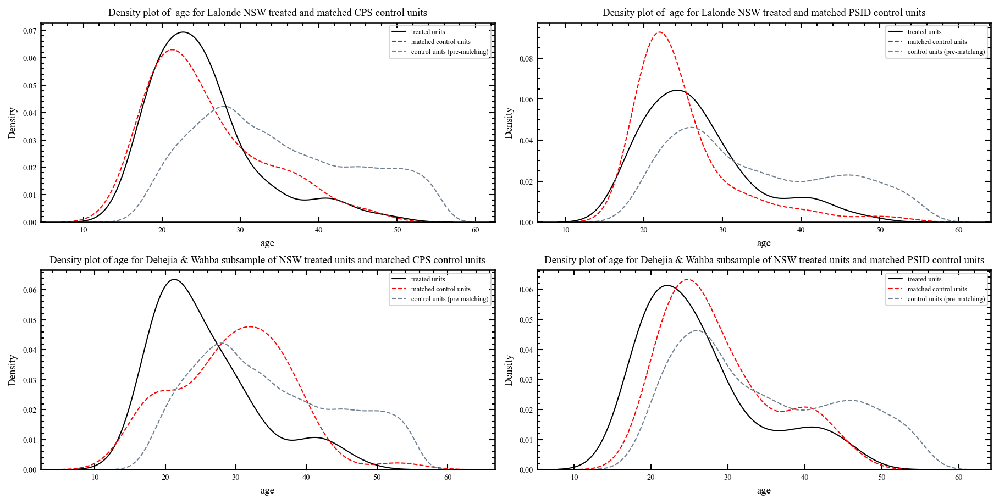

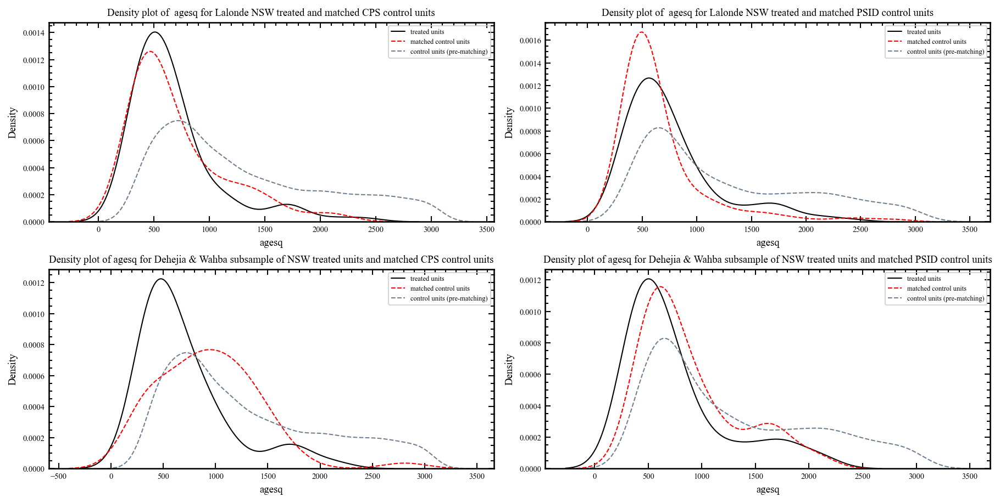

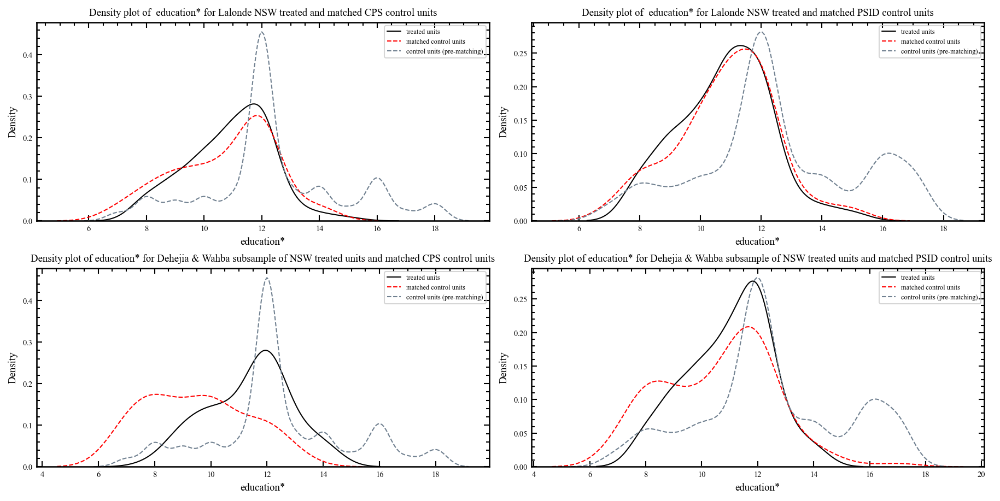

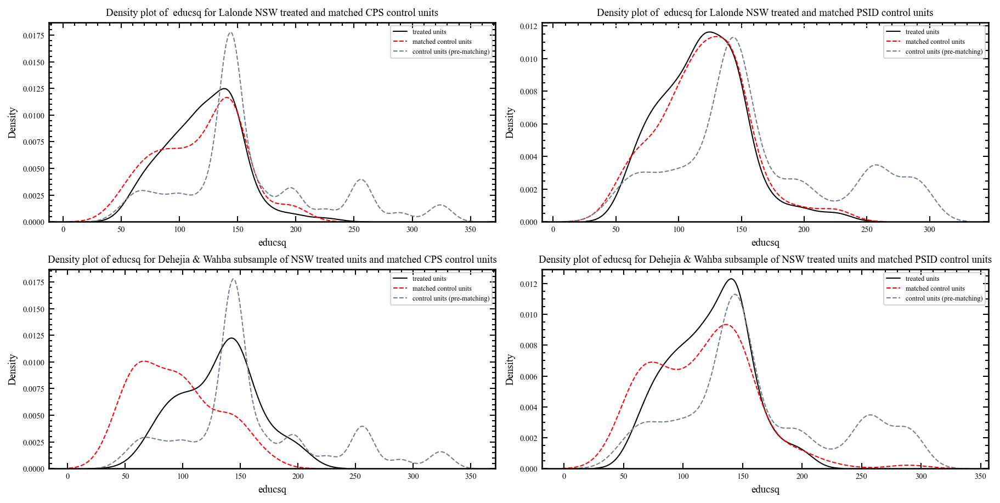

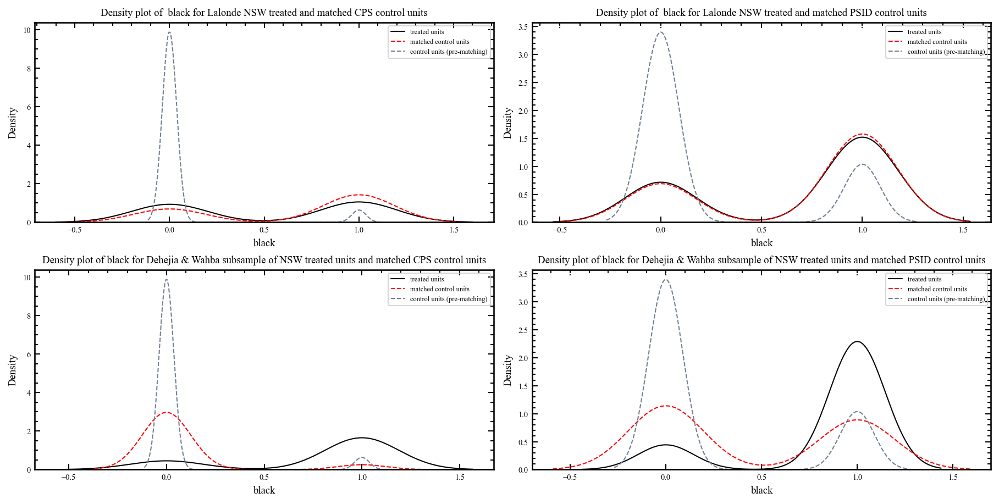

...

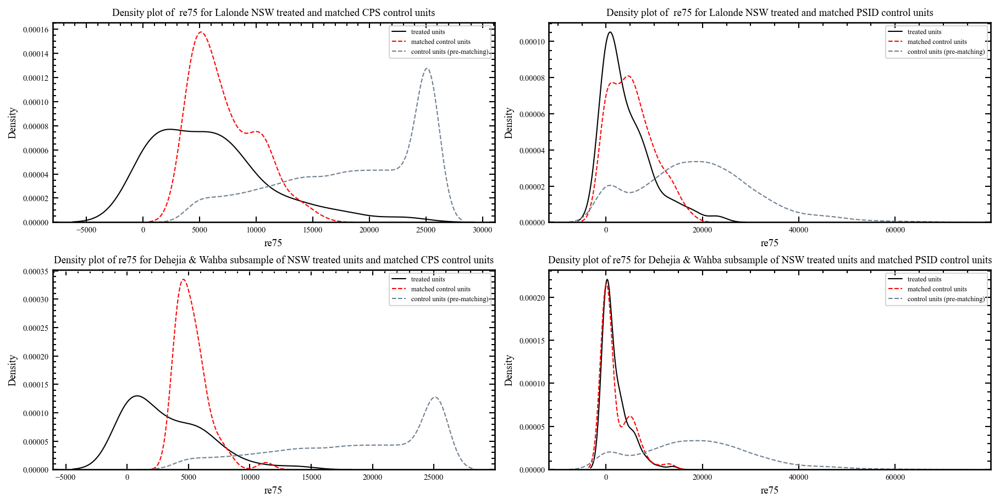

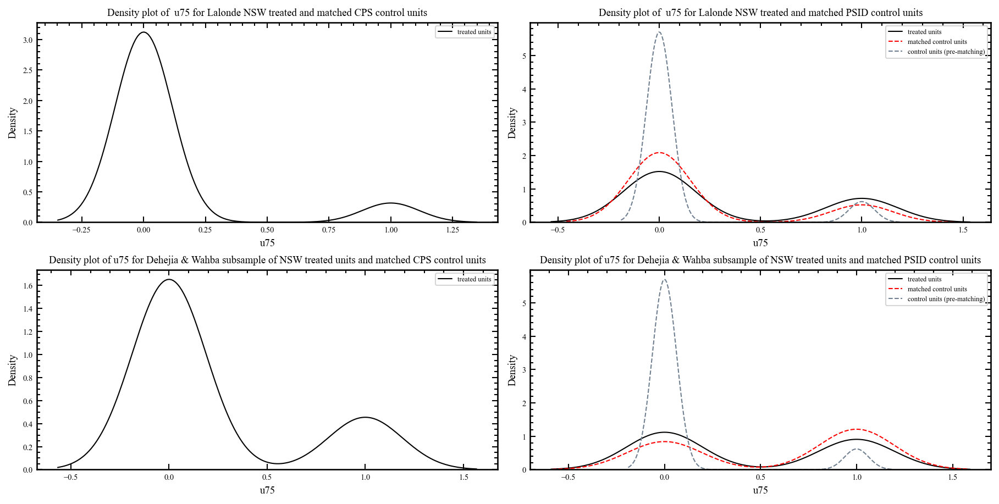

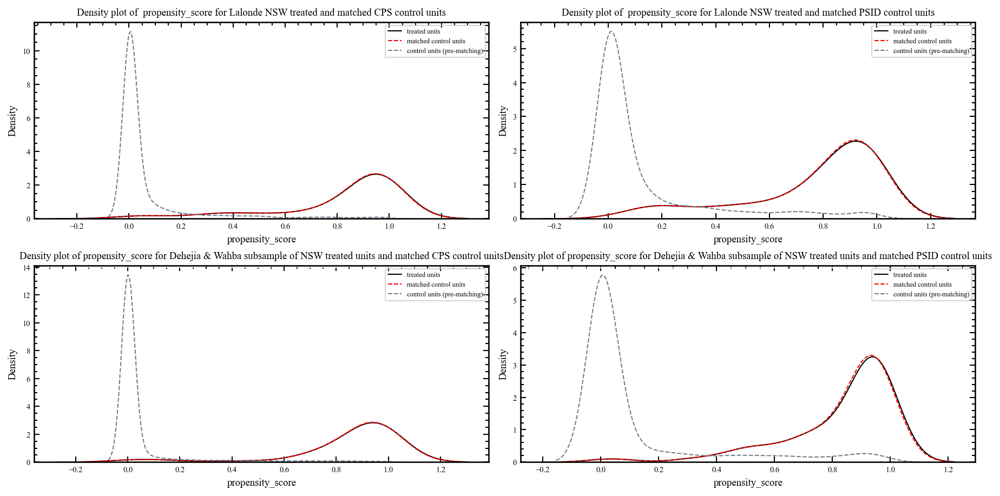

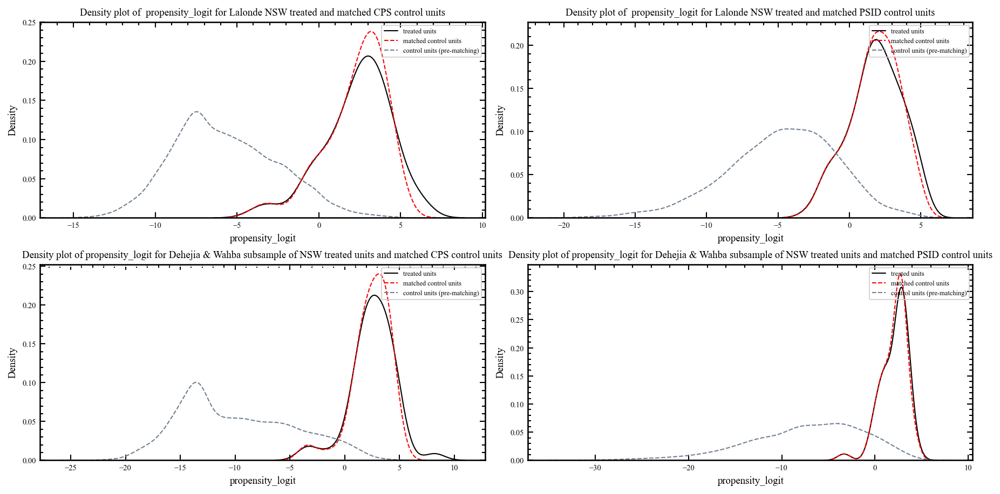

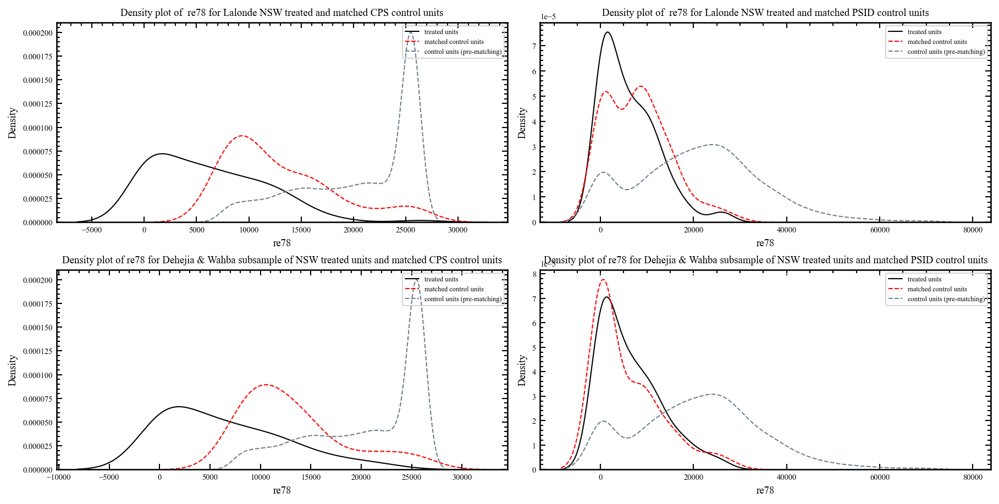

In [156]:



for i in nswCps_lalonde_LOGIT_psMatched.columns[1:len(nswCps_lalonde_LOGIT_psMatched)]:
                        plot_matching_distributions(
                            i,nswCps_lalonde_LOGIT_psMatched,nswCps_lalonde_ps_LOGIT_withRe78,
                            nswPsid_lalonde_LOGIT_psMatched,nswPsid_lalonde_ps_LOGIT_withRe78,
                            nswCps_dehWab_LOGIT_psMatched,nswCps_dehWab_ps_LOGIT_withRe78,
                            nswPsid_dehWab_LOGIT_psMatched,nswPsid_dehWab_ps_LOGIT_withRe78,'LOGIT/'f'{i}''_LOGT'
                            )

### model (2) ; CART 

In [62]:
# Import libraries 
from sklearn import tree          
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
import graphviz               

In [69]:
from imblearn.combine import SMOTEENN
resample=SMOTEENN(random_state=0)

# KFold cross validation 
def kfold_evaluation_SMOTEENN(input_model,features,target,store):
	# prepare the cross-validation procedure
	skf = StratifiedKFold(n_splits=5, shuffle=True,random_state=1)
	
	#Function to get model scores	
	def get_score(model,X_train , X_test, y_train , y_test,fold,store):
		model.fit(X_train,y_train)
		prediction = model.predict(X_test)
		store.loc['Accuracy:', fold] = metrics.balanced_accuracy_score(y_test, prediction)
		store.loc['Precision:', fold] = metrics.precision_score(y_test, prediction)
		store.loc['Recall:', fold] = metrics.recall_score(y_test, prediction)
		store.loc['MSE:', fold] =  metrics.mean_squared_error(y_test, prediction)
		store.loc['MAE:', fold] =  metrics.mean_absolute_error(y_test, prediction)
		store.loc['R^2:', fold] =  metrics.r2_score(y_test, prediction)
		store.loc['auc:', fold] =  metrics.auc(y_test, prediction)
		store.loc['roc_auc:', fold] =  metrics.roc_auc_score(y_test, prediction)
		store.loc['F1:', fold] =  metrics.f1_score(y_test, prediction)
		store.loc['Kappa:', fold] = metrics.cohen_kappa_score(y_test, prediction)
	

	#Kfold training loop
	for fold, (train_index , test_index) in enumerate(skf.split(features,target)):
		#print("TRAIN:", train_index, "TEST:", test_index)
		X_train , X_test, y_train , y_test = features.iloc[train_index,:],features.iloc[test_index,:],\
			                                 target[train_index] , target[test_index]
											 
		X_train, y_train = resample.fit_resample(X_train, y_train)	
		shuffled = pd.concat([pd.DataFrame(X_train),pd.DataFrame(y_train)],axis=1).sample(frac=1,random_state=42).reset_index(drop=True)
		#resplit into test and train 
		X_train, y_train = shuffled.iloc[:,:-1], shuffled.iloc[:,-1]
		get_score(input_model,X_train , X_test, y_train , y_test,fold,store)
		# return statement here with python dataframe of metrics 

#### Data prep for CART

In [70]:
# Load quasi-experimental dataset
nswCps_lalonde =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_lalonde.csv')
nswPsid_lalonde = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_lalonde.csv')
nswCps_dehWab =   pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_dehWab.csv')
nswPsid_dehWab =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_dehWab.csv')

nswCps_lalonde.columns = nswCps_lalonde.columns.str.strip() 
nswPsid_lalonde.columns = nswPsid_lalonde.columns.str.strip() 
nswCps_dehWab.columns = nswCps_dehWab.columns.str.strip() 
nswPsid_dehWab.columns = nswPsid_dehWab.columns.str.strip() 

# Store outcome variable prior to modelling

nswCps_lalonde_re78 = nswCps_lalonde.re78
nswPsid_lalonde_re78 = nswPsid_lalonde.re78
nswCps_dehWab_re78 = nswCps_dehWab.re78
nswPsid_dehWab_re78 = nswPsid_dehWab.re78



In [71]:
""" Select covariates for use in CART model """
sc = StandardScaler()
# ======== Lalonde (1986) data ======== #
LALONDE_subset1 = ['treat','age','education*','black','hispanic','married','nodegree','re75']

# Apply selection
nswCps_lalonde_subset = nswCps_lalonde[LALONDE_subset1]
nswPsid_lalonde_subset = nswPsid_lalonde[LALONDE_subset1]
#lalonde_continuous_vars = ['age','education*','lnre75']  # continuous  variables to be scaled 
# z-score standardise continous variables in all datasets with sk-learn standard scaler 
#nswCps_lalonde_subset[lalonde_continuous_vars] = sc.fit_transform(nswCps_lalonde_subset[lalonde_continuous_vars])
#nswPsid_lalonde_subset[lalonde_continuous_vars] = sc.fit_transform(nswPsid_lalonde_subset[lalonde_continuous_vars])

nswCps_lalonde_target = nswCps_lalonde_subset['treat']
nswCps_lalonde_features = nswCps_lalonde_subset.drop('treat', axis=1)
nswPsid_lalonde_target = nswPsid_lalonde_subset['treat']
nswPsid_lalonde_features = nswPsid_lalonde_subset.drop('treat', axis=1)

# ======== Dehejia & Wahba (1986) sub sample ======== #
nswreDW_subset1 = ['treat','age','education*','black','hispanic','married','nodegree','re74','re75']
# Apply selection
nswCps_dehWab_subset = nswCps_dehWab[nswreDW_subset1]
nswPsid_dehWab_subset = nswPsid_dehWab[nswreDW_subset1]
# continuous  variables to be scaled 
#nswDW_continuous_vars = ['age','education*','lnre74','lnre75'] 
# z-score standardise continous variables in all datasets with sk-learn standard scaler 
#nswCps_dehWab_subset[nswDW_continuous_vars] = sc.fit_transform(nswCps_dehWab_subset[nswDW_continuous_vars])
#nswPsid_dehWab_subset[nswDW_continuous_vars] = sc.fit_transform(nswPsid_dehWab_subset[nswDW_continuous_vars])
nswCps_dehWab_target = nswCps_dehWab_subset['treat']
nswCps_dehWab_features = nswCps_dehWab_subset.drop('treat', axis=1)
nswPsid_dehWab_target = nswPsid_dehWab_subset['treat']
nswPsid_dehWab_features = nswPsid_dehWab_subset.drop('treat', axis=1)


## Validation 

In [72]:
# Grid search 
tree_param = [{'criterion': ['entropy', 'gini'], 
               'max_depth': [1,2,3,4,5,6,7,8,9,10,None],
               'max_leaf_nodes':list(range(0, 100)),
              'min_samples_leaf': [2, 3, 4]}]



In [73]:
# dataframes to store resutls 
cart1_metrics = pd.DataFrame()
cart2_metrics = pd.DataFrame()
cart3_metrics = pd.DataFrame()
cart4_metrics = pd.DataFrame()
#models 
grid_search_cart1 = GridSearchCV(tree.DecisionTreeClassifier(random_state=0), tree_param, verbose=1, cv=3,scoring = 'roc_auc',)
grid_search_cart2 = GridSearchCV(tree.DecisionTreeClassifier(random_state=0), tree_param, verbose=1, cv=3,scoring = 'roc_auc',)
grid_search_cart3 = GridSearchCV(tree.DecisionTreeClassifier(random_state=0), tree_param, verbose=1, cv=3,scoring = 'roc_auc',)
grid_search_cart4 = GridSearchCV(tree.DecisionTreeClassifier(random_state=0), tree_param, verbose=1, cv=3,scoring = 'roc_auc',)


In [74]:
# Takes appx 81 minutes
# CART K-fold training
# ======== Lalonde (1986) sample ======== #
kfold_evaluation_SMOTEENN(grid_search_cart1,nswCps_lalonde_features,nswCps_lalonde_target,cart1_metrics) # cps
kfold_evaluation_SMOTEENN(grid_search_cart2,nswPsid_lalonde_features,nswPsid_lalonde_target,cart2_metrics) # psid
# ======== Dehejia & Wahba (1999) sub sample ======== #
kfold_evaluation_SMOTEENN(grid_search_cart3,nswCps_dehWab_features,nswCps_dehWab_target,cart3_metrics) # cps
kfold_evaluation_SMOTEENN(grid_search_cart4,nswPsid_dehWab_features,nswPsid_dehWab_target,cart4_metrics) # psid

Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 folds for each of 6600 candidates, totalling 19800 fits
Fitting 3 

In [75]:
cart1_metrics.loc['RMSE']=np.sqrt(cart1_metrics.loc["MSE:"])
cart2_metrics.loc['RMSE']=np.sqrt(cart2_metrics.loc["MSE:"])
cart3_metrics.loc['RMSE']=np.sqrt(cart3_metrics.loc["MSE:"])
cart4_metrics.loc['RMSE']=np.sqrt(cart4_metrics.loc["MSE:"])

cart1_metrics['avg'] = np.mean(cart1_metrics,axis=1)
cart2_metrics['avg'] = np.mean(cart2_metrics,axis=1)
cart3_metrics['avg'] = np.mean(cart3_metrics,axis=1)
cart4_metrics['avg'] = np.mean(cart4_metrics,axis=1)

In [76]:
cart1_metrics

,0,1,2,3,4,avg
Accuracy:,0.951121,0.872030,0.934013,0.918159,0.927227,0.920510
Precision:,0.500000,0.477778,0.253659,0.566265,0.404959,0.440532
Recall:,0.928571,0.767857,0.945455,0.854545,0.890909,0.877468
MSE:,0.027573,0.029542,0.076809,0.021675,0.038424,0.038805
MAE:,0.027573,0.029542,0.076809,0.021675,0.038424,0.038805
R^2:,-0.028354,-0.101808,-1.915311,0.177722,-0.457675,-0.465086
auc:,-0.000000,0.500000,0.500000,0.500000,0.500000,0.400000
roc_auc:,0.951121,0.872030,0.934013,0.918159,0.927227,0.920510
F1:,0.650000,0.589041,0.400000,0.681159,0.556818,0.575404
Kappa:,0.636988,0.574580,0.373235,0.670418,0.539669,0.558978


In [77]:
cart2_metrics

,0,1,2,3,4,avg
Accuracy:,0.891933,0.846633,0.904839,0.928076,0.912657,0.896828
Precision:,0.585366,0.694915,0.452174,0.607143,0.685714,0.605062
Recall:,0.857143,0.732143,0.945455,0.927273,0.872727,0.866948
MSE:,0.080769,0.063584,0.127168,0.071291,0.055877,0.079738
MAE:,0.080769,0.063584,0.127168,0.071291,0.055877,0.079738
R^2:,0.159483,0.339440,-0.342241,0.247531,0.410227,0.162888
auc:,-0.000000,1.000000,1.000000,1.000000,0.500000,0.700000
roc_auc:,0.891933,0.846633,0.904839,0.928076,0.912657,0.896828
F1:,0.695652,0.713043,0.611765,0.733813,0.768000,0.704455
Kappa:,0.650984,0.677318,0.546785,0.694711,0.736756,0.661311


In [78]:
cart3_metrics

,0,1,2,3,4,avg
Accuracy:,0.996709,0.977952,0.953280,0.980798,0.921204,0.965989
Precision:,0.723404,0.532258,0.857143,0.666667,0.700000,0.695894
Recall:,1.000000,0.970588,0.909091,0.969697,0.848485,0.939572
MSE:,0.006471,0.014933,0.003982,0.008466,0.008466,0.008464
MAE:,0.006471,0.014933,0.003982,0.008466,0.008466,0.008464
R^2:,0.611065,0.102457,0.753527,0.476241,0.476241,0.483906
auc:,0.500000,-0.000000,-0.000000,-0.000000,-0.000000,0.100000
roc_auc:,0.996709,0.977952,0.953280,0.980798,0.921204,0.965989
F1:,0.839506,0.687500,0.882353,0.790123,0.767123,0.793321
Kappa:,0.836291,0.680516,0.880329,0.785954,0.762852,0.789189


In [79]:
cart4_metrics

,0,1,2,3,4,avg
Accuracy:,0.978448,0.937524,0.879931,0.941680,0.879996,0.923516
Precision:,0.629630,0.645833,0.666667,0.543860,0.500000,0.597198
Recall:,1.000000,0.911765,0.787879,0.939394,0.818182,0.891444
MSE:,0.040161,0.040241,0.040241,0.056338,0.066398,0.048676
MAE:,0.040161,0.040241,0.040241,0.056338,0.066398,0.048676
R^2:,0.368661,0.368568,0.350836,0.091170,-0.071121,0.221623
auc:,1.000000,-0.000000,-0.000000,0.500000,0.500000,0.400000
roc_auc:,0.978448,0.937524,0.879931,0.941680,0.879996,0.923516
F1:,0.772727,0.756098,0.722222,0.688889,0.620690,0.712125
Kappa:,0.751943,0.734863,0.700693,0.660320,0.586616,0.686887


### Inference

In [80]:
# Predict get scores on NSW , CPS and PSID 
# ============ Lalonde Subsample ============ # 
# predict propensity scores
nswCps_lalonde_ps_CART = propensity_score_funct(nswCps_lalonde_subset,grid_search_cart1)
nswPsid_lalonde_ps_CART = propensity_score_funct(nswPsid_lalonde_subset,grid_search_cart2)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
nswCps_lalonde_ps_CART_withRe78 = pd.merge(nswCps_lalonde_ps_CART,nswCps_lalonde_re78,left_index=True, right_index=True)
nswPsid_lalonde_ps_CART_withRe78 = pd.merge(nswPsid_lalonde_ps_CART,nswPsid_lalonde_re78,left_index=True, right_index=True)
# ============ Dehejia & Wahba sub sample ============ # 
# predict propensity scores
nswCps_dehWab_ps_CART = propensity_score_funct(nswCps_dehWab_subset,grid_search_cart3)
nswPsid_dehWab_ps_CART = propensity_score_funct(nswPsid_dehWab_subset,grid_search_cart4)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
nswCps_dehWab_ps_CART_withRe78 = pd.merge(nswCps_dehWab_ps_CART,nswCps_dehWab_re78,left_index=True, right_index=True)
nswPsid_dehWab_ps_CART_withRe78  = pd.merge(nswPsid_dehWab_ps_CART,nswPsid_dehWab_re78,left_index=True, right_index=True)


In [81]:
# save unmatched CART datasets 
nswCps_lalonde_ps_CART_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/unmatched/nswCps_lalonde_ps_unmatched_CART.csv')
nswPsid_lalonde_ps_CART_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/unmatched/nswPsid_lalonde_ps_unmatched_CART.csv')
nswCps_dehWab_ps_CART_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/unmatched/nswCps_dehWab_ps_unmatched_CART.csv')
nswPsid_dehWab_ps_CART_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/unmatched/nswPsid_dehWab_ps_unmatched_CART.csv')

In [101]:
# Load matched data from STATA
nswCps_lalonde_CART_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/nswCps_lalonde_CART_psMatched.csv',header = True,index = False)
nswPsid_lalonde_CART_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/nswPsid_lalonde_CART_psMatched.csv',header = True,index = False)
nswCps_dehWab_CART_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/nswCps_dehWab_CART_psMatched.csv',header = True,index = False)
nswPsid_dehWab_CART_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/nswPsid_dehWab_CART_psMatched.csv',header = True,index = False)

### model (3) ; Random Forest

In [82]:
# Load quasi-experimental dataset

nswCps_lalonde =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_lalonde.csv')
nswPsid_lalonde = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_lalonde.csv')
nswCps_dehWab =   pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_dehWab.csv')
nswPsid_dehWab =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_dehWab.csv')

nswCps_lalonde.columns = nswCps_lalonde.columns.str.strip() 
nswPsid_lalonde.columns = nswPsid_lalonde.columns.str.strip() 
nswCps_dehWab.columns = nswCps_dehWab.columns.str.strip() 
nswPsid_dehWab.columns = nswPsid_dehWab.columns.str.strip() 

# Store outcome variable prior to modelling

nswCps_lalonde_re78 = nswCps_lalonde.re78
nswPsid_lalonde_re78 = nswPsid_lalonde.re78
nswCps_dehWab_re78 = nswCps_dehWab.re78
nswPsid_dehWab_re78 = nswPsid_dehWab.re78


In [83]:
nswCps_lalonde

,treat,age,black,hispanic,married,nodegree,re75,re78,education*,u75,...,education_9,education_10,education_11,education_12,education_13,education_14,education_15,education_16,education_17,education_18
0,1.0,37,1.0,0.0,1.0,1.0,0,9930,11,1,...,0,0,1,0,0,0,0,0,0,0
1,1.0,22,0.0,1.0,0.0,1.0,0,3595,9,1,...,1,0,0,0,0,0,0,0,0,0
2,1.0,30,1.0,0.0,0.0,0.0,0,24909,12,1,...,0,0,0,1,0,0,0,0,0,0
3,1.0,27,1.0,0.0,0.0,1.0,0,7506,11,1,...,0,0,1,0,0,0,0,0,0,0
4,1.0,33,1.0,0.0,0.0,1.0,0,289,8,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10148,0.0,27,0.0,0.0,1.0,0.0,25243,25564,13,0,...,0,0,0,0,1,0,0,0,0,0
10149,0.0,55,0.0,0.0,1.0,1.0,25243,21463,9,0,...,1,0,0,0,0,0,0,0,0,0
10150,0.0,48,0.0,0.0,1.0,1.0,25243,25564,10,0,...,0,1,0,0,0,0,0,0,0,0
10151,0.0,47,0.0,0.0,1.0,1.0,11384,13671,9,0,...,1,0,0,0,0,0,0,0,0,0


In [84]:
""" Select covariates for use in CART model """
#sc = StandardScaler()
# ======== Lalonde (1986) data ======== #
LALONDE_subset1 = ['treat','age','education*','black','hispanic','married','nodegree','re75']

# Apply selection
nswCps_lalonde_subset = nswCps_lalonde[LALONDE_subset1]
nswPsid_lalonde_subset = nswPsid_lalonde[LALONDE_subset1]
#lalonde_continuous_vars = ['age','education*','lnre75']  # continuous  variables to be scaled 
# z-score standardise continous variables in all datasets with sk-learn standard scaler 
#nswCps_lalonde_subset[lalonde_continuous_vars] = sc.fit_transform(nswCps_lalonde_subset[lalonde_continuous_vars])
#nswPsid_lalonde_subset[lalonde_continuous_vars] = sc.fit_transform(nswPsid_lalonde_subset[lalonde_continuous_vars])

nswCps_lalonde_target = nswCps_lalonde_subset['treat']
nswCps_lalonde_features = nswCps_lalonde_subset.drop('treat', axis=1)
nswPsid_lalonde_target = nswPsid_lalonde_subset['treat']
nswPsid_lalonde_features = nswPsid_lalonde_subset.drop('treat', axis=1)

# ======== Dehejia & Wahba (1986) sub sample ======== #
nswreDW_subset1 = ['treat','age','education*','black','hispanic','married','nodegree','re74','re75']
# Apply selection
nswCps_dehWab_subset = nswCps_dehWab[nswreDW_subset1]
nswPsid_dehWab_subset = nswPsid_dehWab[nswreDW_subset1]
# continuous  variables to be scaled 
#nswDW_continuous_vars = ['age','education*','lnre74','lnre75'] 
# z-score standardise continous variables in all datasets with sk-learn standard scaler 
#nswCps_dehWab_subset[nswDW_continuous_vars] = sc.fit_transform(nswCps_dehWab_subset[nswDW_continuous_vars])
#nswPsid_dehWab_subset[nswDW_continuous_vars] = sc.fit_transform(nswPsid_dehWab_subset[nswDW_continuous_vars])

nswCps_dehWab_target = nswCps_dehWab_subset['treat']
nswCps_dehWab_features = nswCps_dehWab_subset.drop('treat', axis=1)
nswPsid_dehWab_target = nswPsid_dehWab_subset['treat']
nswPsid_dehWab_features = nswPsid_dehWab_subset.drop('treat', axis=1)


## Validation 

In [85]:
from sklearn import tree          
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
import graphviz  

In [86]:
# Grid search 
forest_param_grid = { 
    'n_estimators': [100,500,100],
    'max_features': ['auto', 'sqrt', 'log2'],
    'min_samples_split':[1,2,3],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [87]:
# Import libraries
from sklearn.ensemble import RandomForestClassifier
# dataframes to store resutls 
forest1_metrics = pd.DataFrame()
forest2_metrics = pd.DataFrame()
forest3_metrics = pd.DataFrame()
forest4_metrics = pd.DataFrame()
#models 
grid_search_forest1 = GridSearchCV(RandomForestClassifier(random_state=0), forest_param_grid, verbose=1, cv=3,scoring = 'roc_auc',)
grid_search_forest2 = GridSearchCV(RandomForestClassifier(random_state=0), forest_param_grid, verbose=1, cv=3,scoring = 'roc_auc',)
grid_search_forest3 = GridSearchCV(RandomForestClassifier(random_state=0), forest_param_grid, verbose=1, cv=3,scoring = 'roc_auc',)
grid_search_forest4 = GridSearchCV(RandomForestClassifier(random_state=0), forest_param_grid, verbose=1, cv=3,scoring = 'roc_auc',)

In [88]:
# Takes appx 144 minutes
# CART K-fold training
# ======== Lalonde (1986) sample ======== #
kfold_evaluation_SMOTEENN(grid_search_forest1,nswCps_lalonde_features,nswCps_lalonde_target,forest1_metrics) # cps
kfold_evaluation_SMOTEENN(grid_search_forest2,nswPsid_lalonde_features,nswPsid_lalonde_target,forest2_metrics) # psid
# ======== Dehejia & Wahba (1999) sub sample ======= #
kfold_evaluation_SMOTEENN(grid_search_forest3,nswCps_dehWab_features,nswCps_dehWab_target,forest3_metrics) # cps
kfold_evaluation_SMOTEENN(grid_search_forest4,nswPsid_dehWab_features,nswPsid_dehWab_target,forest4_metrics) # psid

Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 810 fits
Fitting 3 folds for each of 270 candidates, totalling 8

In [90]:
forest1_metrics.loc['RMSE']=np.sqrt(forest1_metrics.loc["MSE:"])
forest2_metrics.loc['RMSE']=np.sqrt(forest2_metrics.loc["MSE:"])
forest3_metrics.loc['RMSE']=np.sqrt(forest3_metrics.loc["MSE:"])
forest4_metrics.loc['RMSE']=np.sqrt(forest4_metrics.loc["MSE:"])

forest1_metrics['avg'] = np.mean(forest1_metrics,axis=1)
forest2_metrics['avg'] = np.mean(forest2_metrics,axis=1)
forest3_metrics['avg'] = np.mean(forest3_metrics,axis=1)
forest4_metrics['avg'] = np.mean(forest4_metrics,axis=1)

In [91]:
forest1_metrics

,0,1,2,3,4,avg
Accuracy:,0.940606,0.869177,0.972203,0.928262,0.937860,0.929622
Precision:,0.684932,0.646154,0.582418,0.600000,0.620253,0.626751
Recall:,0.892857,0.750000,0.963636,0.872727,0.890909,0.874026
MSE:,0.014279,0.018218,0.019695,0.019212,0.017734,0.017827
MAE:,0.014279,0.018218,0.019695,0.019212,0.017734,0.017827
R^2:,0.467459,0.320552,0.252484,0.271162,0.327227,0.327777
auc:,-0.000000,0.500000,0.500000,0.500000,0.500000,0.400000
roc_auc:,0.940606,0.869177,0.972203,0.928262,0.937860,0.929622
F1:,0.775194,0.694215,0.726027,0.711111,0.731343,0.727578
Kappa:,0.767952,0.684880,0.716456,0.701527,0.722477,0.718658


In [92]:
# Best parameters 
grid_search_forest1.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 'auto',
 'min_samples_split': 3,
 'n_estimators': 500}

In [93]:
forest2_metrics


,0,1,2,3,4,avg
Accuracy:,0.869150,0.843393,0.940400,0.918045,0.911579,0.896513
Precision:,0.666667,0.661290,0.634146,0.738462,0.676056,0.675324
Recall:,0.785714,0.732143,0.945455,0.872727,0.872727,0.841753
MSE:,0.065385,0.069364,0.063584,0.046243,0.057803,0.060476
MAE:,0.065385,0.069364,0.063584,0.046243,0.057803,0.060476
R^2:,0.319581,0.279389,0.328879,0.511912,0.389890,0.365930
auc:,-0.000000,0.500000,1.000000,0.500000,0.500000,0.500000
roc_auc:,0.869150,0.843393,0.940400,0.918045,0.911579,0.896513
F1:,0.721311,0.694915,0.759124,0.800000,0.761905,0.747451
Kappa:,0.684556,0.655899,0.724127,0.774061,0.729612,0.713651


In [94]:
grid_search_forest2.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 'auto',
 'min_samples_split': 2,
 'n_estimators': 500}

In [132]:
forest3_metrics

,0,1,2,3,4,avg
Accuracy:,0.998228,0.984281,0.938382,0.998481,0.922977,0.968470
Precision:,0.829268,0.891892,0.878788,0.846154,0.848485,0.858917
Recall:,1.000000,0.970588,0.878788,1.000000,0.848485,0.939572
MSE:,0.003484,0.002489,0.003982,0.002988,0.004980,0.003585
MAE:,0.003484,0.002489,0.003982,0.002988,0.004980,0.003585
R^2:,0.790573,0.850410,0.753527,0.815144,0.691906,0.780312
auc:,0.500000,-0.000000,-0.000000,0.500000,-0.000000,0.200000
roc_auc:,0.998228,0.984281,0.938382,0.998481,0.922977,0.968470
F1:,0.906667,0.929577,0.878788,0.916667,0.848485,0.896037
Kappa:,0.904907,0.928313,0.876764,0.915156,0.845953,0.894219


In [95]:
grid_search_forest3.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 100}

In [133]:
forest4_metrics

,0,1,2,3,4,avg
Accuracy:,0.983836,0.957629,0.850705,0.938382,0.904846,0.927080
Precision:,0.693878,0.727273,0.666667,0.666667,0.608696,0.672636
Recall:,1.000000,0.941176,0.727273,0.909091,0.848485,0.885205
MSE:,0.030120,0.028169,0.042254,0.036217,0.046278,0.036608
MAE:,0.030120,0.028169,0.042254,0.036217,0.046278,0.036608
R^2:,0.526496,0.557998,0.318378,0.415752,0.253461,0.414417
auc:,1.000000,-0.000000,-0.000000,0.500000,-0.000000,0.300000
roc_auc:,0.983836,0.957629,0.850705,0.938382,0.904846,0.927080
F1:,0.819277,0.820513,0.695652,0.769231,0.708861,0.762707
Kappa:,0.803431,0.805501,0.672996,0.750084,0.684462,0.743295


In [96]:
grid_search_forest4.best_params_

{'criterion': 'gini',
 'max_depth': 8,
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 100}

### Inference

In [130]:
# Predict get scores on NSW , CPS and PSID 
# ============ Lalonde Subsample ============ # 
# predict propensity scores
nswCps_lalonde_ps_FOREST = propensity_score_funct(nswCps_lalonde_subset,grid_search_forest1)
nswPsid_lalonde_ps_FOREST = propensity_score_funct(nswPsid_lalonde_subset,grid_search_forest2)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
nswCps_lalonde_ps_FOREST_withRe78 = pd.merge(nswCps_lalonde_ps_FOREST,nswCps_lalonde_re78,left_index=True, right_index=True)
nswPsid_lalonde_ps_FOREST_withRe78 = pd.merge(nswPsid_lalonde_ps_FOREST,nswPsid_lalonde_re78,left_index=True, right_index=True)
# ============ Dehejia & Wahba sub sample ============ # 
# predict propensity scores
nswCps_dehWab_ps_FOREST = propensity_score_funct(nswCps_dehWab_subset,grid_search_forest3)
nswPsid_dehWab_ps_FOREST = propensity_score_funct(nswPsid_dehWab_subset,grid_search_forest4)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
nswCps_dehWab_ps_FOREST_withRe78 = pd.merge(nswCps_dehWab_ps_FOREST,nswCps_dehWab_re78,left_index=True, right_index=True)
nswPsid_dehWab_ps_FOREST_withRe78  = pd.merge(nswPsid_dehWab_ps_FOREST,nswPsid_dehWab_re78,left_index=True, right_index=True)


In [131]:
# save unmatched logit datasets 
nswCps_lalonde_ps_FOREST_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/unmatched/nswCps_lalonde_ps_unmatched_FOREST.csv')
nswPsid_lalonde_ps_FOREST_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/unmatched/nswPsid_lalonde_ps_unmatched_FOREST.csv')
nswCps_dehWab_ps_FOREST_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/unmatched/nswCps_dehWab_ps_unmatched_FOREST.csv')
nswPsid_dehWab_ps_FOREST_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/unmatched/nswPsid_dehWab_ps_unmatched_FOREST.csv')

# SAVE Quasi experimental datasets with lalonde treated and matched controls 
nswCps_lalonde_FOREST_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/nswCps_lalonde_forest_psMatched.csv',header = True,index = False)
nswPsid_lalonde_FOREST_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/nswPsid_lalonde_forest_psMatched.csv',header = True,index = False)
nswCps_dehWab_FOREST_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/nswCps_dehWab_forest_psMatched.csv',header = True,index = False)
nswPsid_dehWab_FOREST_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/nswPsid_dehWab_forest_psMatched.csv',header = True,index = False)

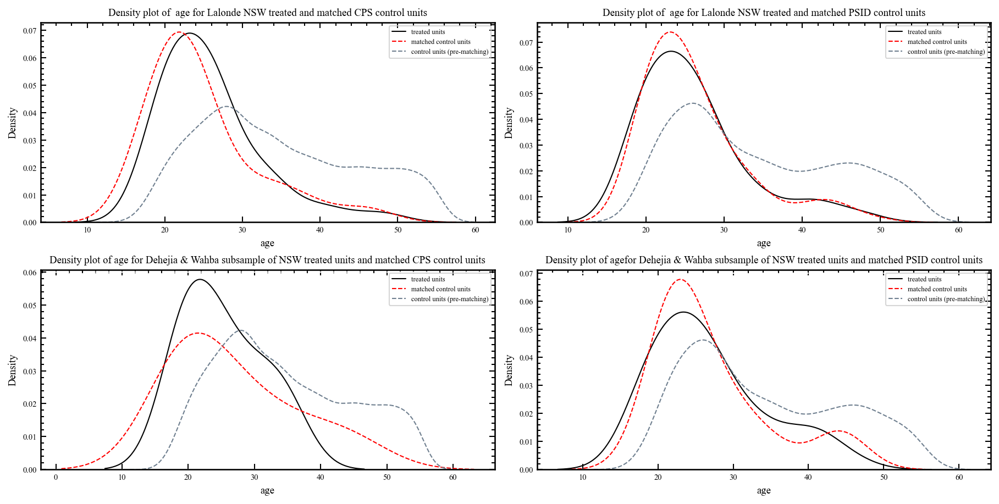

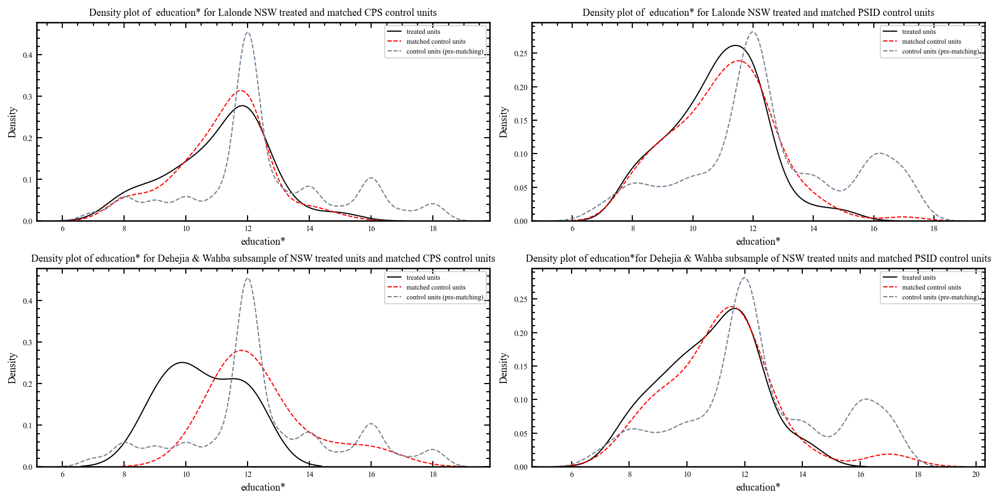

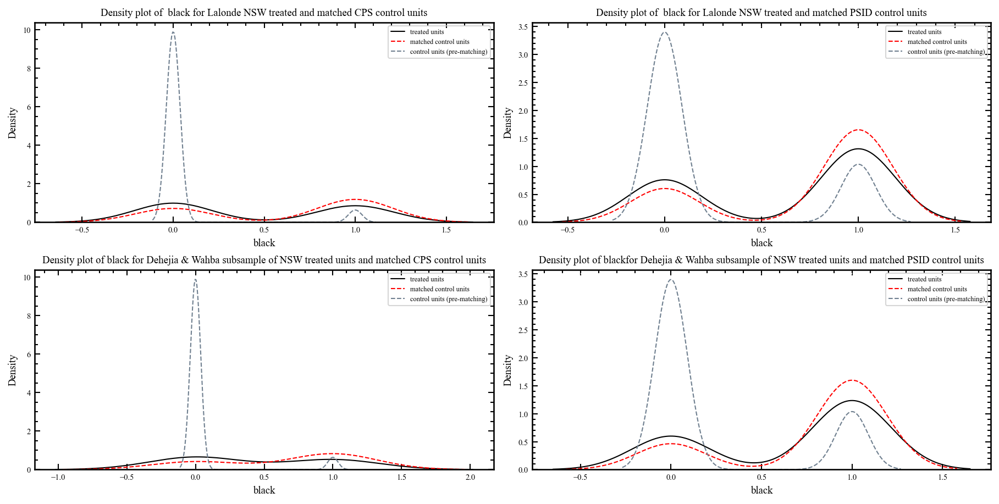

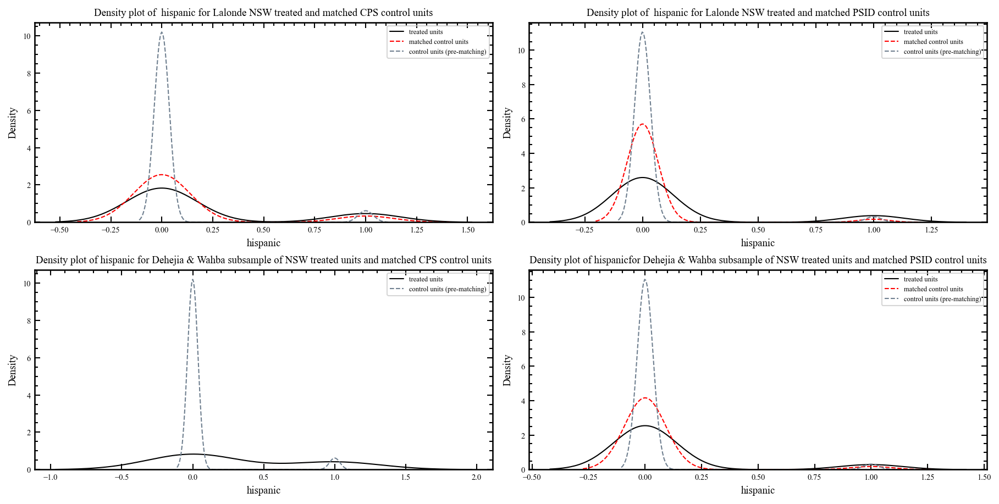

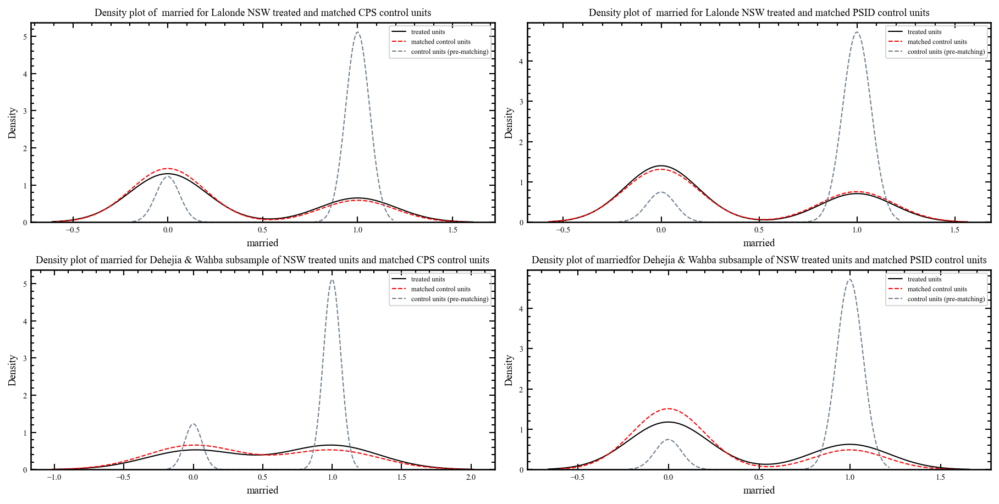

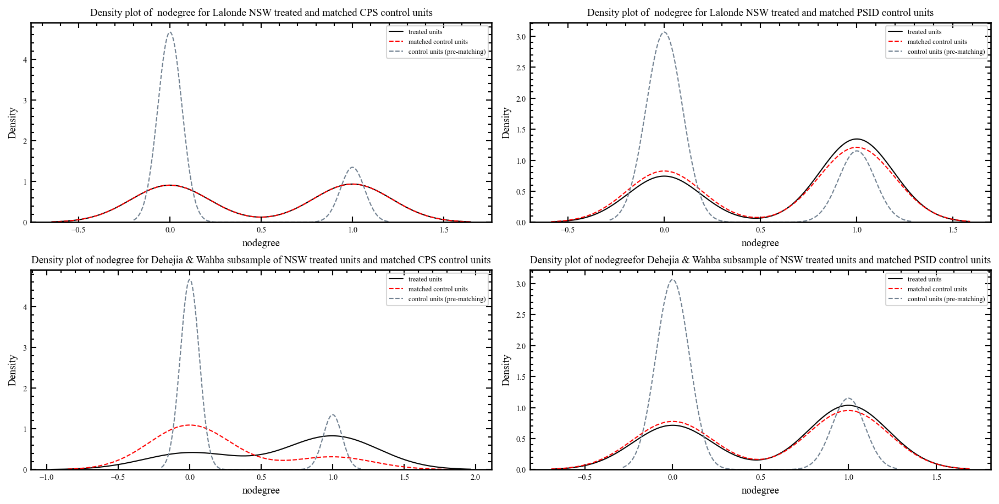

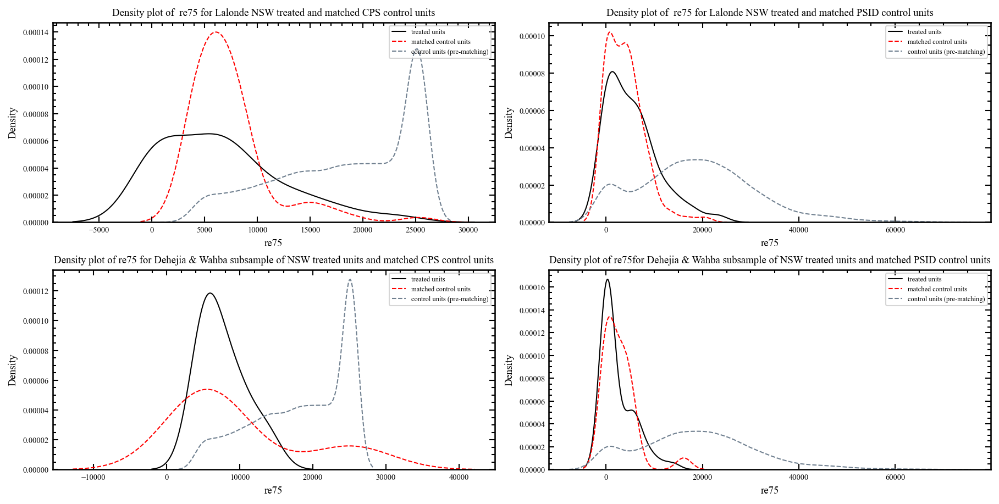

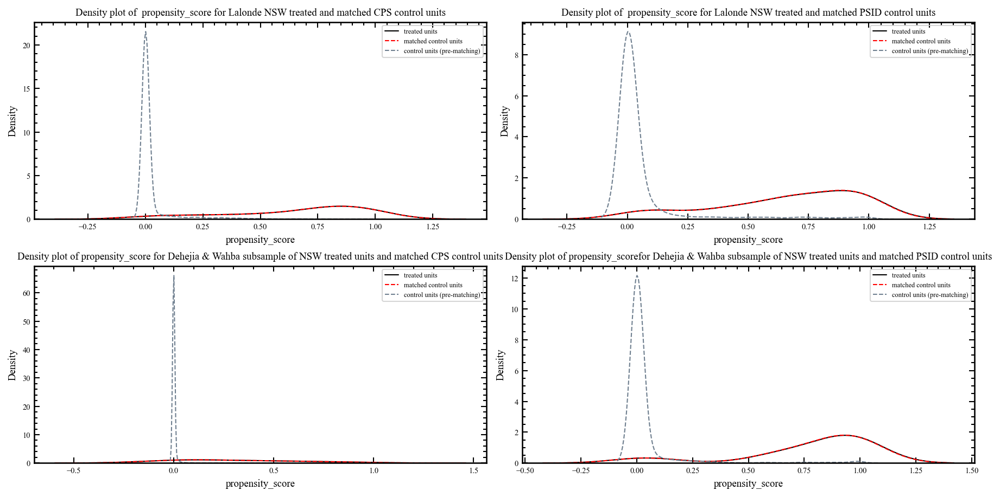

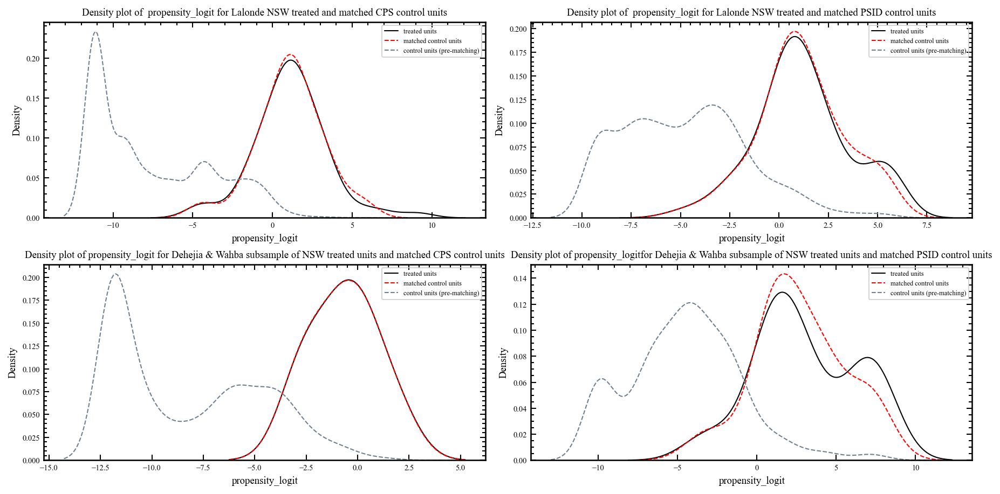

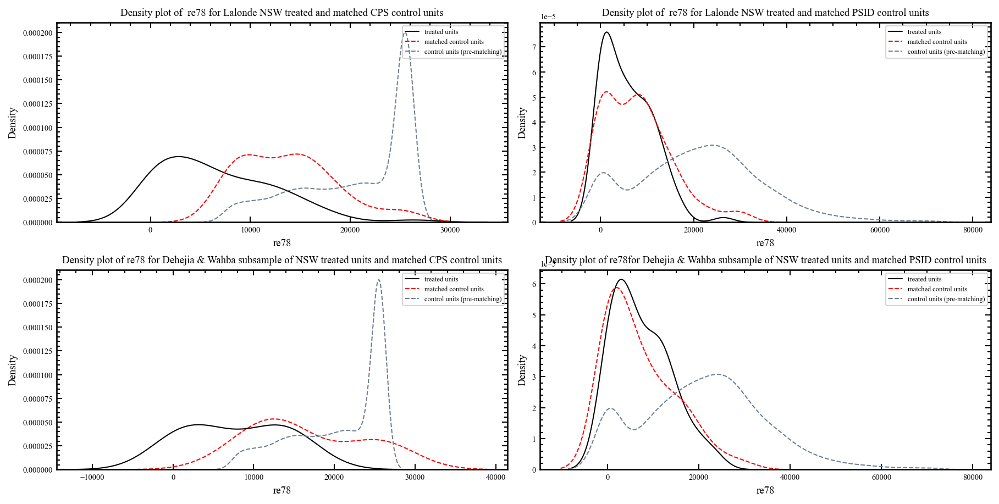

In [153]:
for i in nswCps_lalonde_FOREST_psMatched.columns[1:len(nswCps_lalonde_FOREST_psMatched)]:
    plot_matching_distributions(
                            i,nswCps_lalonde_FOREST_psMatched,nswCps_lalonde_ps_FOREST_withRe78,
                            nswPsid_lalonde_FOREST_psMatched,nswPsid_lalonde_ps_FOREST_withRe78,
                            nswCps_dehWab_FOREST_psMatched,nswCps_dehWab_ps_FOREST_withRe78,
                            nswPsid_dehWab_FOREST_psMatched,nswPsid_dehWab_ps_FOREST_withRe78,'FOREST/'f'{i}''_FOREST'
                            )


### model (4) ; Boosted Trees

In [132]:
# Load quasi-experimental dataset
nswCps_lalonde =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_lalonde.csv')
nswPsid_lalonde = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_lalonde.csv')
nswCps_dehWab =   pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_dehWab.csv')
nswPsid_dehWab =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_dehWab.csv')

nswCps_lalonde.columns = nswCps_lalonde.columns.str.strip() 
nswPsid_lalonde.columns = nswPsid_lalonde.columns.str.strip() 
nswCps_dehWab.columns = nswCps_dehWab.columns.str.strip() 
nswPsid_dehWab.columns = nswPsid_dehWab.columns.str.strip() 

# Store outcome variable prior to modelling
nswCps_lalonde_re78 = nswCps_lalonde.re78
nswPsid_lalonde_re78 = nswPsid_lalonde.re78
nswCps_dehWab_re78 = nswCps_dehWab.re78
nswPsid_dehWab_re78 = nswPsid_dehWab.re78

In [140]:
""" Select covariates for use in CART model """
#sc = StandardScaler()
# ======== Lalonde (1986) data ======== #
LALONDE_subset1 = ['treat','age','education*','black','hispanic','married','nodegree','re75']

# Apply selection
nswCps_lalonde_subset = nswCps_lalonde[LALONDE_subset1]
nswPsid_lalonde_subset = nswPsid_lalonde[LALONDE_subset1]
#lalonde_continuous_vars = ['age','education*','lnre75']  # continuous  variables to be scaled 
# z-score standardise continous variables in all datasets with sk-learn standard scaler 
#nswCps_lalonde_subset[lalonde_continuous_vars] = sc.fit_transform(nswCps_lalonde_subset[lalonde_continuous_vars])
#nswPsid_lalonde_subset[lalonde_continuous_vars] = sc.fit_transform(nswPsid_lalonde_subset[lalonde_continuous_vars])

nswCps_lalonde_target = nswCps_lalonde_subset['treat']
nswCps_lalonde_features = nswCps_lalonde_subset.drop('treat', axis=1)
nswPsid_lalonde_target = nswPsid_lalonde_subset['treat']
nswPsid_lalonde_features = nswPsid_lalonde_subset.drop('treat', axis=1)

# ======== Dehejia & Wahba (1986) sub sample ======== #
nswreDW_subset1 = ['treat','age','education*','black','hispanic','married','nodegree','re74','re75']
# Apply selection
nswCps_dehWab_subset = nswCps_dehWab[nswreDW_subset1]
nswPsid_dehWab_subset = nswPsid_dehWab[nswreDW_subset1]
# continuous  variables to be scaled 
#nswDW_continuous_vars = ['age','education*','lnre74','lnre75'] 
# z-score standardise continous variables in all datasets with sk-learn standard scaler 
#nswCps_dehWab_subset[nswDW_continuous_vars] = sc.fit_transform(nswCps_dehWab_subset[nswDW_continuous_vars])
#nswPsid_dehWab_subset[nswDW_continuous_vars] = sc.fit_transform(nswPsid_dehWab_subset[nswDW_continuous_vars])

nswCps_dehWab_target = nswCps_dehWab_subset['treat']
nswCps_dehWab_features = nswCps_dehWab_subset.drop('treat', axis=1)
nswPsid_dehWab_target = nswPsid_dehWab_subset['treat']
nswPsid_dehWab_features = nswPsid_dehWab_subset.drop('treat', axis=1)



In [141]:
from xgboost import XGBClassifier
from xgboost import plot_tree

## Validation 

In [145]:
# Boosting parameters 
""""
Booster = type of model to run at each iteration
subsample = fraction of training samples (randomly selected) used to train each tree
colsample_bytree = fraction of features (randomly selected) used to train each tree

min_child_weight [default = 1] : Used to control over-fitting. 
                                Higher values prevent a model from learning 
                                relations which might be highly specific to the 
                                particular sample selected for a tree.

max_depth = max tree depth 
"""
params1 = {
        'booster':['gbtree','dart'],            
        'min_child_weight': [1,2,3,4,5],
        #'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.5],         
        'colsample_bytree': [0.3,0.5, 0.7,0.8], 
        'max_depth': [1,2,3,4,5,6,7,8,9,10,None],
        'learning_rate': [0.01,0.025,0.05,0.075,0.1,0.2,0.3]
        }

params2 = {
        'booster':['gbtree','dart'],            
        'min_child_weight': [1,2],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.3,0.5, 0.7,0.8],         
        'colsample_bytree': [0.3,0.5, 0.7,0.8], 
        'max_depth': [1,2,3,4,5,None],
        'learning_rate': [0.01,0.025,0.05]
        } 

params3 = {
        'booster':['gbtree','dart'],            
        'min_child_weight': [1,2],
        'gamma': [0.5,1],
        'subsample': [0.3,0.5],         
        'colsample_bytree': [0.3], 
        'max_depth': [1,2,3,None],
        'learning_rate': [0.01,0.05]
        }        
                       
        
# Set up tree classifier
estimator = XGBClassifier(objective= 'binary:logistic',seed=0,nthread=4)       


In [148]:
# dataframes to store results 
boost1_metrics = pd.DataFrame()
boost2_metrics = pd.DataFrame()
boost3_metrics = pd.DataFrame()
boost4_metrics = pd.DataFrame()
#models 
grid_search_boost1 = GridSearchCV(estimator=estimator,param_grid=params3,verbose= True,cv = 3,scoring = 'roc_auc')
grid_search_boost2 = GridSearchCV(estimator=estimator,param_grid=params3,verbose= True,cv = 3,scoring = 'roc_auc')
grid_search_boost3 = GridSearchCV(estimator=estimator,param_grid=params3,verbose= True,cv = 3,scoring = 'roc_auc')
grid_search_boost4 = GridSearchCV(estimator=estimator,param_grid=params3,verbose= True,cv = 3,scoring = 'roc_auc')


In [149]:
# Takes appx 73 minutes
# XGboost K-fold training
# ======== Lalonde (1986) sample ======== #
kfold_evaluation_SMOTEENN(grid_search_boost1,nswCps_lalonde_features,nswCps_lalonde_target,boost1_metrics) # cps
kfold_evaluation_SMOTEENN(grid_search_boost2,nswPsid_lalonde_features,nswPsid_lalonde_target,boost2_metrics) # psid
# ======== Dehejia & Wahba (1999) sub sample ======== #
kfold_evaluation_SMOTEENN(grid_search_boost3,nswCps_dehWab_features,nswCps_dehWab_target,boost3_metrics) # cps
kfold_evaluation_SMOTEENN(grid_search_boost4,nswPsid_dehWab_features,nswPsid_dehWab_target,boost4_metrics) # psid

Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 384 fits
Fitting 3 folds for each of 128 candidates, totalling 3

In [150]:
boost1_metrics.loc['RMSE']=np.sqrt(boost1_metrics.loc["MSE:"])
boost2_metrics.loc['RMSE']=np.sqrt(boost2_metrics.loc["MSE:"])
boost3_metrics.loc['RMSE']=np.sqrt(boost3_metrics.loc["MSE:"])
boost4_metrics.loc['RMSE']=np.sqrt(boost4_metrics.loc["MSE:"])

boost1_metrics['avg'] = np.mean(boost1_metrics,axis=1)
boost2_metrics['avg'] = np.mean(boost2_metrics,axis=1)
boost3_metrics['avg'] = np.mean(boost3_metrics,axis=1)
boost4_metrics['avg'] = np.mean(boost4_metrics,axis=1)

In [151]:
boost1_metrics

,0,1,2,3,4,avg
Accuracy:,0.937821,0.899828,0.947442,0.923199,0.933049,0.928268
Precision:,0.595238,0.516854,0.443478,0.480000,0.500000,0.507114
Recall:,0.892857,0.821429,0.927273,0.872727,0.890909,0.881039
MSE:,0.019695,0.026096,0.033481,0.029064,0.027094,0.027086
MAE:,0.019695,0.026096,0.033481,0.029064,0.027094,0.027086
R^2:,0.265461,0.026736,-0.270777,-0.102601,-0.027848,-0.021806
auc:,-0.000000,0.500000,0.500000,0.500000,0.500000,0.400000
roc_auc:,0.937821,0.899828,0.947442,0.923199,0.933049,0.928268
F1:,0.714286,0.634483,0.600000,0.619355,0.640523,0.641729
Kappa:,0.704509,0.621677,0.584787,0.605566,0.627597,0.628827


In [152]:
boost2_metrics

,0,1,2,3,4,avg
Accuracy:,0.897014,0.842313,0.929624,0.932524,0.911579,0.902611
Precision:,0.691176,0.650794,0.565217,0.803279,0.676056,0.677305
Recall:,0.839286,0.732143,0.945455,0.890909,0.872727,0.856104
MSE:,0.057692,0.071291,0.082852,0.034682,0.057803,0.060864
MAE:,0.057692,0.071291,0.082852,0.034682,0.057803,0.060864
R^2:,0.399631,0.259372,0.125509,0.633934,0.389890,0.361667
auc:,-0.000000,0.500000,1.000000,0.500000,0.500000,0.500000
roc_auc:,0.897014,0.842313,0.929624,0.932524,0.911579,0.902611
F1:,0.758065,0.689076,0.707483,0.844828,0.761905,0.752271
Kappa:,0.725661,0.648972,0.662748,0.825364,0.729612,0.718471


In [153]:
boost3_metrics

,0,1,2,3,4,avg
Accuracy:,0.981243,0.966284,0.935092,0.982823,0.936609,0.960411
Precision:,0.673469,0.653061,0.630435,0.800000,0.725000,0.696393
Recall:,0.970588,0.941176,0.878788,0.969697,0.878788,0.927807
MSE:,0.008462,0.009457,0.010453,0.004482,0.007470,0.008065
MAE:,0.008462,0.009457,0.010453,0.004482,0.007470,0.008065
R^2:,0.491392,0.431556,0.353009,0.722716,0.537860,0.507307
auc:,0.500000,-0.000000,-0.000000,0.500000,-0.000000,0.200000
roc_auc:,0.981243,0.966284,0.935092,0.982823,0.936609,0.960411
F1:,0.795181,0.771084,0.734177,0.876712,0.794521,0.794335
Kappa:,0.791004,0.766417,0.728993,0.874451,0.790752,0.790324


In [154]:
boost4_metrics

,0,1,2,3,4,avg
Accuracy:,0.979526,0.953310,0.917842,0.938382,0.915687,0.940949
Precision:,0.641509,0.666667,0.591837,0.666667,0.568627,0.627061
Recall:,1.000000,0.941176,0.878788,0.909091,0.878788,0.921569
MSE:,0.038153,0.036217,0.048290,0.036217,0.052314,0.042238
MAE:,0.038153,0.036217,0.048290,0.036217,0.052314,0.042238
R^2:,0.400228,0.431711,0.221003,0.415752,0.156087,0.324956
auc:,1.000000,-0.000000,0.500000,0.500000,-0.000000,0.400000
roc_auc:,0.979526,0.953310,0.917842,0.938382,0.915687,0.940949
F1:,0.781609,0.780488,0.707317,0.769231,0.690476,0.745824
Kappa:,0.761794,0.761376,0.682090,0.750084,0.663332,0.723735


### Inference

In [169]:
nswPsid_lalonde_subset

,treat,age,education*,black,hispanic,married,nodegree,re75
0,1.0,37,11,1.0,0.0,1.0,1.0,0
1,1.0,22,9,0.0,1.0,0.0,1.0,0
2,1.0,30,12,1.0,0.0,0.0,0.0,0
3,1.0,27,11,1.0,0.0,0.0,1.0,0
4,1.0,33,8,1.0,0.0,0.0,1.0,0
...,...,...,...,...,...,...,...,...
2591,0.0,32,10,0.0,0.0,1.0,1.0,39387
2592,0.0,47,8,0.0,0.0,1.0,1.0,33837
2593,0.0,32,8,0.0,0.0,1.0,1.0,67137
2594,0.0,47,10,0.0,0.0,1.0,1.0,47968


In [155]:
# Predict get scores on NSW , CPS and PSID 
# ============ Lalonde Subsample ============ # 
# predict propensity scores
nswCps_lalonde_ps_BOOST = propensity_score_funct(nswCps_lalonde_subset,grid_search_boost1)
nswPsid_lalonde_ps_BOOST = propensity_score_funct(nswPsid_lalonde_subset,grid_search_boost2)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
nswCps_lalonde_ps_BOOST_withRe78 = pd.merge(nswCps_lalonde_ps_BOOST,nswCps_lalonde_re78,left_index=True, right_index=True)
nswPsid_lalonde_ps_BOOST_withRe78 = pd.merge(nswPsid_lalonde_ps_BOOST,nswPsid_lalonde_re78,left_index=True, right_index=True)
# ============ Dehejia & Wahba sub sample ============ # 
# predict propensity scores
nswCps_dehWab_ps_BOOST = propensity_score_funct(nswCps_dehWab_subset,grid_search_boost3)
nswPsid_dehWab_ps_BOOST = propensity_score_funct(nswPsid_dehWab_subset,grid_search_boost3)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
nswCps_dehWab_ps_BOOST_withRe78 = pd.merge(nswCps_dehWab_ps_BOOST,nswCps_dehWab_re78,left_index=True, right_index=True)
nswPsid_dehWab_ps_BOOST_withRe78  = pd.merge(nswPsid_dehWab_ps_BOOST,nswPsid_dehWab_re78,left_index=True, right_index=True)


In [156]:
# save unmatched boost datasets 
nswCps_lalonde_ps_BOOST_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/unmatched/nswCps_lalonde_ps_unmatched_BOOST.csv')
nswPsid_lalonde_ps_BOOST_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/unmatched/nswPsid_lalonde_ps_unmatched_BOOST.csv')
nswCps_dehWab_ps_BOOST_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/unmatched/nswCps_dehWab_ps_unmatched_BOOST.csv')
nswPsid_dehWab_ps_BOOST_withRe78.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/unmatched/nswPsid_dehWab_ps_unmatched_BOOST.csv')

# SAVE Quasi experimental datasets with lalonde treated and matched controls 
nswCps_lalonde_BOOST_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/nswCps_lalonde_boost_psMatched.csv',header = True,index = False)
nswPsid_lalonde_BOOST_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/nswPsid_lalonde_boost_psMatched.csv',header = True,index = False)
nswCps_dehWab_BOOST_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/nswCps_dehWab_boost_psMatched.csv',header = True,index = False)
nswPsid_dehWab_BOOST_psMatched.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/nswPsid_dehWab_boost_psMatched.csv',header = True,index = False)

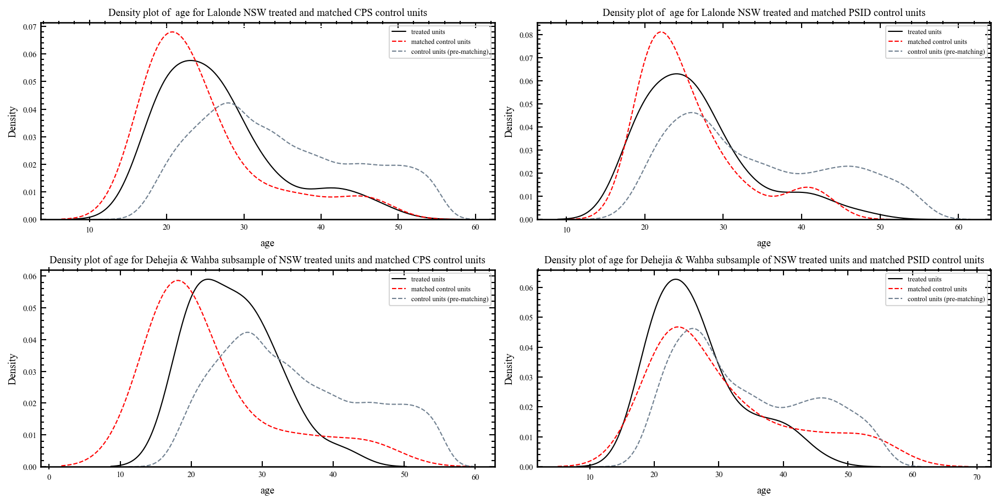

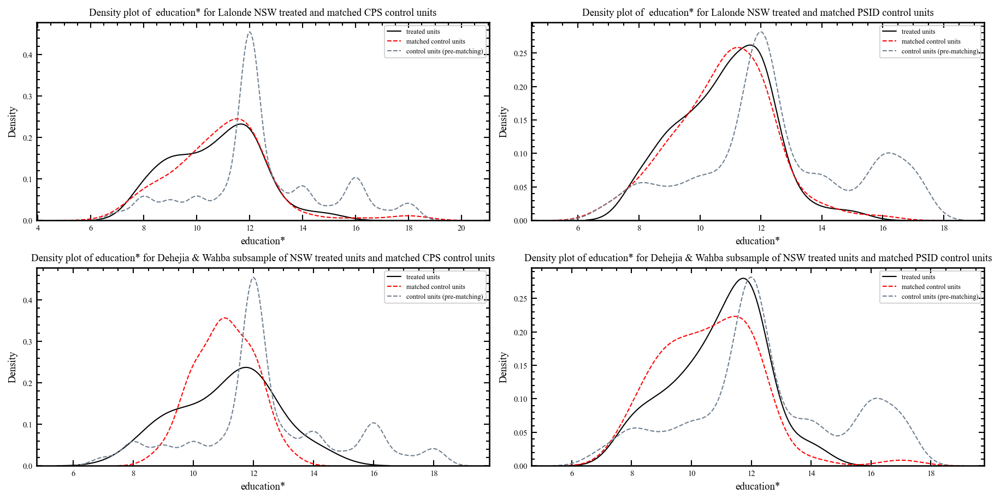

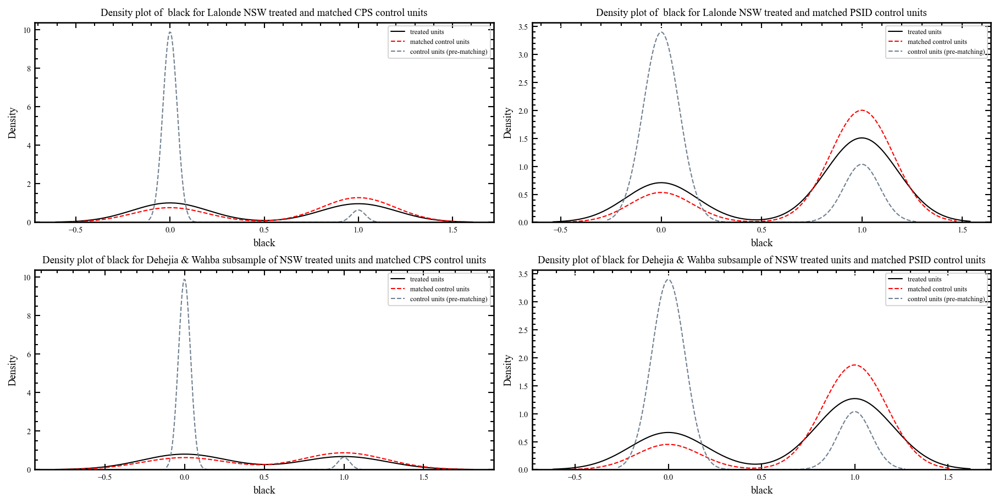

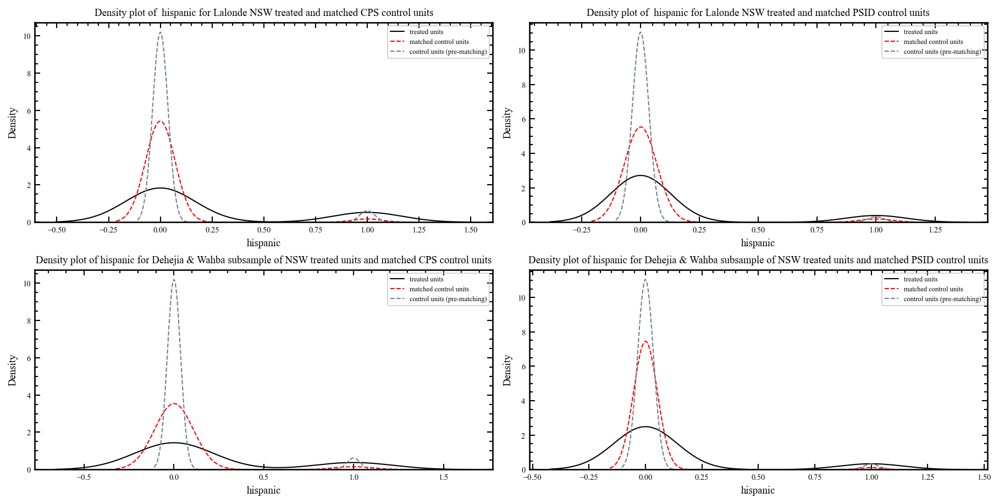

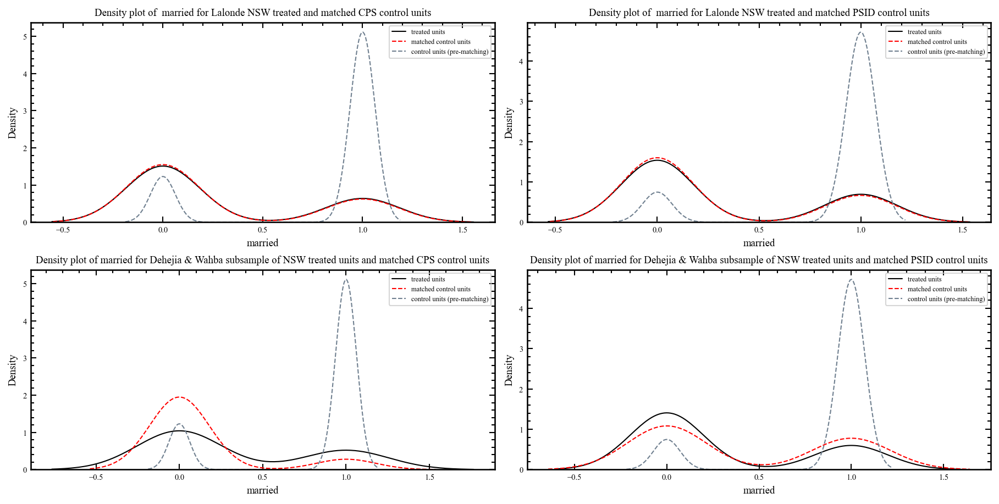

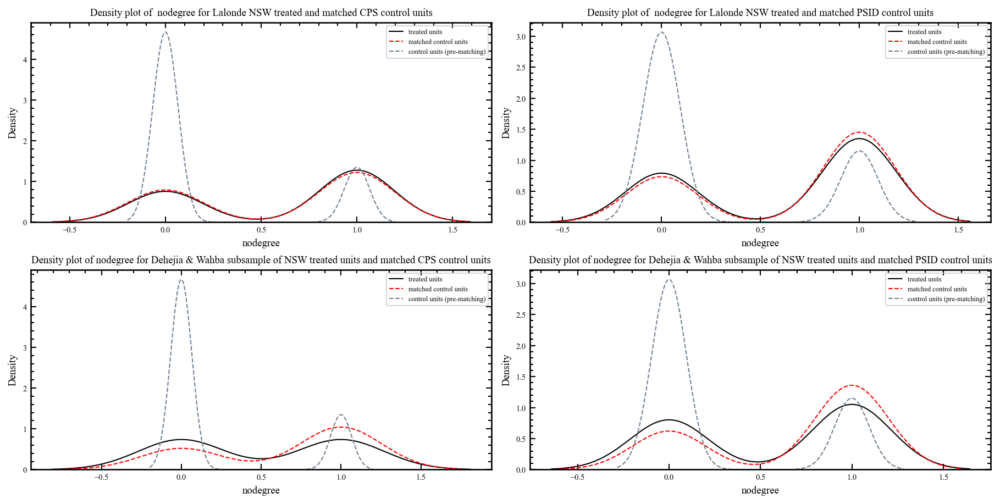

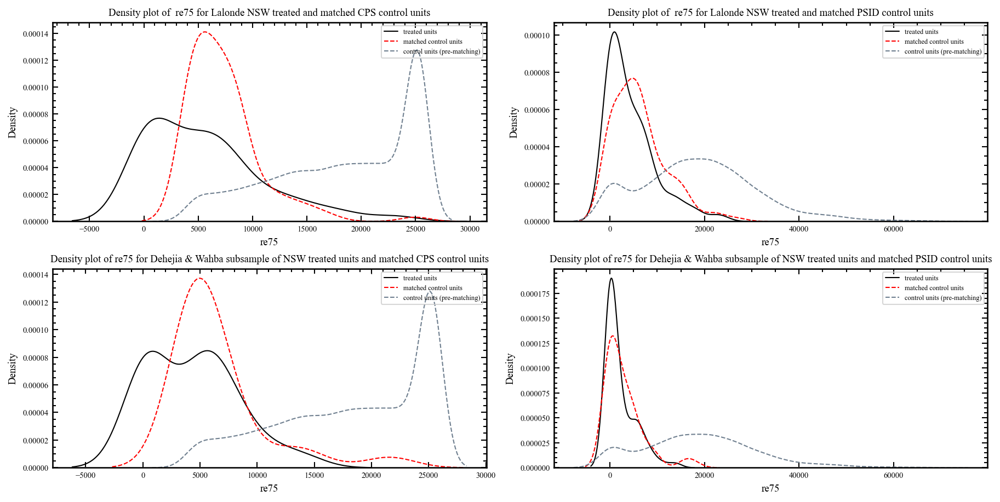

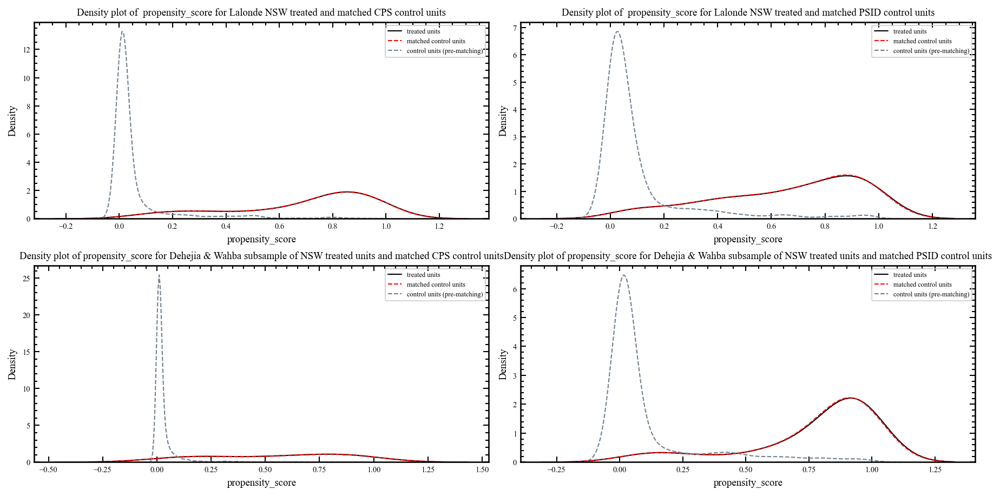

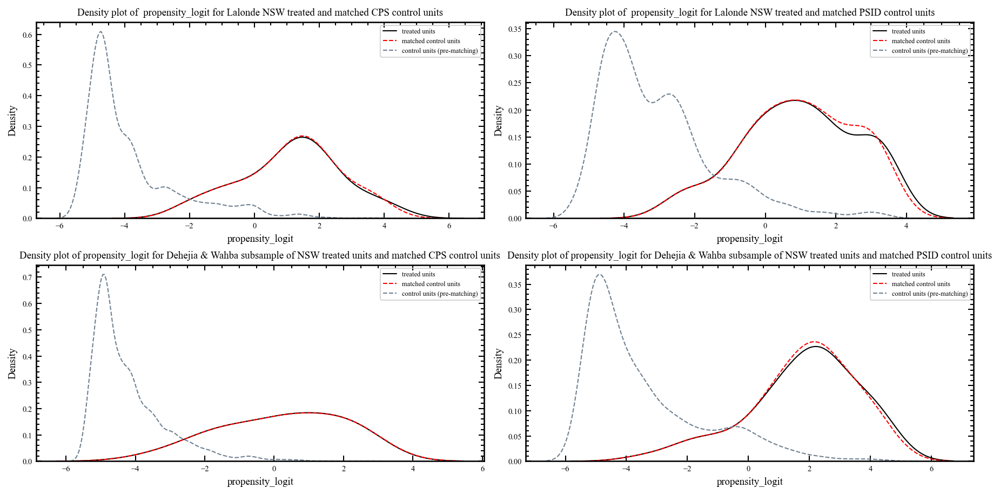

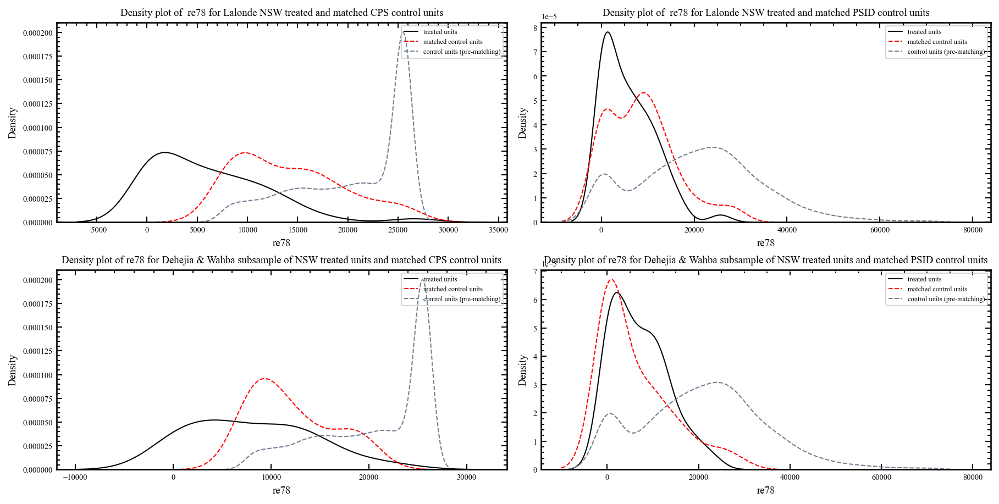

In [183]:
for i in nswCps_lalonde_BOOST_psMatched.columns[1:len(nswCps_lalonde_BOOST_psMatched)]:
    plot_matching_distributions(
                            i,nswCps_lalonde_BOOST_psMatched,nswCps_lalonde_ps_BOOST_withRe78,
                            nswPsid_lalonde_BOOST_psMatched,nswPsid_lalonde_ps_BOOST_withRe78,
                            nswCps_dehWab_BOOST_psMatched,nswCps_dehWab_ps_BOOST_withRe78,
                            nswPsid_dehWab_BOOST_psMatched,nswPsid_dehWab_ps_BOOST_withRe78,'BOOST'f'{i}''_BOOST'
                            )

In [184]:
df_list_adjusted = [nswCps_lalonde_BOOST_psMatched,nswPsid_lalonde_BOOST_psMatched,
                    nswCps_dehWab_BOOST_psMatched,nswPsid_dehWab_BOOST_psMatched]

df_list_unadjusted = [nswCps_lalonde_ps_BOOST_withRe78,nswPsid_lalonde_ps_BOOST_withRe78,
                      nswCps_dehWab_ps_BOOST_withRe78,nswPsid_dehWab_ps_BOOST_withRe78]                

In [185]:
mean_differnces = []
for i, j in zip(df_list_adjusted, df_list_unadjusted):
  mean_differnces.append(mean_difference_df(i,j)) 

### model (5) - artifical neural network

In [1]:
# Import libraries 
import torch
from torch import nn
import torch.optim as optim
from torch.utils.data import  DataLoader,SubsetRandomSampler 
from sklearn.preprocessing import StandardScaler , MinMaxScaler
from sklearn.model_selection import GridSearchCV
# Import standard libraries 
import warnings
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import datasets
import random 
import numpy.random as rand
from random import randrange
import seaborn as sns
from scipy import stats 
from psmpy.functions import cohenD
from psmpy.plotting import *
from imblearn.over_sampling import SMOTE 
from imblearn.combine import SMOTEENN


/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
resample=SMOTEENN(random_state=0)
sm = SMOTE(random_state=0)

In [3]:
# Load quasi-experimental dataset

nswCps_lalonde =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_lalonde.csv')
nswPsid_lalonde = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_lalonde.csv')
nswCps_dehWab =   pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswCps_dehWab.csv')
nswPsid_dehWab =  pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/unmatched data/Quasi_NswPsid_dehWab.csv')

nswCps_lalonde.columns = nswCps_lalonde.columns.str.strip() 
nswPsid_lalonde.columns = nswPsid_lalonde.columns.str.strip() 
nswCps_dehWab.columns = nswCps_dehWab.columns.str.strip() 
nswPsid_dehWab.columns = nswPsid_dehWab.columns.str.strip() 

# Store outcome variable prior to modelling
nswCps_lalonde_re78 = nswCps_lalonde.re78
nswPsid_lalonde_re78 = nswPsid_lalonde.re78
nswCps_dehWab_re78 = nswCps_dehWab.re78
nswPsid_dehWab_re78 = nswPsid_dehWab.re78

In [4]:
# ANN data pre-processing
# Select covariates 
# ======== Lalonde (1986) data ======== #

LALONDE_subset = ['treat','age','black','hispanic','married','nodegree','lnre75','education_8', 'education_9','education_10', 'education_11', 'education_12', 'education_13',
                  'education_14', 'education_15', 'education_16', 'education_17']

LALONDE_subset2 = ['treat','ageboxcox','black','hispanic','married','nodegree','lnre75','education_8', 'education_9','education_10', 'education_11', 'education_12', 'education_13',
                  'education_14', 'education_15', 'education_16', 'education_17']  

LALONDE_subset3 = ['treat','age','education*','black','hispanic','married','nodegree','lnre75']                   


nswCps_lalonde_subset = nswCps_lalonde[LALONDE_subset2]
nswPsid_lalonde_subset = nswPsid_lalonde[LALONDE_subset2]

# Z-score normalise continous variables
sc = StandardScaler()
nsw_continuos_vars = ['ageboxcox','lnre75'] 

nswCps_lalonde_subset[nsw_continuos_vars] = sc.fit_transform(nswCps_lalonde_subset[nsw_continuos_vars])
nswPsid_lalonde_subset[nsw_continuos_vars] = sc.fit_transform(nswPsid_lalonde_subset[nsw_continuos_vars])

nswCps_lalonde_subset = nswCps_lalonde_subset.sample(frac=1).reset_index(drop=True)
nswPsid_lalonde_subset = nswPsid_lalonde_subset.sample(frac=1).reset_index(drop=True)

# Create targets and featues
nswCps_lalonde_target = nswCps_lalonde_subset['treat']
nswCps_lalonde_features = nswCps_lalonde_subset.drop('treat', axis=1)
nswPsid_lalonde_target = nswPsid_lalonde_subset['treat']
nswPsid_lalonde_features = nswPsid_lalonde_subset.drop('treat', axis=1)

# ======== Dehejia & Wahba (1986) sub sample ======== #

DW_subset = ['treat','age','black','hispanic','married','nodegree','lnre74','lnre75','education_8', 'education_9','education_10', 'education_11', 'education_12', 
              'education_13', 'education_14', 'education_15', 'education_16', 'education_17']

DW_subset2 = ['treat','ageboxcox','black','hispanic','married','nodegree','lnre74','lnre75','education_8', 'education_9','education_10', 'education_11', 'education_12', 
              'education_13', 'education_14', 'education_15', 'education_16', 'education_17']

DW_subset3 = ['treat','age','black','hispanic','married','nodegree','lnre74','lnre75','education*']

nswCps_dehWab_subset = nswCps_dehWab[DW_subset2]
nswPsid_dehWab_subset = nswPsid_dehWab[DW_subset2]

nswre74_continuos_vars = ['ageboxcox','lnre74','lnre75',] 

nswCps_dehWab_subset[nswre74_continuos_vars] = sc.fit_transform(nswCps_dehWab_subset[nswre74_continuos_vars])
nswPsid_dehWab_subset[nswre74_continuos_vars] = sc.fit_transform(nswPsid_dehWab_subset[nswre74_continuos_vars])

nswCps_dehWab_subset = nswCps_dehWab_subset.sample(frac=1).reset_index(drop=True)
nswPsid_dehWab_subset = nswPsid_dehWab_subset.sample(frac=1).reset_index(drop=True)

# create targets and features 
nswCps_dehWab_target = nswCps_dehWab_subset['treat']
nswCps_dehWab_features = nswCps_dehWab_subset.drop('treat', axis=1)
nswPsid_dehWab_target = nswPsid_dehWab_subset['treat']
nswPsid_dehWab_features = nswPsid_dehWab_subset.drop('treat', axis=1)



/var/folders/sp/c9zy568j6s94zqs20ynd8pz00000gn/T/ipykernel_95793/2938872810.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nswCps_lalonde_subset[nsw_continuos_vars] = sc.fit_transform(nswCps_lalonde_subset[nsw_continuos_vars])
/var/folders/sp/c9zy568j6s94zqs20ynd8pz00000gn/T/ipykernel_95793/2938872810.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nswPsid_lalonde_subset[nsw_continuos_vars] = sc.fit_transform(nswPsid_lalonde_subset[nsw_continuos_vars])
/var/folders/sp/c9zy568j6s94zqs20ynd8pz00000

### Inference

<p> Neural network </p>

In [5]:
# ANN model 

# NN for Lalone, 7 input features
class twoLayerNN1(nn.Module):
    def __init__(self,num_features = nswPsid_lalonde_features.shape[1], num_classes=1, num_hidden_1=12, num_hidden_2=12):
       
       
        super(twoLayerNN1, self).__init__() 
       
        self.input_layer =  nn.Linear(num_features,num_hidden_1)                        
        self.hidden_layer1 = nn.Linear(num_hidden_1,num_hidden_2)                          
        self.out_layer =  nn.Linear(num_hidden_2, num_classes) 

        # Activation function
        self.relu_activation = nn.ReLU()    
        self.output_activation = nn.Sigmoid()
        #Drop out and batch normalisation 
        self.dropout = nn.Dropout(p=0.3)
        self.batchnorm1 = nn.BatchNorm1d(num_hidden_1)
        self.batchnorm2 = nn.BatchNorm1d(num_hidden_2)
        
    # Forward propogation method
    def forward(self, X, **kwargs):
        X = self.relu_activation(self.input_layer(X))
        X = self.batchnorm1(X)
        X = self.relu_activation(self.hidden_layer1(X))
        X = self.batchnorm2(X)
        X = self.dropout(X)
        X = self.output_activation(self.out_layer(X))
        return X


class twoLayerNN2(nn.Module):
    def __init__(self,num_features = nswPsid_dehWab_features.shape[1], num_classes=1, num_hidden_1=12, num_hidden_2=12):
       
        super(twoLayerNN2, self).__init__() 
       
        self.input_layer =  nn.Linear(num_features,num_hidden_1)                        
        self.hidden_layer1 = nn.Linear(num_hidden_1,num_hidden_2)                          
        self.out_layer =  nn.Linear(num_hidden_2, num_classes) 

        # Activation function
        self.relu_activation = nn.ReLU()    
        self.output_activation = nn.Sigmoid()
        #Drop out and batch normalisation 
        self.dropout = nn.Dropout(p=0.35)
        self.batchnorm1 = nn.BatchNorm1d(num_hidden_1)
        self.batchnorm2 = nn.BatchNorm1d(num_hidden_2)
        
    # Forward propogation method
    def forward(self, X, **kwargs):
        X = self.relu_activation(self.input_layer(X))
        X = self.batchnorm1(X)
        X = self.relu_activation(self.hidden_layer1(X))
        X = self.batchnorm2(X)
        X = self.dropout(X)
        X = self.output_activation(self.out_layer(X))
        return X       


### Model validation

In [6]:
from skorch import NeuralNetClassifier
ANN = NeuralNetClassifier(twoLayerNN1,
                          max_epochs=100,lr=0.1,
                          optimizer = optim.Adam,
                          criterion = nn.BCELoss,
                        
                          )

ANN1_params = {

    'lr': [0.001,0.005, 0.01, 0.05, 0.1],
    'max_epochs': [100],
    'batch_size':[32,64,512],
    #'module__num_features':[17],
    'module__num_hidden_1':[5,15,100],
    'module__num_hidden_2':[5,15,100],
   'optimizer__weight_decay':[0.2,0.1,0.01,0.001]
}

ANN_params = {
    'classification__lr': [0.001,0.005, 0.01, 0.05, 0.1],
    'classification__max_epochs': [50],
    'classification__batch_size':[64,512],
}

In [7]:

Epochs = 100
learning_rate = 0.0001
weight_decay = 0.05
batch_size = 256
ANN1 = NeuralNetClassifier(twoLayerNN1,max_epochs=Epochs,lr=learning_rate,optimizer__weight_decay=weight_decay,batch_size =batch_size,optimizer = optim.Adam,criterion = nn.BCELoss,iterator_valid__shuffle=False)
ANN2 = NeuralNetClassifier(twoLayerNN1,max_epochs=Epochs,lr=learning_rate,optimizer__weight_decay=weight_decay,batch_size = batch_size,optimizer = optim.Adam,criterion = nn.BCELoss,iterator_valid__shuffle=False )
ANN3 = NeuralNetClassifier(twoLayerNN2,max_epochs=Epochs,lr=learning_rate,optimizer__weight_decay=weight_decay,batch_size = batch_size,optimizer = optim.Adam,criterion = nn.BCELoss,iterator_valid__shuffle=False )
ANN4 = NeuralNetClassifier(twoLayerNN2,max_epochs=Epochs,lr=learning_rate,optimizer__weight_decay=weight_decay,batch_size = batch_size,optimizer = optim.Adam,criterion = nn.BCELoss,iterator_valid__shuffle=False  )
                                                  
                        
                          


In [105]:
# Preliminary grid search to get parameters as a baseline
# dataframes to store resutls 
ANN1_metrics = pd.DataFrame()
ANN2_metrics = pd.DataFrame()
ANN3_metrics = pd.DataFrame()
ANN4_metrics = pd.DataFrame()
#models 
from imblearn.pipeline import Pipeline
from imblearn.combine import SMOTEENN


#grid_search_ANN1 = GridSearchCV(ANN, ANN1_params, verbose=1, cv=3,scoring = 'roc_auc',)
#grid_search_ANN2 = GridSearchCV(ANN, ANN_params, verbose=1, cv=3,scoring = 'roc_auc',)
#grid_search_ANN3 = GridSearchCV(ANN, ANN_params, verbose=1, cv=3,scoring = 'roc_auc',)
#grid_search_ANN3 = GridSearchCV(ANN, ANN_params, verbose=1, cv=3,scoring = 'roc_auc',)
#print(grid_search_ANN1.best_score_, grid_search_ANN1.best_params_)

#X = nswPsid_dehWab_features.to_numpy()
#Y = nswPsid_dehWab_target.to_numpy()
#X = X.astype(np.float32)
#Y = Y.astype(np.float32)
#Y = np.reshape(Y,(Y.shape[0],1))
#grid_search_ANN1.best_params_
#grid_search_ANN1.fit(X,Y)


In [11]:
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score
from sklearn import metrics

# KFold cross validation 
def kfold_evaluation_ANN(input_model,features,target,store):
	# prepare the cross-validation procedure
	skf = StratifiedKFold(n_splits=5, shuffle=True,random_state=1)
	
	#Function to get model scores	
	def get_score(model,X_train , X_test, y_train , y_test,fold,store):
		model.fit(X_train,y_train)
		prediction = model.predict(X_test)
		store.loc['Accuracy:', fold] = metrics.balanced_accuracy_score(y_test, prediction)
		store.loc['Precision:', fold] = metrics.precision_score(y_test, prediction)
		store.loc['Recall:', fold] = metrics.recall_score(y_test, prediction)
		store.loc['MSE:', fold] =  metrics.mean_squared_error(y_test, prediction)
		store.loc['MAE:', fold] =  metrics.mean_absolute_error(y_test, prediction)
		store.loc['R^2:', fold] =  metrics.r2_score(y_test, prediction)
		store.loc['logloss:', fold] =  metrics.log_loss(y_test, prediction)
		store.loc['roc_auc:', fold] =  metrics.roc_auc_score(y_test, prediction)
		store.loc['F1:', fold] =  metrics.f1_score(y_test, prediction)
		store.loc['Kappa:', fold] = metrics.cohen_kappa_score(y_test, prediction)
	
	#Kfold training loop
	for fold, (train_index , test_index) in enumerate(skf.split(features,target)):
		#print("TRAIN:", train_index, "TEST:", test_index)

		X_train , X_test, y_train , y_test = features[train_index],features[test_index],\
												target[train_index] , target[test_index]
		
		print('Xtrain pre augmentation:',X_train.shape)
		print('Ytrain pre augmentation',y_train.shape) 

		X_train, y_train = resample.fit_resample(X_train, y_train)	
		shuffled = pd.concat([pd.DataFrame(X_train),pd.DataFrame(y_train)],axis=1).sample(frac=1).reset_index(drop=True)
        #resplit into test and train 
		X_train, y_train = shuffled.iloc[:,:-1], shuffled.iloc[:,-1]
		X_train = X_train.to_numpy()
		y_train = y_train.to_numpy()
		X_train = X_train.astype(np.float32)
		y_train = y_train.astype(np.float32)
		y_train = np.reshape(y_train,(y_train.shape[0],1))

		print('Xtrain:',X_train.shape)
		print('Ytrain',y_train.shape)	
		print('Xtest',X_test.shape)	
		print('Ytest',y_test.shape)	
									 
		get_score(input_model,X_train , X_test, y_train , y_test,fold,store)
		# return statement here with python dataframe of metrics 


### Training and Validation

In [14]:
# Conver features and targets to numpy arrays then floats to feed to ANN
X1 = nswCps_lalonde_features.to_numpy()
Y1 = nswCps_lalonde_target.to_numpy()
X1 = X1.astype(np.float32)
Y1 = Y1.astype(np.float32)
Y1 = np.reshape(Y1,(Y1.shape[0],1))
# ~ ~ ~
X2 = nswPsid_lalonde_features.to_numpy()
Y2 = nswPsid_lalonde_target.to_numpy()
X2 = X2.astype(np.float32)
Y2 = Y2.astype(np.float32)
Y2 = np.reshape(Y2,(Y2.shape[0],1))
# ~ ~ ~
X3 = nswCps_dehWab_features.to_numpy()
Y3 = nswCps_dehWab_target.to_numpy()
X3 = X3.astype(np.float32)
Y3 = Y3.astype(np.float32)
Y3 = np.reshape(Y3,(Y3.shape[0],1))
# ~ ~ ~
X4 = nswPsid_dehWab_features.to_numpy()
Y4 = nswPsid_dehWab_target.to_numpy()
X4 = X4.astype(np.float32)
Y4 = Y4.astype(np.float32)
Y4 = np.reshape(Y4,(Y4.shape[0],1))

In [13]:
# Training on a single datapoint
from sklearn.model_selection import train_test_split
#metrics.cohen_kappa_score(y_test, prediction)
t = Y1 == 1
treated_index = [ i for i, x in enumerate(t) if x]


X_train, X_test, y_train, y_test = train_test_split(X1, Y1, test_size=0.3, shuffle=True)
X_train, y_train = resample.fit_resample(X_train, y_train)
shuffled = pd.concat([pd.DataFrame(X_train),pd.DataFrame(y_train)],axis=1).sample(frac=1).reset_index(drop=True)
#resplit into test and train 
X_train, y_train = shuffled.iloc[:,:-1], shuffled.iloc[:,-1]
X_train = X_train.to_numpy()
y_train = y_train.to_numpy()
X_train = X_train.astype(np.float32)
y_train = y_train.astype(np.float32)
y_train = np.reshape(y_train,(y_train.shape[0],1))


In [109]:
#grid_search_ANN1 = GridSearchCV(ANN1, ANN1_params, verbose=1, cv=3,scoring = 'accuracy')
ANN1.fit(X_train,y_train)

#ANN1.fit(X_train,y_train)

  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7505       0.4987        0.7197  0.3045
      2        0.7145       0.4987        0.6803  0.1955
      3        0.6833       0.4987        0.6467  0.2292
      4        0.6475       0.4987        0.6146  0.1775
      5        0.6152       0.4987        0.5823  0.2169
      6        0.5813       0.4987        0.5498  0.1807
      7        0.5504       0.4987        0.5168  0.1827
      8        0.5139       0.4987        0.4822  0.1770
      9        0.4790       0.4987        0.4482  0.1775
     10        0.4468       0.4987        0.4203  0.1778
     11        0.4211       0.4987        0.3978  0.1833
     12        0.4004       0.4987        0.3788  0.2113
     13        0.3819       0.4987        0.3625  0.1932
     14        0.3652       0.4987        0.3480  0.3428
     15        0.3502       0.4987        0.3347  0.1987
     16        0.3385       0.4

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=twoLayerNN1(
    (input_layer): Linear(in_features=16, out_features=12, bias=True)
    (hidden_layer1): Linear(in_features=12, out_features=12, bias=True)
    (out_layer): Linear(in_features=12, out_features=1, bias=True)
    (relu_activation): ReLU()
    (output_activation): Sigmoid()
    (dropout): Dropout(p=0.3, inplace=False)
    (batchnorm1): BatchNorm1d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (batchnorm2): BatchNorm1d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  ),
)

In [113]:
pred = ANN1.predict_proba(X_test)

y_pred = (ANN1.predict_proba(X_test) >= 0.5).astype(bool)
#metrics.accuracy_score(y_test, pred)
pred

array([[0.05998723],
       [0.04151234],
       [0.03570944],
       ...,
       [0.04241889],
       [0.05657206],
       [0.03829157]], dtype=float32)

In [117]:
t = y_pred == 1
treated_index = [ i for i, x in enumerate(t) if x]
treated_index

[19,
 69,
 89,
 103,
 107,
 114,
 125,
 165,
 166,
 175,
 180,
 250,
 258,
 279,
 300,
 355,
 366,
 369,
 371,
 377,
 411,
 413,
 501,
 523,
 541,
 576,
 577,
 591,
 605,
 635,
 637,
 658,
 678,
 711,
 762,
 765,
 818,
 875,
 878,
 884,
 885,
 931,
 993,
 1000,
 1055,
 1076,
 1095,
 1137,
 1193,
 1202,
 1217,
 1250,
 1259,
 1312,
 1360,
 1361,
 1375,
 1396,
 1400,
 1420,
 1432,
 1446,
 1485,
 1527,
 1533,
 1569,
 1574,
 1618,
 1639,
 1685,
 1688,
 1696,
 1706,
 1724,
 1800,
 1809,
 1827,
 1832,
 1842,
 1843,
 1917,
 1919,
 1920,
 1926,
 1932,
 1960,
 1987,
 1994,
 2009,
 2012,
 2060,
 2080,
 2087,
 2143,
 2165,
 2213,
 2237,
 2242,
 2250,
 2262,
 2302,
 2317,
 2319,
 2341,
 2387,
 2412,
 2419,
 2429,
 2431,
 2441,
 2462,
 2476,
 2483,
 2498,
 2526,
 2532,
 2548,
 2551,
 2578,
 2589,
 2647,
 2654,
 2663,
 2694,
 2715,
 2720,
 2726,
 2805,
 2826,
 2838,
 2840,
 2876,
 2882,
 2896,
 2901,
 2907,
 2934,
 2935,
 3008,
 3010,
 3015]

In [115]:
pred = ANN1.predict(X_test)
metrics.accuracy_score(y_test, pred)



0.9730794484569928

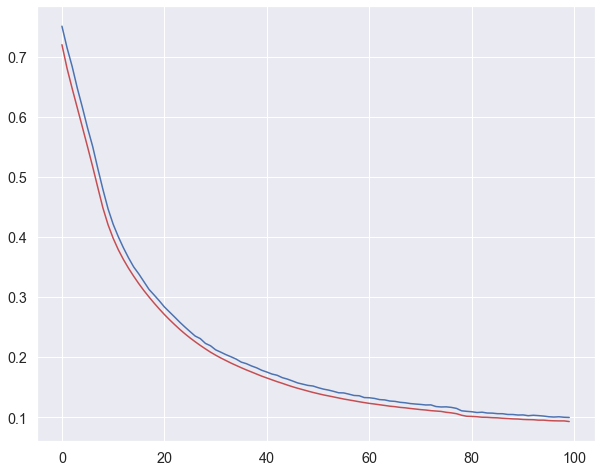

In [118]:
from turtle import color
history = ANN1.history
tloss = history[:, 'train_loss']
vloss = history[:, 'valid_loss']
plt.plot(tloss, '-',color='b',label='training')
plt.plot(vloss, '-',color='r', label='validation')

In [15]:
# ANN 1  - Lalonde CPS 
# takes apx 7 minutes
ANN1_metrics = pd.DataFrame()
ANN2_metrics = pd.DataFrame()
ANN3_metrics = pd.DataFrame()
ANN4_metrics = pd.DataFrame()

kfold_evaluation_ANN(ANN1,X1,Y1,ANN1_metrics)
kfold_evaluation_ANN(ANN2,X2,Y2,ANN2_metrics)
kfold_evaluation_ANN(ANN3,X3,Y3,ANN3_metrics)
kfold_evaluation_ANN(ANN4,X4,Y4,ANN4_metrics)


Xtrain pre augmentation: (8122, 16)
Ytrain pre augmentation (8122, 1)
Xtrain: (15583, 16)
Ytrain (15583, 1)
Xtest (2031, 16)
Ytest (2031, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6165       0.4982        0.5910  0.3489
      2        0.5776       0.4982        0.5431  0.2947
      3        0.5431       0.4982        0.5080  0.2720
      4        0.5114       0.4982        0.4755  0.2673
      5        0.4815       0.4982        0.4468  0.2721
      6        0.4548       0.4982        0.4214  0.2549
      7        0.4300       0.4982        0.3988  0.2792
      8        0.4083       0.4982        0.3787  0.2271
      9        0.3871       0.4982        0.3607  0.3185
     10        0.3730       0.4982        0.3438  0.2917
     11        0.3548       0.4982        0.3283  0.2372
     12        0.3408       0.4982      

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (15572, 16)
Ytrain (15572, 1)
Xtest (2031, 16)
Ytest (2031, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6212       0.4979        0.5779  0.3245
      2        0.5548       0.4979        0.5130  0.3258
      3        0.5003       0.4979        0.4682  0.3394
      4        0.4624       0.4979        0.4291  0.4147
      5        0.4264       0.4979        0.3955  0.2827
      6        0.3941       0.4979        0.3676  0.2728
      7        0.3695       0.4979        0.3441  0.2668
      8        0.3452       0.4979        0.3244  0.2719
      9        0.3281       0.4979        0.3073  0.2929
     10        0.3142       0.4979        0.2921  0.3561
     11        0.2949       0.4979        0.2787  0.3320
     12        0.2847       0.4979        0.2668  0.3283
     13        0.2748       0.4979        0.2560  0.3

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (15660, 16)
Ytrain (15660, 1)
Xtest (2031, 16)
Ytest (2031, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.9606       0.4981        0.8510  0.2952
      2        0.8840       0.4981        0.8440  0.2597
      3        0.8248       0.4981        0.7858  0.2527
      4        0.7567       0.4981        0.7092  0.2517
      5        0.6864       0.4981        0.6430  0.2605
      6        0.6308       0.4981        0.5974  0.3008
      7        0.5955       0.4981        0.5598  0.2689
      8        0.5639       0.4981        0.5255  0.2784
      9        0.5258       0.4981        0.4905  0.2937
     10        0.4918       0.4981        0.4550  0.2592
     11        0.4580       0.4981        0.4215  0.2662
     12        0.4292       0.4981        0.3951  0.2415
     13        0.4074       0.4981        0.3735  0.2

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (15540, 16)
Ytrain (15540, 1)
Xtest (2030, 16)
Ytest (2030, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.9022       0.4987        0.8290  0.2247
      2        0.8466       0.4987        0.7947  0.2450
      3        0.7877       0.4987        0.7450  0.2355
      4        0.7395       0.4987        0.6992  0.2588
      5        0.6978       0.4987        0.6577  0.2335
      6        0.6551       0.4987        0.6185  0.2976
      7        0.6157       0.4987        0.5789  0.3261
      8        0.5799       0.4987        0.5409  0.2620
      9        0.5425       0.4987        0.5088  0.2546
     10        0.5144       0.4987        0.4834  0.2685
     11        0.4912       0.4987        0.4615  0.2691
     12        0.4676       0.4987        0.4405  0.2432
     13        0.4484       0.4987        0.4208  0.2

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (15559, 16)
Ytrain (15559, 1)
Xtest (2030, 16)
Ytest (2030, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6148       0.4981        0.5736  0.5338
      2        0.5662       0.4981        0.5262  0.3281
      3        0.5274       0.4981        0.4915  0.3234
      4        0.4940       0.4981        0.4614  0.2940
      5        0.4626       0.4981        0.4334  0.2568
      6        0.4352       0.4981        0.4077  0.2610
      7        0.4118       0.4981        0.3853  0.2600
      8        0.3890       0.4981        0.3655  0.2621
      9        0.3715       0.4981        0.3475  0.3418
     10        0.3529       0.4981        0.3309  0.3345
     11        0.3359       0.4981        0.3153  0.3500
     12        0.3231       0.4981        0.3013  0.3146
     13        0.3082       0.4981        0.2889  0.3

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3391, 16)
Ytrain (3391, 1)
Xtest (520, 16)
Ytest (520, 1)
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6671       0.5037        0.6589  0.0522
      2        0.6576       0.5037        0.6291  0.0672
      3        0.6437       0.5037        0.6111  0.0713
      4        0.6335       0.5037        0.6037  0.0624
      5        0.6205       0.5037        0.5968  0.0642
      6        0.6079       0.5037        0.5863  0.0622
      7        0.6059       0.5037        0.5751  0.0769
      8        0.6003       0.5037        0.5647  0.0634
      9        0.5780       0.5037        0.5551  0.0700
     10        0.5724       0.5037        0.5461  0.0681
     11        0.5601       0.5037        0.5373  0.0653
     12        0.5555       0.5037        0.5290  0.0651
     13        0.5478       0.5037        0.5209  0.0643
     14        0.5353       0.5037        0.5130  0.0641
     15        0.5302

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3361, 16)
Ytrain (3361, 1)
Xtest (519, 16)
Ytest (519, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6478       0.5007        0.6526  0.0518
      2        0.6327       0.5007        0.6212  0.0619
      3        0.6207       0.5007        0.6030  0.0678
      4        0.6135       0.5007        0.5906  0.0606
      5        0.6078       0.5007        0.5787  0.0643
      6        0.5982       0.5007        0.5672  0.0640
      7        0.5950       0.5007        0.5572  0.0652
      8        0.5819       0.5007        0.5481  0.0652
      9        0.5717       0.5007        0.5395  0.0622
     10        0.5570       0.5007        0.5312  0.0627
     11        0.5576       0.5007        0.5230  0.0636
     12        0.5509       0.5007        0.5150  0.0663
     13        0.5412       0.5007        0.5070  0.0635


/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3399, 16)
Ytrain (3399, 1)
Xtest (519, 16)
Ytest (519, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7255       0.4985        0.6909  0.0527
      2        0.7090       0.4985        0.6828  0.0673
      3        0.7003       0.4985        0.6636  0.0683
      4        0.6848       0.4985        0.6460  0.0683
      5        0.6756       0.4985        0.6357  0.0641
      6        0.6725       0.4985        0.6302  0.0716
      7        0.6626       0.4985        0.6242  0.0638
      8        0.6447       0.4985        0.6168  0.0652
      9        0.6433       0.4985        0.6086  0.0664
     10        0.6307       0.4985        0.6002  0.0660
     11        0.6204       0.4985        0.5919  0.0672
     12        0.6199       0.4985        0.5837  0.0693
     13        0.6048       0.4985        0.5756  0.0679


/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3359, 16)
Ytrain (3359, 1)
Xtest (519, 16)
Ytest (519, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.4896       0.5015        0.6333  0.0552
      2        0.4839       0.5015        0.5811  0.0635
      3        0.4700       0.5015        0.5312  0.0641
      4        0.4601       0.5015        0.4886  0.0644
      5        0.4554       0.5015        0.4598  0.0653
      6        0.4469       0.5015        0.4433  0.0652
      7        0.4353       0.5015        0.4329  0.0651
      8        0.4338       0.5015        0.4248  0.0635
      9        0.4283       0.5015        0.4175  0.0627
     10        0.4181       0.5015        0.4106  0.1620
     11        0.4119       0.5015        0.4038  0.0668
     12        0.4029       0.5015        0.3971  0.0623
     13        0.3926       0.5015        0.3904  0.0625


/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3360, 16)
Ytrain (3360, 1)
Xtest (519, 16)
Ytest (519, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.8051       0.4985        0.6884  0.0519
      2        0.7945       0.4985        0.6859  0.0663
      3        0.7678       0.4985        0.6876  0.0649
      4        0.7630       0.4985        0.6991  0.0648
      5        0.7403       0.4985        0.7073  0.0626
      6        0.7259       0.4985        0.7061  0.0629
      7        0.7162       0.4985        0.6984  0.0616
      8        0.6970       0.4985        0.6884  0.0677
      9        0.6866       0.4985        0.6775  0.0610
     10        0.6785       0.4985        0.6670  0.0627
     11        0.6679       0.4985        0.6566  0.0633
     12        0.6609       0.4985        0.6464  0.0642
     13        0.6532       0.4985        0.6365  0.0650


/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain pre augmentation: (8034, 17)
Ytrain pre augmentation (8034, 1)
Xtrain: (15750, 17)
Ytrain (15750, 1)
Xtest (2009, 17)
Ytest (2009, 1)
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.8051       0.4987        0.7411  0.4622
      2        0.7387       0.4987        0.6878  0.5208
      3        0.6660       0.4987        0.6186  0.3398
      4        0.6095       0.4987        0.5739  0.4010
      5        0.5681       0.4987        0.5349  0.3470
      6        0.5324       0.4987        0.5003  0.3496
      7        0.4981       0.4987        0.4701  0.3473
      8        0.4752       0.4987        0.4440  0.3499
      9        0.4504       0.4987        0.4217  0.3315
     10        0.4296       0.4987        0.4020  0.3431
     11        0.4101       0.4987        0.3840  0.3528
     12        0.3934       0.4987        0.3667  0.3544
     13        0.3741       0.4987        0.3489  0.3418
    

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (15744, 17)
Ytrain (15744, 1)
Xtest (2009, 17)
Ytest (2009, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7265       0.4983        0.6775  0.2554
      2        0.6657       0.4983        0.6313  0.2603
      3        0.6128       0.4983        0.5843  0.2471
      4        0.5714       0.4983        0.5472  0.2494
      5        0.5362       0.4983        0.5153  0.2540
      6        0.5073       0.4983        0.4881  0.2546
      7        0.4851       0.4983        0.4647  0.2602
      8        0.4598       0.4983        0.4428  0.2543
      9        0.4407       0.4983        0.4232  0.2521
     10        0.4225       0.4983        0.4045  0.2659
     11        0.4044       0.4983        0.3876  0.2473
     12        0.3893       0.4983        0.3723  0.2768
     13        0.3763       0.4983        0.3579  0.2

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (15758, 17)
Ytrain (15758, 1)
Xtest (2009, 17)
Ytest (2009, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6328       0.4987        0.5886  0.2450
      2        0.5824       0.4987        0.5440  0.2464
      3        0.5343       0.4987        0.4865  0.2410
      4        0.4809       0.4987        0.4472  0.2415
      5        0.4439       0.4987        0.4180  0.2411
      6        0.4151       0.4987        0.3908  0.2378
      7        0.3862       0.4987        0.3648  0.2517
      8        0.3606       0.4987        0.3448  0.2508
      9        0.3455       0.4987        0.3268  0.3855
     10        0.3257       0.4987        0.3094  0.2525
     11        0.3082       0.4987        0.2932  0.2646
     12        0.2948       0.4987        0.2778  0.2565
     13        0.2811       0.4987        0.2641  0.2

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (15760, 17)
Ytrain (15760, 1)
Xtest (2008, 17)
Ytest (2008, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6952       0.4984        0.6557  0.2564
      2        0.6281       0.4984        0.5749  0.2848
      3        0.5718       0.4984        0.5227  0.2633
      4        0.5216       0.4984        0.4786  0.2643
      5        0.4848       0.4984        0.4435  0.2749
      6        0.4502       0.4984        0.4124  0.2552
      7        0.4217       0.4984        0.3832  0.2573
      8        0.3963       0.4984        0.3563  0.2627
      9        0.3686       0.4984        0.3325  0.2619
     10        0.3466       0.4984        0.3117  0.2617
     11        0.3278       0.4984        0.2932  0.2646
     12        0.3078       0.4984        0.2766  0.2603
     13        0.2946       0.4984        0.2616  0.2

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (15737, 17)
Ytrain (15737, 1)
Xtest (2008, 17)
Ytest (2008, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7577       0.4981        0.6986  0.2677
      2        0.6856       0.4981        0.6263  0.2671
      3        0.6313       0.4981        0.5684  0.2471
      4        0.5708       0.4981        0.5191  0.2361
      5        0.5271       0.4981        0.4857  0.2492
      6        0.4941       0.4981        0.4585  0.2409
      7        0.4686       0.4981        0.4334  0.2657
      8        0.4418       0.4981        0.4078  0.2735
      9        0.4143       0.4981        0.3829  0.2403
     10        0.3910       0.4981        0.3593  0.2445
     11        0.3697       0.4981        0.3378  0.2398
     12        0.3464       0.4981        0.3177  0.2423
     13        0.3261       0.4981        0.2987  0.2

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3585, 17)
Ytrain (3585, 1)
Xtest (498, 17)
Ytest (498, 1)
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6736       0.4937        0.6665  0.1365
      2        0.6598       0.4937        0.6408  0.1199
      3        0.6492       0.4937        0.6208  0.0983
      4        0.6417       0.4937        0.6103  0.0857
      5        0.6246       0.4937        0.6028  0.0895
      6        0.6134       0.4937        0.5946  0.0822
      7        0.6038       0.4937        0.5858  0.0858
      8        0.5953       0.4937        0.5769  0.0854
      9        0.5824       0.4937        0.5681  0.0868
     10        0.5731       0.4937        0.5596  0.0866
     11        0.5650       0.4937        0.5515  0.0885
     12        0.5601       0.4937        0.5436  0.0883
     13        0.5527       0.4937        0.5358  0.0835
     14        0.5400       0.4937        0.5282  0.0822
     15        0.5359

/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3584, 17)
Ytrain (3584, 1)
Xtest (497, 17)
Ytest (497, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7315       0.4923        0.6978  0.0591
      2        0.7168       0.4923        0.6895  0.0740
      3        0.7005       0.4923        0.6740  0.0782
      4        0.6904       0.4923        0.6601  0.0720
      5        0.6752       0.4923        0.6495  0.0722
      6        0.6640       0.4923        0.6387  0.0684
      7        0.6519       0.4923        0.6280  0.0735
      8        0.6457       0.4923        0.6175  0.0698
      9        0.6334       0.4923        0.6074  0.0705
     10        0.6302       0.4923        0.5977  0.0727
     11        0.6093       0.4923        0.5886  0.0725
     12        0.6107       0.4923        0.5799  0.0774
     13        0.5926       0.4923        0.5716  0.0737


/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3561, 17)
Ytrain (3561, 1)
Xtest (497, 17)
Ytest (497, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7931       0.4951        0.7050  0.0644
      2        0.7781       0.4951        0.7128  0.0774
      3        0.7677       0.4951        0.7245  0.0731
      4        0.7604       0.4951        0.7294  0.0732
      5        0.7453       0.4951        0.7259  0.0720
      6        0.7352       0.4951        0.7181  0.0738
      7        0.7246       0.4951        0.7090  0.0727
      8        0.7185       0.4951        0.6995  0.0715
      9        0.7052       0.4951        0.6899  0.0754
     10        0.6933       0.4951        0.6802  0.0740
     11        0.6838       0.4951        0.6702  0.0722
     12        0.6746       0.4951        0.6600  0.0724
     13        0.6668       0.4951        0.6497  0.0751


/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3572, 17)
Ytrain (3572, 1)
Xtest (497, 17)
Ytest (497, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6581       0.4923        0.6855  0.0950
      2        0.6546       0.4923        0.6753  0.0763
      3        0.6444       0.4923        0.6586  0.0787
      4        0.6401       0.4923        0.6389  0.1005
      5        0.6291       0.4923        0.6222  0.0770
      6        0.6147       0.4923        0.6102  0.0821
      7        0.6017       0.4923        0.6007  0.0836
      8        0.5997       0.4923        0.5922  0.0809
      9        0.5930       0.4923        0.5842  0.0840
     10        0.5886       0.4923        0.5763  0.1106
     11        0.5776       0.4923        0.5687  0.1035
     12        0.5699       0.4923        0.5611  0.0765
     13        0.5587       0.4923        0.5537  0.0759


/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Xtrain: (3566, 17)
Ytrain (3566, 1)
Xtest (497, 17)
Ytest (497, 1)
Re-initializing module.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7555       0.4944        0.7049  0.0848
      2        0.7348       0.4944        0.7066  0.0975
      3        0.7199       0.4944        0.7025  0.0929
      4        0.7059       0.4944        0.6884  0.0919
      5        0.6943       0.4944        0.6690  0.0902
      6        0.6675       0.4944        0.6492  0.0849
      7        0.6582       0.4944        0.6320  0.0774
      8        0.6393       0.4944        0.6165  0.0782
      9        0.6169       0.4944        0.6019  0.0801
     10        0.6058       0.4944        0.5882  0.0800
     11        0.5901       0.4944        0.5754  0.0802
     12        0.5838       0.4944        0.5635  0.0807
     13        0.5716       0.4944        0.5522  0.0813


/Users/mawuliagamah/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [16]:
ANN1_metrics.loc['RMSE']=np.sqrt(ANN1_metrics.loc["MSE:"])
ANN2_metrics.loc['RMSE']=np.sqrt(ANN2_metrics.loc["MSE:"])
ANN3_metrics.loc['RMSE']=np.sqrt(ANN3_metrics.loc["MSE:"])
ANN4_metrics.loc['RMSE']=np.sqrt(ANN4_metrics.loc["MSE:"])

ANN1_metrics['avg'] = np.mean(ANN1_metrics,axis=1)
ANN2_metrics['avg'] = np.mean(ANN2_metrics,axis=1)
ANN3_metrics['avg'] = np.mean(ANN3_metrics,axis=1)
ANN4_metrics['avg'] = np.mean(ANN4_metrics,axis=1)

In [17]:
ANN1_metrics

,0,1,2,3,4,avg
Accuracy:,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
Precision:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Recall:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MSE:,0.027080,0.027573,0.027573,0.027094,0.027094,0.027283
MAE:,0.027080,0.027573,0.027573,0.027094,0.027094,0.027283
R^2:,-0.027834,-0.028354,-0.028354,-0.027848,-0.027848,-0.028048
logloss:,0.935319,0.952325,0.952325,0.935780,0.935780,0.942306
roc_auc:,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
F1:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Kappa:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


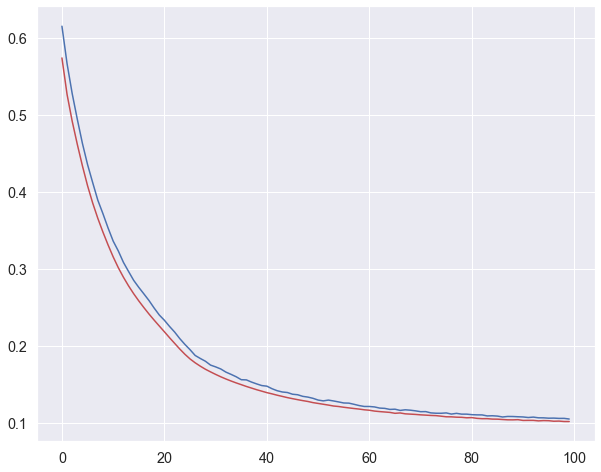

In [18]:
from turtle import color
history = ANN1.history
tloss = history[:, 'train_loss']
vloss = history[:, 'valid_loss']
plt.plot(tloss, '-',color='b',label='training')
plt.plot(vloss, '-',color='r', label='validation')

In [19]:
ANN2_metrics

,0,1,2,3,4,avg
Accuracy:,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
Precision:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Recall:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MSE:,0.107692,0.105973,0.105973,0.105973,0.107900,0.106702
MAE:,0.107692,0.105973,0.105973,0.105973,0.107900,0.106702
R^2:,-0.120690,-0.118534,-0.118534,-0.118534,-0.120950,-0.119449
logloss:,3.719561,3.660179,3.660179,3.660179,3.726727,3.685365
roc_auc:,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
F1:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Kappa:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [20]:
ANN3_metrics

,0,1,2,3,4,avg
Accuracy:,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
Precision:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Recall:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MSE:,0.016426,0.016924,0.016924,0.016434,0.016434,0.016628
MAE:,0.016426,0.016924,0.016924,0.016434,0.016434,0.016628
R^2:,-0.016700,-0.017215,-0.017215,-0.016709,-0.016709,-0.016910
logloss:,0.567337,0.584529,0.584529,0.567619,0.567619,0.574327
roc_auc:,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
F1:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Kappa:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [21]:
ANN4_metrics

,0,1,2,3,4,avg
Accuracy:,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
Precision:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Recall:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MSE:,0.068273,0.066398,0.066398,0.066398,0.068410,0.067176
MAE:,0.068273,0.066398,0.066398,0.066398,0.068410,0.067176
R^2:,-0.073276,-0.071121,-0.071121,-0.071121,-0.073434,-0.072014
logloss:,2.358069,2.293319,2.293319,2.293319,2.362814,2.320168
roc_auc:,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
F1:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Kappa:,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


## Inference

In [45]:


def propensity_score_functANN(dataset,model,dataset2):
    
    dataset2.columns = dataset2.columns.str.strip() 
    if 're74' in dataset2.columns: 
        dataset2 = dataset2[['treat','age','education*','black','hispanic','married','nodegree','re74','re75','re78']]
    else:
        dataset2 = dataset2[['treat','age','education*','black','hispanic','married','nodegree','re75','re78']]

    treat =  dataset.iloc[:,0]
    dataset =  dataset.iloc[:,1:len(dataset)]
    columns = dataset.columns
    dataset = dataset.to_numpy()
    dataset = dataset.astype(np.float32)
    #Y1 = np.reshape(Y1,(Y1.shape[0],1))
    # Generate propensity score prediction  
    probabilities = model.predict_proba(dataset)
    probabilities = pd.DataFrame(probabilities)
    ps = probabilities # propensity score 
    # merge prediction and existing dataset 
    dataset = pd.DataFrame(dataset)
    dataset.columns = columns
    #dataset_proba = pd.merge(dataset, ps, left_index=True, right_index=True)
    dataset_proba = pd.merge(dataset2, ps, left_index=True, right_index=True)
    dataset_proba.rename(index=int, columns={0:'propensity_score'}, inplace = True) # rename column
    dataset_proba['propensity_logit'] = np.log(dataset_proba['propensity_score'] / (1-dataset_proba['propensity_score']))
    return dataset_proba

In [46]:
propensity_score_functANN(nswCps_lalonde_subset,ANN2,nswCps_lalonde) 

,treat,age,education*,black,hispanic,married,nodegree,re75,re78,propensity_score,propensity_logit
0,1.0,37,11,1.0,0.0,1.0,1.0,0,9930,0.212980,-1.307055
1,1.0,22,9,0.0,1.0,0.0,1.0,0,3595,0.145069,-1.773812
2,1.0,30,12,1.0,0.0,0.0,0.0,0,24909,0.138512,-1.827704
3,1.0,27,11,1.0,0.0,0.0,1.0,0,7506,0.183046,-1.495846
4,1.0,33,8,1.0,0.0,0.0,1.0,0,289,0.612441,0.457584
...,...,...,...,...,...,...,...,...,...,...,...
10148,0.0,27,13,0.0,0.0,1.0,0.0,25243,25564,0.240527,-1.149793
10149,0.0,55,9,0.0,0.0,1.0,1.0,25243,21463,0.176818,-1.538058
10150,0.0,48,10,0.0,0.0,1.0,1.0,25243,25564,0.169835,-1.586797
10151,0.0,47,9,0.0,0.0,1.0,1.0,11384,13671,0.124183,-1.953397


In [47]:
# Predict get scores on NSW , CPS and PSID 
# ============ Lalonde Subsample ============ # 
# predict propensity scores
nswCps_lalonde_ps_ANN = propensity_score_functANN(nswCps_lalonde_subset,ANN1,nswCps_lalonde)
nswPsid_lalonde_ps_ANN= propensity_score_functANN(nswPsid_lalonde_subset,ANN2,nswPsid_lalonde)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
#nswCps_lalonde_ps_CART_withRe78 = pd.merge(nswCps_lalonde_ps_CART,nswCps_lalonde_re78,left_index=True, right_index=True)
#nswPsid_lalonde_ps_CART_withRe78 = pd.merge(nswPsid_lalonde_ps_CART,nswPsid_lalonde_re78,left_index=True, right_index=True)
# ============ Dehejia & Wahba sub sample ============ # 
# predict propensity scores
nswCps_dehWab_ps_ANN = propensity_score_functANN(nswCps_dehWab_subset,ANN3,nswCps_dehWab)
nswPsid_dehWab_ps_ANN = propensity_score_functANN(nswPsid_dehWab_subset,ANN4,nswPsid_dehWab)
# Rejoin the original wage covariate to dataframe with estimated propensity scores 
#nswCps_dehWab_ps_CART_withRe78 = pd.merge(nswCps_dehWab_ps_CART,nswCps_dehWab_re78,left_index=True, right_index=True)
#nswPsid_dehWab_ps_CART_withRe78  = pd.merge(nswPsid_dehWab_ps_CART,nswPsid_dehWab_re78,left_index=True, right_index=True)


In [49]:
nswPsid_dehWab_ps_ANN

,treat,age,education*,black,hispanic,married,nodegree,re74,re75,re78,propensity_score,propensity_logit
0,1.0,37,11,1.0,0.0,1.0,1.0,0,0,9930,0.135212,-1.855644
1,1.0,22,9,0.0,1.0,0.0,1.0,0,0,3595,0.191586,-1.439737
2,1.0,30,12,1.0,0.0,0.0,0.0,0,0,24909,0.240979,-1.147322
3,1.0,27,11,1.0,0.0,0.0,1.0,0,0,7506,0.111890,-2.071582
4,1.0,33,8,1.0,0.0,0.0,1.0,0,0,289,0.880548,1.997626
...,...,...,...,...,...,...,...,...,...,...,...,...
2481,0.0,32,10,0.0,0.0,1.0,1.0,43103,39387,36943,0.091945,-2.290117
2482,0.0,47,8,0.0,0.0,1.0,1.0,44667,33837,38568,0.092566,-2.282702
2483,0.0,32,8,0.0,0.0,1.0,1.0,47022,67137,59109,0.191267,-1.441795
2484,0.0,47,10,0.0,0.0,1.0,1.0,48197,47968,55710,0.267164,-1.009062


In [50]:
# save unmatched boost datasets 
nswCps_lalonde_ps_ANN.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/ann/unmatched/nswCps_lalonde_ps_unmatched_ANN.csv')
nswPsid_lalonde_ps_ANN.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/ann/unmatched/nswPsid_lalonde_ps_unmatched_ANN.csv')
nswCps_dehWab_ps_ANN.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/ann/unmatched/nswCps_dehWab_ps_unmatched_ANN.csv')
nswPsid_dehWab_ps_ANN.to_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/ann/unmatched/nswPsid_dehWab_ps_unmatched_ANN.csv')

# Further matching 

In [201]:
# Load matched datasets 
# 1 - nsw lalonde + cps contol
# 2 - nsw lalonde + psid contol
# 3 - nsw dehejia & wahba + cps contol
# 3 - nsw dehejia & wahba + psid contol

# LOGIT 
LOGIT_Matched1 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/logit/nswCps_lalonde_LOGIT_psMatched.csv')
LOGIT_Matched2 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/logit/nswPsid_lalonde_LOGIT_psMatched.csv')
LOGIT_Matched3 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/logit/nswCps_dehWab_LOGIT_psMatched.csv')
LOGIT_Matched4 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/logit/nswPsid_dehWab_LOGIT_psMatched.csv')

# CART 
CART_Matched1 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/nswCps_lalonde_CART_psMatched.csv')
CART_Matched2 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/nswPsid_lalonde_CART_psMatched.csv')
CART_Matched3 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/nswCps_dehWab_CART_psMatched.csv')
CART_Matched4 =pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/cart/nswPsid_dehWab_CART_psMatched.csv')

# Random Forest 
FOREST_Matched1 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/nswCps_lalonde_forest_psMatched.csv')
FOREST_Matched2 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/nswPsid_lalonde_forest_psMatched.csv')
FOREST_Matched3 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/nswCps_dehWab_forest_psMatched.csv')
FOREST_Matched4 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/forest/nswPsid_dehWab_forest_psMatched.csv')

# Boosted trees 
BOOST_Matched1 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/nswCps_lalonde_boost_psMatched.csv')
BOOST_patched2 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/nswPsid_lalonde_boost_psMatched.csv')
BOOST_Matched3 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/nswCps_dehWab_boost_psMatched.csv')
BOOST_Matched4 = pd.read_csv('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/datasets/quasi data/boost/nswPsid_dehWab_boost_psMatched.csv')

# ANN  

## Box plots

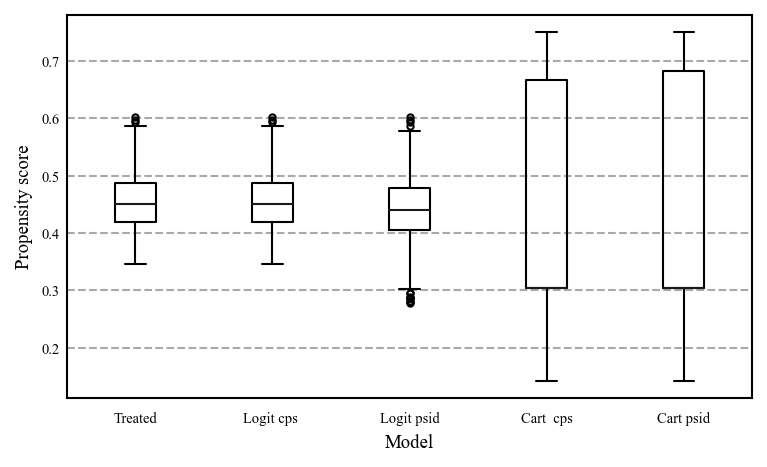

In [120]:
# Box plots of estimated propensity scores across each model - CPS group 

fig, ax = plt.subplots(figsize=(5, 3))

# Neat formatting for plots 
plt.rcParams.update({"figure.dpi": 150}) 
plt.rcParams.update(bundles.neurips2022())
plt.rcParams.update(fonts.neurips2022())
plt.rcParams.update(axes.tick_direction( y="in"))
plt.rcParams.update(axes.color(base="black"))
plt.rcParams.update(figsizes.neurips2022())
plt.rcParams.update(fontsizes.neurips2022())

ax.set_facecolor('white')
# Set boarder colour 
for spine in ax.spines:
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1)

ax.grid(color='darkgrey', axis='y', linestyle='--', linewidth=1, alpha=1)
ax.grid(color='white', axis='x')

# Cusotmise median line 
medianprops = dict(linestyle='-', linewidth = 1, color='k')
boxprops = dict(linewidth = 1)
whiskerprops = dict(linewidth = 1)
capprops = dict(linewidth = 1)

flierprops = {'marker': 'o', 'markersize': 3,'linewidth':1}


treated_propensity_PS = logitNswCps_lalonde['propensity_score'][logitNswCps_lalonde['treat']==1]

Logit_Cpscomprison_PS = logitNswCps_lalonde['propensity_score'][logitNswCps_lalonde['treat']==0]
Logit_Psidcomprison_PS = logitNswPsid_lalonde['propensity_score'][logitNswPsid_lalonde['treat']==0]

cart_Cpscomprison_PS = cartNswCps_lalonde['propensity_score'][cartNswCps_lalonde['treat']==0]
cart_Psidcomprison_PS = cartNswPsid_lalonde['propensity_score'][cartNswPsid_lalonde['treat']==0]

ax.boxplot([treated_propensity_PS,Logit_Cpscomprison_PS,Logit_Psidcomprison_PS,cart_Cpscomprison_PS,cart_Psidcomprison_PS],
            medianprops=medianprops,
            boxprops = boxprops,
            whiskerprops=whiskerprops,
            capprops = capprops ,
            flierprops = flierprops,
            widths=0.3) 

#ax.set_xlim(0.5,5.5)
#ax.set_ylim(-2000,62000)

plt.xticks([1,2,3,4,5],['Treated', 'Logit cps ','Logit psid','Cart  cps','Cart psid'])


ax.set_xlabel('Model')

ax.set_ylabel('Propensity score')

plt.savefig('/Users/mawuliagamah/gitprojects/causal_inference/causal_inference/Jupyter notebooks/lalonde_notebook_plots/_boxplots.png', bbox_inches='tight')

plt.show()